In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
import gc

gc.collect()

263

In [5]:
from huggingface_hub import login
import os

token_file_path = 'secrets.txt'

if os.path.exists(token_file_path):
    try:
        with open(token_file_path, 'r') as f:
            hf_token = f.read().strip()  # .strip() removes any leading/trailing whitespace

        login(token=hf_token)
        print("Successfully logged in to Hugging Face!")

    except Exception as e:
        print(f"An error occurred while trying to read the token file or log in: {e}")
else:
    print(f"Token file not found at {token_file_path}. Please create the file and add your token.")

/home/jovyan/.local/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Successfully logged in to Hugging Face!


In [1]:
from data_utils import SIFT50MDataset
import os
from datasets import load_dataset, Dataset

sift_dataset = load_dataset(
    'amazon-agi/SIFT-50M',
    #name='closed_ended_comparison',
    name = 'closed_ended_content_level',
    split='train',
    trust_remote_code=True
)

sift_dataset_test = load_dataset(
    'amazon-agi/SIFT-50M',
    #name='closed_ended_comparison',
    name = 'closed_ended_content_level',
    split='EvalSIFT',
    trust_remote_code=True
) 

# Define the allowed data sources
allowed_values = ["common_voice_de", "common_voice_en", "vctk_en"]

# Define a filter function
def filter_data_source(example):
    return example["data_source"] in allowed_values

filtered_sift_data = sift_dataset.filter(filter_data_source)
filtered_sift_data_test = sift_dataset_test.filter(filter_data_source)

#df = sift_dataset.select(range(1000)).to_pandas()
print(len(filtered_sift_data))
print(len(filtered_sift_data_test))
#filtered_df = df[df["data_source"].isin(allowed_values)]

# Count number of entries per value
#counts = filtered_df["data_source"].value_counts()
#print(counts)
#sift_data = Dataset.from_pandas(filtered_df)
# Define the base datasets paths (replace with your actual paths)

'''print('Training set')
counts = filtered_sift_data.to_pandas()["data_source"].value_counts()
print(counts)
print('Evaluation set')
counts = filtered_sift_data_eval.to_pandas()["data_source"].value_counts()'''


Resolving data files:   0%|          | 0/1780 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/1450 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/1780 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/1450 [00:00<?, ?it/s]

3966476
601


'print(\'Training set\')\ncounts = filtered_sift_data.to_pandas()["data_source"].value_counts()\nprint(counts)\nprint(\'Evaluation set\')\ncounts = filtered_sift_data_eval.to_pandas()["data_source"].value_counts()'

In [1]:
import pandas as pd

csv_de = pd.read_csv('./data/common_voice_de_eval_mapping.csv')
filtered_mask=csv_de['audio_path'].str.contains('common_voice_de_17733078')

print(csv_de[filtered_mask])

Empty DataFrame
Columns: [Unnamed: 0, id, audio_path]
Index: []


In [15]:
dataset = load_dataset("mozilla-foundation/common_voice_15_0", 'en', split="train", trust_remote_code=True)
print(len(dataset))

1070066


In [2]:
base_datasets_root = "/home/jovyan/.cache/huggingface/datasets"
base_datasets_paths = {
    "common_voice_de": None, # No longer needs a path, handled by load_dataset
    #"multilingual_librispeech_de": None, # No longer needs a path, handled by load_dataset
    "common_voice_en": None, # No longer needs a path, handled by load_dataset
    "vctk_en": "./vctk_corpus" # VCTK still needs a root path for torchaudio
}

In [3]:
sift_iterable_dataset_eval = SIFT50MDataset(sift_dataset=filtered_sift_data_test, base_datasets_paths=base_datasets_paths, test_set=True)

for x in sift_iterable_dataset_eval:
    print(x)
    break

{'id': 'common_voice_de_25543288', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25543288.mp3', 'type': 'audio'}, {'text': 'Ist das Audio für ein erwachsenes Publikum geeignet?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Ja, das Audio ist für ein erwachsenes Publikum geeignet.', 'audio_path': None, 'type': 'text'}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


# Clean Audio

## audio doesn't exist for some samples

In [13]:
import random
from IPython.display import Audio, display

# Take a few random samples
num_samples = 7
samples = [example for _, example in zip(range(num_samples), sift_iterable_dataset_eval)]

for idx, sample in enumerate(samples):
    print(f"\nSample {idx+1}:")
    for message in sample.get("messages", []):
        audio_text = None
        audio_path = None
        print(message)
        # Extract audio and its associated text safely
        for item in message.get("content", []):
            item_type = item.get("type")
            if item_type == "audio" and item.get("audio_path"):
                audio_path = item.get("audio_path")
            elif item_type == "text" and item.get("text"):
                audio_text = item.get("text")
        
        # Display text first
        if audio_text:
            print("Text:", audio_text)
        # Then display audio
        if audio_path:
            display(Audio(audio_path))


['common_voice_de_25543288']
common_voice_de_25543288
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25543288.mp3
{'id': 'common_voice_de_25543288', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25543288.mp3', 'type': 'audio'}, {'text': 'Ist das Audio für ein erwachsenes Publikum geeignet?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Ja, das Audio ist für ein erwachsenes Publikum geeignet.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_24978926']
common_voice_de_24978926
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_tes

{'role': 'assistant', 'content': [{'text': 'Ja, das Audio ist für ein erwachsenes Publikum geeignet.', 'audio_path': None}]}

Sample 2:
{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24978926.mp3', 'type': 'audio'}, {'text': 'Um wie viele Uhr spielt die Frau in der Audiodatei über den Canal de la Marne au Rhin und die Bahnlinie Straßburg-Metz?', 'audio_path': None, 'type': 'text'}]}
Text: Um wie viele Uhr spielt die Frau in der Audiodatei über den Canal de la Marne au Rhin und die Bahnlinie Straßburg-Metz?


{'role': 'assistant', 'content': [{'text': 'Leider kann ich aus der Audio-Datei nicht hören, um wie viele Uhr die Frau spricht. Die Metadaten enthalten diese Information nicht.', 'audio_path': None}]}

Sample 3:
{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17848124.mp3', 'type': 'audio'}, {'text': 'Was steht auf dem Pannenstreifen, das der Sprecher im Audioclip erwähnt?', 'audio_path': None, 'type': 'text'}]}
Text: Was steht auf dem Pannenstreifen, das der Sprecher im Audioclip erwähnt?


{'role': 'assistant', 'content': [{'text': 'Auf dem Pannenstreifen steht ein defekter LKW.', 'audio_path': None}]}

Sample 4:
{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19114882.mp3', 'type': 'audio'}, {'text': 'Ist die Stimme auf dem Audioclip weiblich oder männlich?', 'audio_path': None, 'type': 'text'}]}
Text: Ist die Stimme auf dem Audioclip weiblich oder männlich?


{'role': 'assistant', 'content': [{'text': 'Die Stimme ist männlich.', 'audio_path': None}]}

Sample 5:
{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_20040751.wav'}, {'text': 'Gibt es Unterschiede zwischen den Geschlechtern in Bezug auf Suizidgedanken in Europa?', 'audio_path': None, 'type': 'text'}]}
Text: Gibt es Unterschiede zwischen den Geschlechtern in Bezug auf Suizidgedanken in Europa?
{'role': 'assistant', 'content': [{'text': 'Laut der vorliegenden Informationen gibt es keine Angaben zur Verteilung von Suizidgedanken zwischen den Geschlechtern in Europa.', 'audio_path': None}]}

Sample 6:
{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20136657.mp3', 'type': 'audio'}, {'text': 'In welchem Akzent spricht die Person auf dem Audioclip?', 'audio_path': None, 'type': 'text'}]}
Text: I

{'role': 'assistant', 'content': [{'text': 'Die Person spricht mit einem deutschen Akzent aus Deutschland.', 'audio_path': None}]}

Sample 7:
{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23596171.mp3', 'type': 'audio'}, {'text': 'Ist das Audio für ein männliches oder weibliches Publikum bestimmt?', 'audio_path': None, 'type': 'text'}]}
Text: Ist das Audio für ein männliches oder weibliches Publikum bestimmt?


{'role': 'assistant', 'content': [{'text': 'Das Audio ist für ein männliches Publikum bestimmt.', 'audio_path': None}]}


# Noise Audio

In [8]:
from datasets import load_dataset
from IPython.display import Audio

# Load MUSAN noise dataset in streaming mode
dataset = load_dataset("bilguun/musan-noise", split="train", streaming=True)

# Iterate over 3 samples
for idx, example in enumerate(dataset.take(3)):
    audio_dict = example["audio"]  # this is a dict
    waveform = audio_dict["array"] # numpy array
    sampling_rate = audio_dict["sampling_rate"] # e.g., 16000
    
    print(f"Sample {idx+1}:")
    display(Audio(waveform, rate=sampling_rate))


Resolving data files:   0%|          | 0/930 [00:00<?, ?it/s]

Sample 1:


Sample 2:


Sample 3:


# Added Noise to one sample

['common_voice_de_25543288']
common_voice_de_25543288
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25543288.mp3
{'id': 'common_voice_de_25543288', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25543288.mp3', 'type': 'audio'}, {'text': 'Ist das Audio für ein erwachsenes Publikum geeignet?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Ja, das Audio ist für ein erwachsenes Publikum geeignet.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Resolving data files:   0%|          | 0/930 [00:00<?, ?it/s]

Clean Audio:


Noisy Audio @ 0 dB SNR:


Noisy Audio @ 10 dB SNR:


Noisy Audio @ 20 dB SNR:


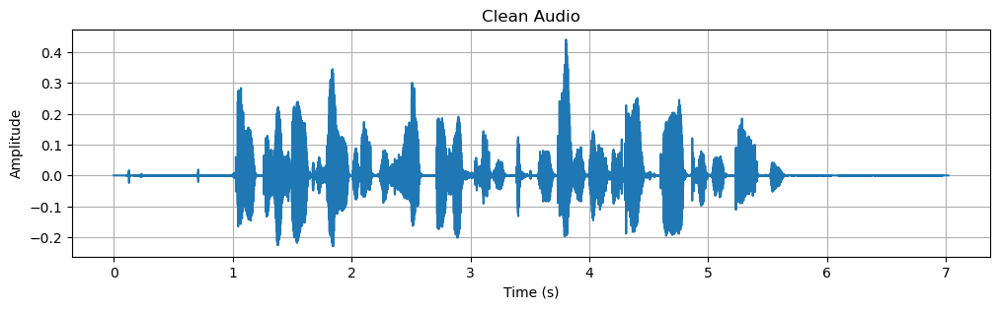

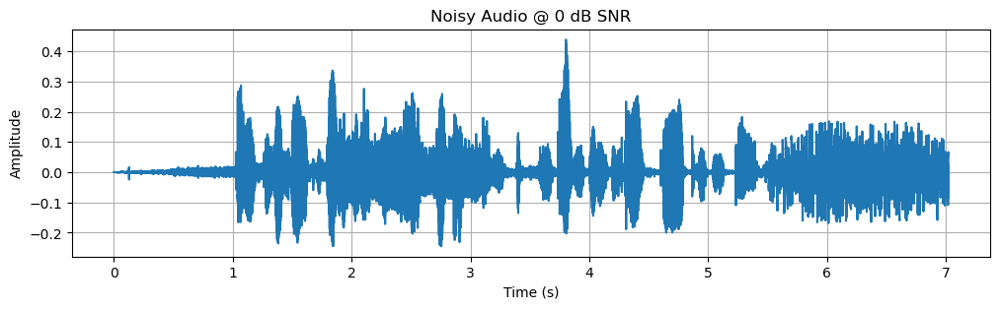

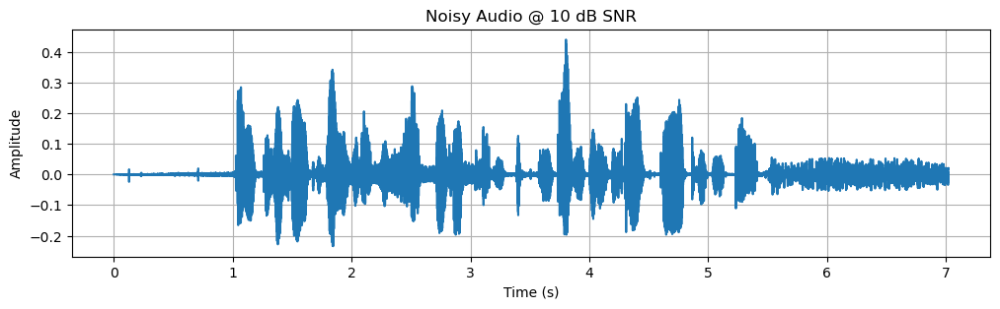

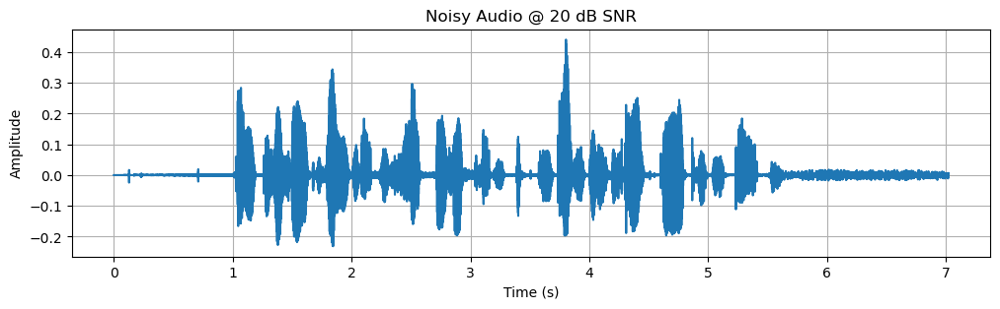

In [9]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import torchaudio
import torchaudio.functional as F
from datasets import load_dataset
from IPython.display import Audio, display

# ----------------------
# Load one clean sample
# ----------------------
sample = next(iter(sift_iterable_dataset_eval))  # pick first sample
speech_path = None

# Extract the first audio path safely
for message in sample.get("messages", []):
    for item in message.get("content", []):
        if item.get("type") == "audio" and item.get("audio_path"):
            speech_path = item.get("audio_path")
            break
    if speech_path:
        break

if speech_path is None:
    raise ValueError("No audio found in the sample!")

# Load clean audio
speech, sr = torchaudio.load(speech_path)
if speech.size(0) > 1:  # convert to mono if needed
    speech = torch.mean(speech, dim=0, keepdim=True)

# ----------------------
# Load one noise sample from MUSAN
# ----------------------
noise_dataset = load_dataset("bilguun/musan-noise", split="train", streaming=True)
noise_sample = next(iter(noise_dataset))
noise_waveform = torch.tensor(noise_sample["audio"]["array"], dtype=torch.float32).unsqueeze(0)
noise_sr = noise_sample["audio"]["sampling_rate"]

# Resample if needed
if noise_sr != sr:
    resampler = torchaudio.transforms.Resample(orig_freq=noise_sr, new_freq=sr)
    noise_waveform = resampler(noise_waveform)

# Truncate or pad noise to match speech length
if noise_waveform.size(1) < speech.size(1):
    repeats = (speech.size(1) // noise_waveform.size(1)) + 1
    noise_waveform = noise_waveform.repeat(1, repeats)
noise_waveform = noise_waveform[:, :speech.size(1)]

# ----------------------
# Add noise at different SNRs using torchaudio.functional.add_noise
# Reference: https://docs.pytorch.org/audio/stable/tutorials
#/audio_data_augmentation_tutorial.html#background-noise
snr_dbs = torch.tensor([0, 10, 20])  # multiple SNRs
noisy_speeches = F.add_noise(speech, noise_waveform, snr_dbs)  # shape: [num_snrs, 1, T]

# ----------------------
# Listen
# ----------------------
print("Clean Audio:")
display(Audio(speech.squeeze().numpy(), rate=sr))

for i, snr in enumerate(snr_dbs):
    print(f"Noisy Audio @ {snr.item()} dB SNR:")
    display(Audio(noisy_speeches[i].squeeze().numpy(), rate=sr))

    def plot_waveform(waveform, sr, title="Waveform"):
        waveform = waveform.squeeze().numpy()
        time_axis = np.arange(len(waveform)) / sr
        plt.figure(figsize=(12, 3))
        plt.plot(time_axis, waveform)
        plt.title(title)
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")
        plt.grid(True)
        plt.show()

# Plot clean audio
plot_waveform(speech, sr, title="Clean Audio")

# Plot noisy versions
for i, snr in enumerate(snr_dbs):
    plot_waveform(noisy_speeches[i], sr, title=f"Noisy Audio @ {snr.item()} dB SNR")

# Noise added to full test set

In [11]:
import os
import torch
import torchaudio
import torchaudio.functional as F
from tqdm import tqdm
from datasets import load_dataset

# ----------------------
# Output directory
# ----------------------
output_dir = "./data/eval_audio_dataset"
os.makedirs(output_dir, exist_ok=True)

# SNR levels
snr_levels = torch.tensor([0, 10, 20])

# ----------------------
# Load noise dataset (streaming)
# ----------------------
noise_dataset = load_dataset("bilguun/musan-noise", split="train", streaming=True)
noise_iter = iter(noise_dataset)  # iterator for picking noise

# ----------------------
# Process clean dataset
# ----------------------
for idx, clean_sample in enumerate(tqdm(sift_iterable_dataset_eval, desc="Processing clean samples")):

    # ----------------------
    # Extract audio path safely
    # ----------------------
    speech_path = None
    for message in clean_sample.get("messages", []):
        for item in message.get("content", []):
            if item.get("type") == "audio" and item.get("audio_path"):
                speech_path = item.get("audio_path")
                break
        if speech_path:
            break

    if speech_path is None:
        continue  # skip if no audio found

    # ----------------------
    # Load clean audio
    # ----------------------
    speech, sr = torchaudio.load(speech_path)
    if speech.size(0) > 1:
        speech = torch.mean(speech, dim=0, keepdim=True)  # convert to mono

    # Save clean audio
    clean_filename = os.path.join(output_dir, f"sample_{idx}_clean.wav")
    torchaudio.save(clean_filename, speech, sr)

    # ----------------------
    # Pick one noise sample
    # ----------------------
    noise_sample = next(noise_iter)
    noise_array = noise_sample["audio"]["array"]
    noise_sr = noise_sample["audio"]["sampling_rate"]
    noise = torch.tensor(noise_array, dtype=torch.float32).unsqueeze(0)

    # Resample noise if needed
    if noise_sr != sr:
        resampler = torchaudio.transforms.Resample(orig_freq=noise_sr, new_freq=sr)
        noise = resampler(noise)
        noise_sr = sr

    # Truncate or repeat noise to match speech length
    speech_len = speech.size(1)
    noise_len = noise.size(1)
    if noise_len < speech_len:
        repeat_factor = (speech_len // noise_len) + 1
        noise = noise.repeat(1, repeat_factor)
    noise = noise[:, :speech_len]  # exact match

    # ----------------------
    # Add noise at multiple SNRs
    # ----------------------
    noisy_speeches = F.add_noise(speech, noise, snr_levels)  # [num_snrs, 1, T]

    # ----------------------
    # Save noisy audios
    # ----------------------
    for i, snr in enumerate(snr_levels):
        noisy = noisy_speeches[i]
        if noisy.dim() == 1:
            noisy = noisy.unsqueeze(0)
        noisy = noisy.to(torch.float32)
        noisy_filename = os.path.join(output_dir, f"sample_{idx}_noisy_{snr}dB.wav")
        torchaudio.save(noisy_filename, noisy, sr, channels_first=True)


Resolving data files:   0%|          | 0/930 [00:00<?, ?it/s]

Processing clean samples: 0it [00:00, ?it/s]

['common_voice_de_25543288']
common_voice_de_25543288
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25543288.mp3
{'id': 'common_voice_de_25543288', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25543288.mp3', 'type': 'audio'}, {'text': 'Ist das Audio für ein erwachsenes Publikum geeignet?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Ja, das Audio ist für ein erwachsenes Publikum geeignet.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 1it [00:00,  2.47it/s]

['common_voice_de_24978926']
common_voice_de_24978926
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24978926.mp3
{'id': 'common_voice_de_24978926', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24978926.mp3', 'type': 'audio'}, {'text': 'Um wie viele Uhr spielt die Frau in der Audiodatei über den Canal de la Marne au Rhin und die Bahnlinie Straßburg-Metz?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Leider kann ich aus der Audio-Datei nicht hören, um wie viele Uhr die Frau spricht. Die Metadaten enthalten diese Information nicht.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 2it [00:00,  2.81it/s]

['common_voice_de_17848124']
common_voice_de_17848124
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17848124.mp3
{'id': 'common_voice_de_17848124', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17848124.mp3', 'type': 'audio'}, {'text': 'Was steht auf dem Pannenstreifen, das der Sprecher im Audioclip erwähnt?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Auf dem Pannenstreifen steht ein defekter LKW.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 3it [00:01,  2.84it/s]

['common_voice_de_19114882']
common_voice_de_19114882
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19114882.mp3
{'id': 'common_voice_de_19114882', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19114882.mp3', 'type': 'audio'}, {'text': 'Ist die Stimme auf dem Audioclip weiblich oder männlich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 6it [00:01,  5.10it/s]

['common_voice_de_20040751']
common_voice_de_20040751
None
{'id': 'common_voice_de_20040751', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_20040751.wav'}, {'text': 'Gibt es Unterschiede zwischen den Geschlechtern in Bezug auf Suizidgedanken in Europa?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Laut der vorliegenden Informationen gibt es keine Angaben zur Verteilung von Suizidgedanken zwischen den Geschlechtern in Europa.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_20136657']
common_voice_de_20136657
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20136657.mp3
{'id': 'common_voice_de_20136657', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extrac

Processing clean samples: 8it [00:01,  4.88it/s]

['common_voice_de_22904309']
common_voice_de_22904309
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_22904309.mp3
{'id': 'common_voice_de_22904309', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_22904309.mp3', 'type': 'audio'}, {'text': 'In welchem Alterskategorie fällt der Sprecher des Audios?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Der Sprecher fällt in die Alterskategorie 'zwanziger'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_21312549']
common_voice_de_21312549
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_

Processing clean samples: 9it [00:02,  4.58it/s]

['common_voice_de_17580500']
common_voice_de_17580500
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17580500.mp3
{'id': 'common_voice_de_17580500', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17580500.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Person, die auf dem Audioclip zu hören ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist Anfang dreißig.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 10it [00:02,  4.53it/s]

['common_voice_de_21129964']
common_voice_de_21129964
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21129964.mp3
{'id': 'common_voice_de_21129964', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21129964.mp3', 'type': 'audio'}, {'text': 'Thema der Audioaufnahme?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Das Thema der Audioaufnahme ist die Unterstützung des Parlaments bei der Stärkung der Sicherheit des Seeverkehrs ('Das Parlament unterstützt uns erneut in der Frage der Stärkung der Sicherheit des Seeverkehrs.').", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 11it [00:02,  4.37it/s]

['common_voice_de_17848126']
common_voice_de_17848126
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17848126.mp3
{'id': 'common_voice_de_17848126', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17848126.mp3', 'type': 'audio'}, {'text': 'In welchem Akzent spricht die Person in dem Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person spricht mit einem deutschen Akzent aus Deutschland.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 12it [00:02,  4.38it/s]

['common_voice_de_17841877']
common_voice_de_17841877
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17841877.mp3
{'id': 'common_voice_de_17841877', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17841877.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Stimme, die auf dem Audio-Clip zu hören ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme gehört zu einer Person im zwanziger Altersbereich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 13it [00:03,  4.15it/s]

['common_voice_de_19046820']
common_voice_de_19046820
None
{'id': 'common_voice_de_19046820', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_19046820.wav'}, {'text': 'Wie alt ist die Person, die auf dem Audio spricht?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist zwischen 20 und 30 Jahre alt.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_20369780']
common_voice_de_20369780
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20369780.mp3
{'id': 'common_voice_de_20369780', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20369780.mp3', 'type': 'au

Processing clean samples: 15it [00:03,  5.32it/s]

['common_voice_de_20272288']
common_voice_de_20272288
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20272288.mp3
{'id': 'common_voice_de_20272288', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20272288.mp3', 'type': 'audio'}, {'text': 'Welche Position hat der Sprecher an der Universität Heidelberg?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher ist außerplanmäßiger Professor an der Medizinischen Fakultät der Universität Heidelberg.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 16it [00:03,  4.89it/s]

['common_voice_de_19588757']
common_voice_de_19588757
None
{'id': 'common_voice_de_19588757', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_19588757.wav'}, {'text': 'Ist der Sprecher des Audios eine männliche oder weibliche Person?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_19541192']
common_voice_de_19541192
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19541192.mp3
{'id': 'common_voice_de_19541192', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19541192.mp3', 'type': 'audio

Processing clean samples: 18it [00:03,  5.96it/s]

['common_voice_de_19937214']
common_voice_de_19937214
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19937214.mp3
{'id': 'common_voice_de_19937214', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19937214.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Person, die in dem Audio spricht?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist in den Dreißigern.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 20it [00:04,  4.60it/s]

['common_voice_de_17863635']
common_voice_de_17863635
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17863635.mp3
{'id': 'common_voice_de_17863635', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17863635.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Person, die auf dem Audioclip zu hören ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist Anfang dreißig.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_27044310']
common_voice_de_27044310
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de

Processing clean samples: 21it [00:04,  4.52it/s]

['common_voice_de_27023279']
common_voice_de_27023279
None
{'id': 'common_voice_de_27023279', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_27023279.wav'}, {'text': 'Was sind die Sprache und die Aussage des Sprechers im Audio bezüglich der mutmaßlichen Belästigung?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher spricht Deutsch und hat angegeben, das Mädchen nicht sexuell belästigt zu haben.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_20012236']
common_voice_de_20012236
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20012236.mp3
{'id': 'common_voice_de_20012236', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd

Processing clean samples: 23it [00:04,  5.58it/s]

['common_voice_de_22904309']
common_voice_de_22904309
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_22904309.mp3
{'id': 'common_voice_de_22904309', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_22904309.mp3', 'type': 'audio'}, {'text': 'Wie lang werden die Fische, über die in dem Audio gesprochen wird, wahrscheinlich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Fische werden sieben bis acht Zentimeter lang.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 24it [00:05,  5.24it/s]

['common_voice_de_19588758']
common_voice_de_19588758
None
{'id': 'common_voice_de_19588758', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_19588758.wav'}, {'text': 'Welche Art von Unternehmen ist auf dem Audioclip zu hören?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Es sind Tochterunternehmen mit unterschiedlichen Schwerpunkten und Aufgaben zu hören.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_23612022']
common_voice_de_23612022
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23612022.mp3
{'id': 'common_voice_de_23612022', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_

Processing clean samples: 26it [00:05,  5.60it/s]

['common_voice_de_30037940']
common_voice_de_30037940
None
{'id': 'common_voice_de_30037940', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_30037940.wav'}, {'text': 'Welchen Altersbereich spricht der Sprecher in diesem Audio an?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher spricht in diesem Audio Männer in den Dreißigern an.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_25213169']
common_voice_de_25213169
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25213169.mp3
{'id': 'common_voice_de_25213169', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_vo

Processing clean samples: 28it [00:05,  6.42it/s]

['common_voice_de_17685490']
common_voice_de_17685490
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17685490.mp3
{'id': 'common_voice_de_17685490', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17685490.mp3', 'type': 'audio'}, {'text': 'In welchem Land könnte die Person, die im Audio spricht, herkommen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person, die im Audio spricht, hat einen Deutschland-Deutsch Akzent.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 29it [00:06,  5.67it/s]

['common_voice_de_19655742']
common_voice_de_19655742
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19655742.mp3
{'id': 'common_voice_de_19655742', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19655742.mp3', 'type': 'audio'}, {'text': 'Konnte man in dem Audio etwas über Fahrzeuge und Gleise hören?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Ja, es wurde darüber gesprochen, dass bereits Fahrzeuge gesammelt und Gleise gelegt wurden.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 30it [00:06,  5.21it/s]

['common_voice_de_18291465']
common_voice_de_18291465
None
{'id': 'common_voice_de_18291465', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_18291465.wav'}, {'text': 'Wie alt ist die Person, die auf dem Audioclip zu hören ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist zwischen 20 und 30 Jahre alt.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_19784411']
common_voice_de_19784411
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19784411.mp3
{'id': 'common_voice_de_19784411', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19784411.mp3', 't

Processing clean samples: 32it [00:06,  5.96it/s]

['common_voice_de_27597880']
common_voice_de_27597880
None
{'id': 'common_voice_de_27597880', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_27597880.wav'}, {'text': 'Kann man anhand der Stimme sagen, ob der Sprecher kluge und effektive Wirtschaftspolitik betrieben hat?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Nein, anhand der Stimme kann man nicht sagen, ob der Sprecher kluge und effektive Wirtschaftspolitik betrieben hat. Diese Information ist durch das Transkript gegeben: 'Herzog Jakob zeichnete sich durch eine überaus kluge und effektive Wirtschaftspolitik aus.'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_18684750']
common_voice_de_18684750
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18684750.mp3
{'id': 'common_

Processing clean samples: 34it [00:06,  6.80it/s]

['common_voice_de_20266992']
common_voice_de_20266992
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20266992.mp3
{'id': 'common_voice_de_20266992', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20266992.mp3', 'type': 'audio'}, {'text': 'Welchem Arrondissement gehört die Sprecherin/der Sprecher an?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Er/Sie gehört zum Arrondissement Coutances.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 35it [00:07,  5.90it/s]

['common_voice_de_23692151']
common_voice_de_23692151
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23692151.mp3
{'id': 'common_voice_de_23692151', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23692151.mp3', 'type': 'audio'}, {'text': 'Ist das Audio für Männer oder Frauen gedacht?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Das Audio ist für Frauen gedacht.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 36it [00:07,  5.06it/s]

['common_voice_de_19165289']
common_voice_de_19165289
None
{'id': 'common_voice_de_19165289', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_19165289.wav'}, {'text': 'Enthält das Audio Informationen über die Atmung der abgebildeten Organismen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Ja, es wird erwähnt, dass die Organismen obligat aerob sind.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_19734161']
common_voice_de_19734161
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19734161.mp3
{'id': 'common_voice_de_19734161', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/

Processing clean samples: 38it [00:07,  5.72it/s]

['common_voice_de_18047602']
common_voice_de_18047602
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18047602.mp3
{'id': 'common_voice_de_18047602', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18047602.mp3', 'type': 'audio'}, {'text': 'Welche Stadt war die Hauptstadt von Britisch-Indien?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Kalkutta war die Hauptstadt von Britisch-Indien.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 39it [00:07,  5.28it/s]

['common_voice_de_27055531']
common_voice_de_27055531
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27055531.mp3
{'id': 'common_voice_de_27055531', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27055531.mp3', 'type': 'audio'}, {'text': 'In welchem Akzent ist die gesprochene Sprache im Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die gesprochene Sprache im Audio ist in Deutschland-Deutsch.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 40it [00:08,  4.51it/s]

['common_voice_de_19144821']
common_voice_de_19144821
None
{'id': 'common_voice_de_19144821', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_19144821.wav'}, {'text': 'Gibt es im Audio irgendeine Erwähnung von Juckreiz?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Ja, es wird von einem intensiven Juckreiz gesprochen.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_23612021']
common_voice_de_23612021
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23612021.mp3
{'id': 'common_voice_de_23612021', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23612021.mp3', '

Processing clean samples: 42it [00:08,  5.25it/s]

['common_voice_de_20003126']
common_voice_de_20003126
None
{'id': 'common_voice_de_20003126', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_20003126.wav'}, {'text': 'Welches Geschlecht haben die Sprecher im Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Alle Sprecher im Audio sind männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_23559503']
common_voice_de_23559503
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23559503.mp3
{'id': 'common_voice_de_23559503', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23559503.mp3', 'type': 'audio'}, {'t

Processing clean samples: 44it [00:08,  5.50it/s]

['common_voice_de_22904261']
common_voice_de_22904261
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_22904261.mp3
{'id': 'common_voice_de_22904261', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_22904261.mp3', 'type': 'audio'}, {'text': 'Welchen Dialekt spricht der Sprecher in dem Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher spricht Österreichisches Deutsch.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 45it [00:09,  5.04it/s]

['common_voice_de_19758851']
common_voice_de_19758851
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19758851.mp3
{'id': 'common_voice_de_19758851', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19758851.mp3', 'type': 'audio'}, {'text': 'Hat der Sprecher neben der Sprache noch ein weiteres Fach studiert?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Ja, der Sprecher hat neben der Sprache noch Schulmusik und zusätzlich Orgel bei Elinor von der Heyde-Dohrn studiert.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 46it [00:09,  4.60it/s]

['common_voice_de_17331370']
common_voice_de_17331370
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17331370.mp3
{'id': 'common_voice_de_17331370', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17331370.mp3', 'type': 'audio'}, {'text': 'Ist der Sprecher männlichen oder weiblichen Geschlechts?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 47it [00:09,  4.28it/s]

['common_voice_de_20214707']
common_voice_de_20214707
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20214707.mp3
{'id': 'common_voice_de_20214707', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20214707.mp3', 'type': 'audio'}, {'text': 'Ist die Stimme männlich oder weiblich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 49it [00:10,  4.46it/s]

['common_voice_de_28218356']
common_voice_de_28218356
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_28218356.mp3
{'id': 'common_voice_de_28218356', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_28218356.mp3', 'type': 'audio'}, {'text': 'Welches Alter hat die Stimme, die auf der Audiodatei zu hören ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme ist zwischen 20 und 30 Jahre alt.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_22748777']
common_voice_de_22748777
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_t

Processing clean samples: 50it [00:10,  4.28it/s]

['common_voice_de_20136657']
common_voice_de_20136657
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20136657.mp3
{'id': 'common_voice_de_20136657', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20136657.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Person, die auf dem Audioclip zu hören ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist Anfang dreißig.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 51it [00:10,  4.35it/s]

['common_voice_de_20040759']
common_voice_de_20040759
None
{'id': 'common_voice_de_20040759', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_20040759.wav'}, {'text': 'Um welche Zielgruppe richtet sich das Audio, das eine Puppe mit einer geheimnisvollen Inschrift erwähnt?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Das Audio ist für Teenager bestimmt.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_21136856']
common_voice_de_21136856
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21136856.mp3
{'id': 'common_voice_de_21136856', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_tes

Processing clean samples: 53it [00:10,  5.49it/s]

['common_voice_de_21136952']
common_voice_de_21136952
None
{'id': 'common_voice_de_21136952', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_21136952.wav'}, {'text': 'Ist der Sprecher auf dem Audio-Clip eine Frau oder ein Mann?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher auf dem Audio-Clip ist ein Mann.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_24969792']
common_voice_de_24969792
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24969792.mp3
{'id': 'common_voice_de_24969792', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24969792.mp3', 

Processing clean samples: 55it [00:11,  6.02it/s]

['common_voice_de_19144634']
common_voice_de_19144634
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19144634.mp3
{'id': 'common_voice_de_19144634', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19144634.mp3', 'type': 'audio'}, {'text': 'In welchem Geschlecht ist die Stimme der gesprochenen Person einzuordnen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 57it [00:12,  3.27it/s]

['common_voice_de_17452725']
common_voice_de_17452725
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17452725.mp3
{'id': 'common_voice_de_17452725', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17452725.mp3', 'type': 'audio'}, {'text': 'Ist die Art und Weise, wie die Person auf dem Audio-Clip spricht, für sie typisch?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Nein, das ist nicht typisch für die Art, wie sie spricht.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_19625120']
common_voice_de_19625120
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4

Processing clean samples: 59it [00:12,  3.74it/s]

['common_voice_de_27703547']
common_voice_de_27703547
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27703547.mp3
{'id': 'common_voice_de_27703547', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27703547.mp3', 'type': 'audio'}, {'text': 'Ist der Sprecher des Audios männlich oder weiblich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_19730349']
common_voice_de_19730349
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19730349.mp

Processing clean samples: 60it [00:12,  3.96it/s]

['common_voice_de_17688454']
common_voice_de_17688454
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17688454.mp3
{'id': 'common_voice_de_17688454', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17688454.mp3', 'type': 'audio'}, {'text': 'Um welche Tätigkeit kümmert sich die Person im Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person pustet kräftig in die Glut, um ein Feuer anzufachen.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 61it [00:13,  4.12it/s]

['common_voice_de_19978092']
common_voice_de_19978092
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19978092.mp3
{'id': 'common_voice_de_19978092', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19978092.mp3', 'type': 'audio'}, {'text': 'Ist die Stimme auf dem Audio-Clip männlich oder weiblich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 62it [00:14,  1.61it/s]

['common_voice_de_20061209']
common_voice_de_20061209
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20061209.mp3
{'id': 'common_voice_de_20061209', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20061209.mp3', 'type': 'audio'}, {'text': 'Können Sie etwas über das Thema des Audios sagen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Aus dem Transkript des Audios geht hervor, dass es um die Aufnahme von Berber-Flüchtlingen geht.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 63it [00:14,  1.91it/s]

['common_voice_de_24104105']
common_voice_de_24104105
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24104105.mp3
{'id': 'common_voice_de_24104105', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24104105.mp3', 'type': 'audio'}, {'text': 'Wer hat in Navarra die erste Volkszählung durchgeführt und aus welchem Land stammt seine Sprache?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Es wurde durchgeführt von jemandem mit einem deutschen Akzent, also stammt seine Sprache wahrscheinlich aus Deutschland.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 64it [00:15,  2.26it/s]

['common_voice_de_19588759']
common_voice_de_19588759
None
{'id': 'common_voice_de_19588759', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_19588759.wav'}, {'text': 'Wo wurde der Film gedreht?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Film wurde in North Carolina und in England gedreht.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_19691488']
common_voice_de_19691488
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19691488.mp3
{'id': 'common_voice_de_19691488', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19691488.mp3', 'type': 'audio'}, {'tex

Processing clean samples: 66it [00:15,  3.45it/s]

['common_voice_de_19647019']
common_voice_de_19647019
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19647019.mp3
{'id': 'common_voice_de_19647019', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19647019.mp3', 'type': 'audio'}, {'text': 'Um was geht es in dem Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Im Audio geht es um Schäden an Vegetation und Landwirtschaft durch Starkregen.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 67it [00:15,  3.68it/s]

['common_voice_de_24602798']
common_voice_de_24602798
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24602798.mp3
{'id': 'common_voice_de_24602798', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24602798.mp3', 'type': 'audio'}, {'text': 'Welche Sprache spricht der Sprecher und welches Thema wird in der Audiodatei angesprochen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher spricht Deutsch und das Thema der Audiodatei ist Frieden und Gerechtigkeit.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 68it [00:15,  3.88it/s]

['common_voice_de_23618077']
common_voice_de_23618077
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23618077.mp3
{'id': 'common_voice_de_23618077', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23618077.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Person, die auf dem Audio-Clip spricht?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist in den Dreißigern.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 69it [00:16,  3.91it/s]

['common_voice_de_25041679']
common_voice_de_25041679
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25041679.mp3
{'id': 'common_voice_de_25041679', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25041679.mp3', 'type': 'audio'}, {'text': 'Welche Sprache sprechen die Leute in der Audiodatei und welches Thema wird angesprochen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'In der Audiodatei sprechen die Leute Deutsch und das Thema ist der Bau von Deichen zum Schutz einer Baugrube.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 71it [00:16,  4.06it/s]

['common_voice_de_24474545']
common_voice_de_24474545
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24474545.mp3
{'id': 'common_voice_de_24474545', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24474545.mp3', 'type': 'audio'}, {'text': 'Was ist das Hauptthema des Audios und in welcher Sprache wurde es gesprochen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Das Hauptthema des Audios ist Umweltschutz und es wurde auf Deutsch gesprochen.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_20581707']
common_voice_de_20581707
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd1293

Processing clean samples: 72it [00:16,  4.20it/s]

['common_voice_de_20232033']
common_voice_de_20232033
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20232033.mp3
{'id': 'common_voice_de_20232033', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20232033.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Sprecherin des Audios?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Sprecherin ist etwa sechzig Jahre alt.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 73it [00:16,  4.28it/s]

['common_voice_de_22717301']
common_voice_de_22717301
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_22717301.mp3
{'id': 'common_voice_de_22717301', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_22717301.mp3', 'type': 'audio'}, {'text': 'Auf welchem Friedhof befindet sich das Grab der im Audio erwähnten Person?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Das Grab liegt auf dem Bergfriedhof von Gmund.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 75it [00:17,  4.45it/s]

['common_voice_de_24600019']
common_voice_de_24600019
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24600019.mp3
{'id': 'common_voice_de_24600019', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24600019.mp3', 'type': 'audio'}, {'text': 'Ist die Stimme auf dem Audio-Clip weiblich oder männlich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_17695678']
common_voice_de_17695678
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_1769567

Processing clean samples: 76it [00:17,  4.54it/s]

['common_voice_de_18231486']
common_voice_de_18231486
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18231486.mp3
{'id': 'common_voice_de_18231486', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18231486.mp3', 'type': 'audio'}, {'text': 'Um was für ein Thema handelt das Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Es handelt sich bei dem Audio um ein Drama.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 78it [00:18,  4.79it/s]

['common_voice_de_27315844']
common_voice_de_27315844
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27315844.mp3
{'id': 'common_voice_de_27315844', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27315844.mp3', 'type': 'audio'}, {'text': 'Um welche Altersgruppe richtet sich das Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Das Audio richtet sich an die Altersgruppe der Zwanziger.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_17315082']
common_voice_de_17315082
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/c

Processing clean samples: 79it [00:18,  3.67it/s]

['common_voice_de_19936544']
common_voice_de_19936544
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19936544.mp3
{'id': 'common_voice_de_19936544', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19936544.mp3', 'type': 'audio'}, {'text': 'Ist die Sprecherin Deutsch oder hat sie einen Akzent?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Sprecherin hat einen deutschen Akzent.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 80it [00:18,  3.89it/s]

['common_voice_de_21563903']
common_voice_de_21563903
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21563903.mp3
{'id': 'common_voice_de_21563903', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21563903.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Sprecherin des Audios?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Sprecherin ist Anfang dreißig.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 81it [00:18,  3.67it/s]

['common_voice_de_27080812']
common_voice_de_27080812
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27080812.mp3
{'id': 'common_voice_de_27080812', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27080812.mp3', 'type': 'audio'}, {'text': 'Gibt es Hinweise auf eine mögliche Krankheit der Sprecherin im Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Ja, es wird erwähnt, dass die Sprecherin sich zu der Zeit eine Lungentuberkulose zugezogen hat.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 82it [00:19,  3.62it/s]

['common_voice_de_19577477']
common_voice_de_19577477
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19577477.mp3
{'id': 'common_voice_de_19577477', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19577477.mp3', 'type': 'audio'}, {'text': 'In welchem Themenbereich könnte das Thema des Audios liegen, wenn der Sprecher über die Festigkeit von Materialien spricht?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Das Thema des Audios könnte im Bereich Materialkunde, Technik oder Ingenieurwesen liegen, da der Sprecher über die Festigkeit von Materialien spricht.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 83it [00:19,  3.70it/s]

['common_voice_de_23596167']
common_voice_de_23596167
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23596167.mp3
{'id': 'common_voice_de_23596167', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23596167.mp3', 'type': 'audio'}, {'text': 'Ist die Stimme auf dem Audio männlich oder weiblich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 84it [00:19,  3.96it/s]

['common_voice_de_20434527']
common_voice_de_20434527
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20434527.mp3
{'id': 'common_voice_de_20434527', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20434527.mp3', 'type': 'audio'}, {'text': 'Ist das gesprochene Geschlecht in dem Audio weiblich oder männlich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Das gesprochene Geschlecht in dem Audio ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 86it [00:20,  4.22it/s]

['common_voice_de_18289773']
common_voice_de_18289773
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18289773.mp3
{'id': 'common_voice_de_18289773', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18289773.mp3', 'type': 'audio'}, {'text': 'Ist die Stimme auf dem Audioclip männlich oder weiblich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_18201681']
common_voice_de_18201681
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18201681

Processing clean samples: 87it [00:20,  3.98it/s]

['common_voice_de_27042270']
common_voice_de_27042270
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27042270.mp3
{'id': 'common_voice_de_27042270', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27042270.mp3', 'type': 'audio'}, {'text': 'Welche Sprache spricht der Sprecher im Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher spricht Deutsch.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 88it [00:20,  3.18it/s]

['common_voice_de_25634646']
common_voice_de_25634646
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25634646.mp3
{'id': 'common_voice_de_25634646', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25634646.mp3', 'type': 'audio'}, {'text': 'Ist die Sprecherin oder der Sprecher weiblich oder männlich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Im Audio ist ein männlicher Sprecher zu hören.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 89it [00:21,  3.50it/s]

['common_voice_de_19603189']
common_voice_de_19603189
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19603189.mp3
{'id': 'common_voice_de_19603189', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19603189.mp3', 'type': 'audio'}, {'text': 'Wie alt ist der Sprecher des Audios?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher ist ein Mann in den Fünfzigern.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 90it [00:21,  3.60it/s]

['common_voice_de_19744342']
common_voice_de_19744342
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19744342.mp3
{'id': 'common_voice_de_19744342', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19744342.mp3', 'type': 'audio'}, {'text': 'Ist der Sprecher männlich oder weiblich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 91it [00:21,  3.30it/s]

['common_voice_de_17353478']
common_voice_de_17353478
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17353478.mp3
{'id': 'common_voice_de_17353478', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17353478.mp3', 'type': 'audio'}, {'text': 'In welchem Altersbereich würde man die Stimme auf dem Audio Clip einordnen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme auf dem Audio Clip würde in den Vierzigern eingeordnet werden.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 92it [00:22,  3.54it/s]

['common_voice_de_18204331']
common_voice_de_18204331
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18204331.mp3
{'id': 'common_voice_de_18204331', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18204331.mp3', 'type': 'audio'}, {'text': 'Welcher Dialekt wird in dem Audio gesprochen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "In dem Audio wird der Dialekt 'Deutschland Deutsch' gesprochen.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 93it [00:22,  3.71it/s]

['common_voice_de_20040384']
common_voice_de_20040384
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20040384.mp3
{'id': 'common_voice_de_20040384', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20040384.mp3', 'type': 'audio'}, {'text': 'Um welches Thema handelt das Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Im Audio geht es um ein regionales Weinbaumuseum.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 94it [00:22,  3.83it/s]

['common_voice_de_17790454']
common_voice_de_17790454
None
{'id': 'common_voice_de_17790454', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_17790454.wav'}, {'text': 'Um welches Geschlecht des Sprechers handelt es sich, während er über die älteste Stadt Deutschlands spricht?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Es handelt sich um einen männlichen Sprecher.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_20731195']
common_voice_de_20731195
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20731195.mp3
{'id': 'common_voice_de_20731195', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1a

Processing clean samples: 96it [00:22,  4.97it/s]

['common_voice_de_19043458']
common_voice_de_19043458
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19043458.mp3
{'id': 'common_voice_de_19043458', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19043458.mp3', 'type': 'audio'}, {'text': 'Ist der Sprecher in dem Audio weiblich oder männlich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher in dem Audio ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 97it [00:22,  4.74it/s]

['common_voice_de_17883586']
common_voice_de_17883586
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17883586.mp3
{'id': 'common_voice_de_17883586', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17883586.mp3', 'type': 'audio'}, {'text': 'Was könnte die Person auf dem Audio planen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person könnte planen, nach Hamburg zu fahren.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 99it [00:23,  4.62it/s]

['common_voice_de_19816650']
common_voice_de_19816650
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19816650.mp3
{'id': 'common_voice_de_19816650', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19816650.mp3', 'type': 'audio'}, {'text': 'Aus welchem Material bestehen die Fensterrahmen, von denen im Audio gesprochen wird?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Fensterrahmen sind aus Sandstein.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_18392529']
common_voice_de_18392529
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1a

Processing clean samples: 100it [00:23,  4.45it/s]

['common_voice_de_20938183']
common_voice_de_20938183
None
{'id': 'common_voice_de_20938183', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_20938183.wav'}, {'text': 'Welches Geschlecht hat die Person, die im Audio spricht?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person, die im Audio spricht, ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_25169732']
common_voice_de_25169732
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25169732.mp3
{'id': 'common_voice_de_25169732', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25169732.mp3', 't

Processing clean samples: 102it [00:23,  5.74it/s]

['common_voice_de_17623701']
common_voice_de_17623701
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17623701.mp3
{'id': 'common_voice_de_17623701', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17623701.mp3', 'type': 'audio'}, {'text': 'In welchem Land hat die Person mit deutschem Akzent das Audio aufgenommen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person hat das Audio in Deutschland aufgenommen.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 103it [00:24,  4.97it/s]

['common_voice_de_20222079']
common_voice_de_20222079
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20222079.mp3
{'id': 'common_voice_de_20222079', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20222079.mp3', 'type': 'audio'}, {'text': 'In welchem Land hat die Stimme ihren Akzent?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme hat einen deutschen Akzent aus Deutschland.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 104it [00:24,  4.80it/s]

['common_voice_de_19119446']
common_voice_de_19119446
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19119446.mp3
{'id': 'common_voice_de_19119446', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19119446.mp3', 'type': 'audio'}, {'text': 'Welche Bedeutung hat diese Anwaltskanzlei in der Wirtschaft Deutschlands?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Diese Anwaltskanzlei hat sich durch Fusionen zu einer der größten in Deutschland entwickelt.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 105it [00:24,  4.26it/s]

['common_voice_de_27280249']
common_voice_de_27280249
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27280249.mp3
{'id': 'common_voice_de_27280249', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27280249.mp3', 'type': 'audio'}, {'text': 'Was ist das Thema des Audios und in welcher Sprache spricht der Sprecher?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Das Thema des Audios ist die Ankündigung eines Nachfolgers und der Sprecher spricht Deutsch.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 106it [00:24,  4.33it/s]

['common_voice_de_19655738']
common_voice_de_19655738
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19655738.mp3
{'id': 'common_voice_de_19655738', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19655738.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Person, die in dem Audio-Clip zu hören ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist im zwanziger Altersbereich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 107it [00:25,  4.28it/s]

['common_voice_de_20002126']
common_voice_de_20002126
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20002126.mp3
{'id': 'common_voice_de_20002126', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20002126.mp3', 'type': 'audio'}, {'text': 'Wo sind kleinere Fanclubs hauptsächlich untergekommen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Kleinere Fanclubs sind größtenteils in der Sektion bei Empire Supporters untergekommen.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 108it [00:25,  4.19it/s]

['common_voice_de_18392529']
common_voice_de_18392529
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18392529.mp3
{'id': 'common_voice_de_18392529', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18392529.mp3', 'type': 'audio'}, {'text': 'Ist der Sprecher weiblich oder männlich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 109it [00:25,  4.28it/s]

['common_voice_de_21129969']
common_voice_de_21129969
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21129969.mp3
{'id': 'common_voice_de_21129969', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21129969.mp3', 'type': 'audio'}, {'text': 'In welchem Akzent spricht die Person auf dem Audio-Clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person spricht mit slowakischem Akzent Deutsch.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 110it [00:25,  4.22it/s]

['common_voice_de_20272986']
common_voice_de_20272986
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20272986.mp3
{'id': 'common_voice_de_20272986', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20272986.mp3', 'type': 'audio'}, {'text': 'In welchem Alter befindet sich die Stimme der Person, die im Audio spricht?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Die Stimme der Person, die im Audio spricht, gehört zur Alterskategorie 'Zwanziger'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 111it [00:26,  4.32it/s]

['common_voice_de_19691489']
common_voice_de_19691489
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19691489.mp3
{'id': 'common_voice_de_19691489', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19691489.mp3', 'type': 'audio'}, {'text': 'Welchen Rat folgte Humphrey bei der Umsiedlung, wie im Audio erwähnt?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Humphrey folgte dem Rat eines Tierarztes bei der Umsiedlung.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 112it [00:26,  3.83it/s]

['common_voice_de_23692151']
common_voice_de_23692151
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23692151.mp3
{'id': 'common_voice_de_23692151', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23692151.mp3', 'type': 'audio'}, {'text': 'Wie ist die Stimme der Sprecherin im Audio eingestuft?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme der Sprecherin ist als amerikanisches Deutsch eingestuft.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 113it [00:26,  3.82it/s]

['common_voice_de_19713873']
common_voice_de_19713873
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19713873.mp3
{'id': 'common_voice_de_19713873', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19713873.mp3', 'type': 'audio'}, {'text': 'In welcher Alterskategorie ist die Sprecherin einzuordnen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Die Sprecherin gehört zur Alterskategorie 'sechziger'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 114it [00:26,  3.91it/s]

['common_voice_de_21129967']
common_voice_de_21129967
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21129967.mp3
{'id': 'common_voice_de_21129967', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21129967.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Person, die in dem Audioclip zu hören ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Die Person gehört zur Alterskategorie 'zwanziger', was bedeutet, dass sie etwa zwischen 20 und 29 Jahre alt ist.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 115it [00:27,  4.09it/s]

['common_voice_de_20061210']
common_voice_de_20061210
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20061210.mp3
{'id': 'common_voice_de_20061210', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20061210.mp3', 'type': 'audio'}, {'text': 'Kannst du etwas über den Stil der Audioaufnahme sagen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Stil der Audioaufnahme ist üppig und lyrisch.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 117it [00:27,  4.44it/s]

['common_voice_de_17848920']
common_voice_de_17848920
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17848920.mp3
{'id': 'common_voice_de_17848920', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17848920.mp3', 'type': 'audio'}, {'text': 'Um welchen Inhalt geht es auf dem Audio, wenn man den Transkript-Wert als Hinweis nimmt?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Auf dem Audio wird erklärt, wie man eine App installiert.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_25674108']
common_voice_de_25674108
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca68

Processing clean samples: 118it [00:28,  2.88it/s]

['common_voice_de_19114878']
common_voice_de_19114878
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19114878.mp3
{'id': 'common_voice_de_19114878', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19114878.mp3', 'type': 'audio'}, {'text': 'Welches Thema wird in dem Audio angesprochen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Weg des Sprechers, seinen Patriotismus auszudrücken, ist mit Journalismus gepflastert.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 119it [00:28,  2.55it/s]

['common_voice_de_19439080']
common_voice_de_19439080
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19439080.mp3
{'id': 'common_voice_de_19439080', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19439080.mp3', 'type': 'audio'}, {'text': 'In welchem Land hat Tisza seinen Akzent erworben?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Tisza hat seinen Akzent in Deutschland erworben.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 120it [00:28,  2.93it/s]

['common_voice_de_19036999']
common_voice_de_19036999
None
{'id': 'common_voice_de_19036999', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_19036999.wav'}, {'text': 'In welchem Land hat die Person, die auf dem Audioclip zu hören ist, ihren Akzent her?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person hat einen Deutschland-Deutsch Akzent.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_17810311']
common_voice_de_17810311
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17810311.mp3
{'id': 'common_voice_de_17810311', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/com

Processing clean samples: 122it [00:29,  4.18it/s]

['common_voice_de_20084688']
common_voice_de_20084688
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20084688.mp3
{'id': 'common_voice_de_20084688', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20084688.mp3', 'type': 'audio'}, {'text': 'In welchem Akzent spricht die Person auf dem Audioclip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Die Person spricht mit einem 'Deutschland Deutsch'-Akzent.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 123it [00:30,  2.41it/s]

['common_voice_de_23725188']
common_voice_de_23725188
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23725188.mp3
{'id': 'common_voice_de_23725188', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23725188.mp3', 'type': 'audio'}, {'text': 'Ist die Stimme weiblich oder männlich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 124it [00:30,  2.26it/s]

['common_voice_de_19978092']
common_voice_de_19978092
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19978092.mp3
{'id': 'common_voice_de_19978092', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19978092.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Person, die auf dem Audio-Clip zu hören ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist etwa in den Vierzigern.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 125it [00:30,  2.55it/s]

['common_voice_de_19043458']
common_voice_de_19043458
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19043458.mp3
{'id': 'common_voice_de_19043458', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19043458.mp3', 'type': 'audio'}, {'text': 'Welches Alterskategorie spricht der Sprecher in dem Audio an?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Der Sprecher spricht die Alterskategorie 'dreißiger' an.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 126it [00:31,  2.85it/s]

['common_voice_de_26576668']
common_voice_de_26576668
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_26576668.mp3
{'id': 'common_voice_de_26576668', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_26576668.mp3', 'type': 'audio'}, {'text': 'Welcher Dialekt wird in der Stimme der Person wahrgenommen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'In der Stimme der Person wird Österreichisches Deutsch wahrgenommen.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 127it [00:31,  2.95it/s]

['common_voice_de_24638671']
common_voice_de_24638671
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24638671.mp3
{'id': 'common_voice_de_24638671', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24638671.mp3', 'type': 'audio'}, {'text': 'In welchem Land könnte das Geschehen im Audio stattgefunden haben, wenn der Sprecher einen deutschen Akzent hat und das Fenster mit einer Schere zerschnitten wird?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Das Geschehen im Audio könnte in Deutschland stattgefunden haben, da der Sprecher einen deutschen Akzent hat und das Fenster mit einer Schere zerschnitten wird, was auf eine gezielte Tat hindeuten könnte.', 'audio_path': None}]}],

Processing clean samples: 128it [00:31,  2.99it/s]

['common_voice_de_18205493']
common_voice_de_18205493
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18205493.mp3
{'id': 'common_voice_de_18205493', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18205493.mp3', 'type': 'audio'}, {'text': 'Ist die Person auf dem Audio-Clip weiblich oder männlich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 129it [00:32,  3.32it/s]

['common_voice_de_17487302']
common_voice_de_17487302
None
{'id': 'common_voice_de_17487302', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_17487302.wav'}, {'text': 'Was ist der Inhalt des Gesagten auf dem Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Die Person sagt: 'Die Deponie verschandelt das Stadtbild.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_20040388']
common_voice_de_20040388
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20040388.mp3
{'id': 'common_voice_de_20040388', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20040388.mp3', '

Processing clean samples: 131it [00:32,  4.65it/s]

['common_voice_de_20951073']
common_voice_de_20951073
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20951073.mp3
{'id': 'common_voice_de_20951073', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20951073.mp3', 'type': 'audio'}, {'text': 'Welcher Akzent ist bei der Stimme des Sprechers zu hören?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Bei der Stimme des Sprechers ist österreichisches Deutsch als Akzent zu hören.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 132it [00:32,  4.45it/s]

['common_voice_de_27059494']
common_voice_de_27059494
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27059494.mp3
{'id': 'common_voice_de_27059494', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27059494.mp3', 'type': 'audio'}, {'text': 'Welchen Akzent spricht die Person in dem Audio, wenn es um die Beschreibung der Decke geht?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person spricht mit einem deutschen Akzent.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 133it [00:32,  3.79it/s]

['common_voice_de_19806994']
common_voice_de_19806994
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19806994.mp3
{'id': 'common_voice_de_19806994', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19806994.mp3', 'type': 'audio'}, {'text': 'Welche Art von Räumen hat das unterste Geschoss?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Das unterste Geschoss weist zwei tonnengewölbte Räume auf.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 134it [00:33,  3.90it/s]

['common_voice_de_21496709']
common_voice_de_21496709
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21496709.mp3
{'id': 'common_voice_de_21496709', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21496709.mp3', 'type': 'audio'}, {'text': 'Verfügt der Sprecher über einen Akzent und wenn ja, um welchen handelt es sich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Ja, der Sprecher hat den Akzent 'Deutschland Deutsch'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 135it [00:33,  3.98it/s]

['common_voice_de_28858553']
common_voice_de_28858553
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_28858553.mp3
{'id': 'common_voice_de_28858553', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_28858553.mp3', 'type': 'audio'}, {'text': 'Über welches Thema spricht der Redner in dem Audio und in welcher Sprache ist das Thema präsentiert?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Redner spricht über die Spitzenhersteller in dieser Branche und das Thema ist in Deutsch präsentiert.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 136it [00:33,  3.95it/s]

['common_voice_de_17688451']
common_voice_de_17688451
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17688451.mp3
{'id': 'common_voice_de_17688451', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17688451.mp3', 'type': 'audio'}, {'text': 'Gibt es ein Transkript zum Audio-Clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Ja, es gibt ein Transkript mit den Worten: 'Drück mal auf die Tube.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 137it [00:33,  4.09it/s]

['common_voice_de_25151787']
common_voice_de_25151787
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25151787.mp3
{'id': 'common_voice_de_25151787', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25151787.mp3', 'type': 'audio'}, {'text': 'Welches Alter hat der Sprecher des Audios?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher ist etwa in den Zwanzigern.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 138it [00:34,  3.73it/s]

['common_voice_de_20204316']
common_voice_de_20204316
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20204316.mp3
{'id': 'common_voice_de_20204316', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20204316.mp3', 'type': 'audio'}, {'text': 'Ist der Sprecher, dessen Stimme in diesem Audio zu hören ist, männlichen oder weiblichen Geschlechts?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher ist männlichen Geschlechts.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 139it [00:34,  3.81it/s]

['common_voice_de_18793314']
common_voice_de_18793314
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18793314.mp3
{'id': 'common_voice_de_18793314', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18793314.mp3', 'type': 'audio'}, {'text': 'Was sagt die Person auf dem Audioclip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Die Person sagt: 'Die Chemie muss stimmen.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 140it [00:34,  3.12it/s]

['common_voice_de_17353480']
common_voice_de_17353480
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17353480.mp3
{'id': 'common_voice_de_17353480', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17353480.mp3', 'type': 'audio'}, {'text': 'Ist das gesprochene Wort von einer Frau oder einem Mann?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Es ist die Stimme eines Mannes.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 141it [00:35,  3.41it/s]

['common_voice_de_17299391']
common_voice_de_17299391
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17299391.mp3
{'id': 'common_voice_de_17299391', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17299391.mp3', 'type': 'audio'}, {'text': 'Kann man in dem Audio eine Metapher entdecken und wenn ja, welche?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Ja, in dem Audio wird die Metapher 'Die Ratten verlassen das sinkende Schiff' verwendet.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 142it [00:35,  3.42it/s]

['common_voice_de_27398421']
common_voice_de_27398421
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27398421.mp3
{'id': 'common_voice_de_27398421', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27398421.mp3', 'type': 'audio'}, {'text': 'Um wie viel Uhr wurde die Nachricht verbreitet, dass die Liebe den Tod besiegt hat?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Es ist nicht möglich, diese Information aus dem gegebenen Metadatum abzuleiten, da keine Uhrzeit angegeben ist.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 143it [00:35,  3.52it/s]

['common_voice_de_19144636']
common_voice_de_19144636
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19144636.mp3
{'id': 'common_voice_de_19144636', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19144636.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Person, die in dem Audio spricht?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person, die in dem Audio spricht, ist etwa sechzig Jahre alt.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 144it [00:35,  3.70it/s]

['common_voice_de_19146979']
common_voice_de_19146979
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19146979.mp3
{'id': 'common_voice_de_19146979', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19146979.mp3', 'type': 'audio'}, {'text': 'Wie ist der Dialekt des Sprechers einzustufen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Dialekt des Sprechers ist Deutsch aus Deutschland.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 145it [00:36,  3.74it/s]

['common_voice_de_29271362']
common_voice_de_29271362
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_29271362.mp3
{'id': 'common_voice_de_29271362', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_29271362.mp3', 'type': 'audio'}, {'text': 'Welches Alter entspricht der Alterskategorie des Sprechers?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Die Alterskategorie 'zwanziger' entspricht dem Alter zwischen 20 und 29 Jahren.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 147it [00:36,  4.15it/s]

['common_voice_de_24008633']
common_voice_de_24008633
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24008633.mp3
{'id': 'common_voice_de_24008633', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24008633.mp3', 'type': 'audio'}, {'text': 'Ist die Stimme in dem Audio männlich oder weiblich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_17688454']
common_voice_de_17688454
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17688454.mp3


Processing clean samples: 148it [00:36,  4.25it/s]

['common_voice_de_19151565']
common_voice_de_19151565
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19151565.mp3
{'id': 'common_voice_de_19151565', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19151565.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Sprecherin des Audios?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Sprecherin ist achtzig Jahre alt.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 149it [00:37,  3.26it/s]

['common_voice_de_27764324']
common_voice_de_27764324
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27764324.mp3
{'id': 'common_voice_de_27764324', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27764324.mp3', 'type': 'audio'}, {'text': 'Handelt es sich bei der aufgenommenen Person um eine Frau oder einen Mann?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Es handelt sich um einen Mann.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 150it [00:37,  3.28it/s]

['common_voice_de_19154961']
common_voice_de_19154961
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19154961.mp3
{'id': 'common_voice_de_19154961', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19154961.mp3', 'type': 'audio'}, {'text': 'Wie ist der Akzent des Sprechers?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher hat einen deutschen Akzent aus Deutschland.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 151it [00:37,  3.48it/s]

['common_voice_de_18358784']
common_voice_de_18358784
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18358784.mp3
{'id': 'common_voice_de_18358784', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18358784.mp3', 'type': 'audio'}, {'text': 'Welchen Anteil der Erdoberfläche bedeckt der Atlantische Ozean laut dem Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Laut dem Audio bedeckt der Atlantische Ozean etwa ein Fünftel der Erdoberfläche.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 152it [00:38,  3.78it/s]

['common_voice_de_19617317']
common_voice_de_19617317
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19617317.mp3
{'id': 'common_voice_de_19617317', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19617317.mp3', 'type': 'audio'}, {'text': 'Welche Branchen sind in der Audioaufnahme besonders hervorgehoben?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'In der Audioaufnahme werden die Mikromechanik, Galvanoplastik, Metallbau und Holzverarbeitung erwähnt.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 153it [00:38,  3.79it/s]

['common_voice_de_19784409']
common_voice_de_19784409
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19784409.mp3
{'id': 'common_voice_de_19784409', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19784409.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Person, die in dem Audio zu hören ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist etwa zwanzig Jahre alt.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 155it [00:38,  4.23it/s]

['common_voice_de_27703549']
common_voice_de_27703549
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27703549.mp3
{'id': 'common_voice_de_27703549', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27703549.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Person, die auf dem Audio-Clip zu hören ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist Anfang vierzig.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_24055111']
common_voice_de_24055111
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_d

Processing clean samples: 156it [00:39,  3.46it/s]

['common_voice_de_20312951']
common_voice_de_20312951
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20312951.mp3
{'id': 'common_voice_de_20312951', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20312951.mp3', 'type': 'audio'}, {'text': 'Geschlecht der im Audio erwähnten Person?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 157it [00:39,  3.65it/s]

['common_voice_de_24969789']
common_voice_de_24969789
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24969789.mp3
{'id': 'common_voice_de_24969789', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24969789.mp3', 'type': 'audio'}, {'text': 'Ist der Sprecher des Audios männlich oder weiblich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher des Audios ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 158it [00:39,  3.83it/s]

['common_voice_de_20298586']
common_voice_de_20298586
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20298586.mp3
{'id': 'common_voice_de_20298586', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20298586.mp3', 'type': 'audio'}, {'text': 'Um welche Art von Glaubensbekenntnis handelt es sich in dem Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Es handelt sich um das Apostolische Glaubensbekenntnis.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 159it [00:39,  3.78it/s]

['common_voice_de_20272985']
common_voice_de_20272985
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20272985.mp3
{'id': 'common_voice_de_20272985', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20272985.mp3', 'type': 'audio'}, {'text': 'In welchem Akzent spricht die Person auf dem Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person spricht mit einem deutschen Akzent aus Deutschland.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 160it [00:40,  3.03it/s]

['common_voice_de_29023703']
common_voice_de_29023703
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_29023703.mp3
{'id': 'common_voice_de_29023703', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_29023703.mp3', 'type': 'audio'}, {'text': 'In welchem Akzent ist der Vortrag gesprochen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Vortrag ist in einem deutschen Akzent aus Deutschland gesprochen.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 161it [00:40,  3.21it/s]

['common_voice_de_18359826']
common_voice_de_18359826
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18359826.mp3
{'id': 'common_voice_de_18359826', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18359826.mp3', 'type': 'audio'}, {'text': 'Wie fühlt sich die eiserne Wand an, von der im Audio die Rede ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Trotz des Materials Eisen fühlt sich die Wand nicht kalt an.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 162it [00:40,  3.46it/s]

['common_voice_de_20491712']
common_voice_de_20491712
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20491712.mp3
{'id': 'common_voice_de_20491712', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20491712.mp3', 'type': 'audio'}, {'text': 'Ist die Stimme auf dem Audio-Clip eher tief oder hoch?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme ist eher tief.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 164it [00:41,  3.84it/s]

['common_voice_de_27033613']
common_voice_de_27033613
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27033613.mp3
{'id': 'common_voice_de_27033613', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27033613.mp3', 'type': 'audio'}, {'text': 'Wer unterrichtete den Sprecher als sein erster Musiklehrer und in welcher Sprache waren die Lieder?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher wurde von Jafar als sein erster Musiklehrer unterrichtet und die Lieder waren in Paschtu.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_27022218']
common_voice_de_27022218
/home/jovyan/.cache/huggingface/dataset

Processing clean samples: 165it [00:41,  4.02it/s]

['common_voice_de_28509275']
common_voice_de_28509275
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_28509275.mp3
{'id': 'common_voice_de_28509275', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_28509275.mp3', 'type': 'audio'}, {'text': 'Ist die Stimme auf dem Audioclip weiblich oder männlich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 167it [00:41,  4.41it/s]

['common_voice_de_17347602']
common_voice_de_17347602
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17347602.mp3
{'id': 'common_voice_de_17347602', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17347602.mp3', 'type': 'audio'}, {'text': 'Für welches Alter ist der Inhalt der Audiodatei geeignet?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Inhalt ist für Teenager geeignet.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_24812549']
common_voice_de_24812549
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voi

Processing clean samples: 168it [00:42,  4.69it/s]

['common_voice_de_18385819']
common_voice_de_18385819
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18385819.mp3
{'id': 'common_voice_de_18385819', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18385819.mp3', 'type': 'audio'}, {'text': 'Um was geht es in dem Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Das Audio handelt von einem Überfall auf eine Bank und dem Notruf bei der Polizei.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 169it [00:42,  4.50it/s]

['common_voice_de_22885443']
common_voice_de_22885443
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_22885443.mp3
{'id': 'common_voice_de_22885443', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_22885443.mp3', 'type': 'audio'}, {'text': 'Ist der Sprecher deutschsprachig und woher könnte er kommen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Ja, der Sprecher spricht Deutsch mit einem Akzent aus Deutschland.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 170it [00:42,  4.04it/s]

['common_voice_de_19845490']
common_voice_de_19845490
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19845490.mp3
{'id': 'common_voice_de_19845490', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19845490.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Person, die in diesem Audio zu hören ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist in den Fünfzigern.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 171it [00:43,  3.37it/s]

['common_voice_de_17331370']
common_voice_de_17331370
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17331370.mp3
{'id': 'common_voice_de_17331370', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17331370.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Person, die auf dem Audioclip zu hören ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist in den Vierzigern.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 172it [00:43,  3.17it/s]

['common_voice_de_18213814']
common_voice_de_18213814
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18213814.mp3
{'id': 'common_voice_de_18213814', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18213814.mp3', 'type': 'audio'}, {'text': 'Ist der Sprecher in dem Audio männlich oder weiblich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'In dem Audio spricht ein Mann.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 173it [00:43,  3.00it/s]

['common_voice_de_19617317']
common_voice_de_19617317
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19617317.mp3
{'id': 'common_voice_de_19617317', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19617317.mp3', 'type': 'audio'}, {'text': 'An welche Altersgruppe richtet sich die Stimme in der Audioaufnahme?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme in der Audioaufnahme richtet sich an die Altersgruppe der Zwanziger.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 174it [00:44,  2.94it/s]

['common_voice_de_20231703']
common_voice_de_20231703
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20231703.mp3
{'id': 'common_voice_de_20231703', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20231703.mp3', 'type': 'audio'}, {'text': 'Thema des Audios?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Das Thema des Audios ist die Verwendung von Tarnmustern während des Zweiten Weltkriegs.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 175it [00:44,  2.83it/s]

['common_voice_de_20266982']
common_voice_de_20266982
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20266982.mp3
{'id': 'common_voice_de_20266982', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20266982.mp3', 'type': 'audio'}, {'text': 'Was ist das Ziel der Person, die auf dem Audio spricht?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Das Ziel der Person ist die allgemeine Stärkung von Frauenrechten.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 176it [00:44,  3.16it/s]

['common_voice_de_19806991']
common_voice_de_19806991
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19806991.mp3
{'id': 'common_voice_de_19806991', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19806991.mp3', 'type': 'audio'}, {'text': 'Um welche Art von Waffen geht es in dem Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Es geht um kompensierte Waffen.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 177it [00:45,  3.14it/s]

['common_voice_de_17708732']
common_voice_de_17708732
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17708732.mp3
{'id': 'common_voice_de_17708732', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17708732.mp3', 'type': 'audio'}, {'text': 'Was kann die Person in der Audiodatei anbieten, außer Wolle?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Aus der Audiodatei geht hervor, dass die Person nur Wolle anbieten kann.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 178it [00:45,  3.42it/s]

['common_voice_de_25032938']
common_voice_de_25032938
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25032938.mp3
{'id': 'common_voice_de_25032938', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25032938.mp3', 'type': 'audio'}, {'text': 'Wie ist der Dialekt der Sprecherin einzuschätzen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Sprecherin hat einen deutschen Akzent, der auf Deutschland hinweist.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 179it [00:45,  3.50it/s]

['common_voice_de_27703547']
common_voice_de_27703547
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27703547.mp3
{'id': 'common_voice_de_27703547', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_27703547.mp3', 'type': 'audio'}, {'text': 'Wo wohnt der Mann, der das Audio gesprochen hat?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Mann wohnt in Purbach am See.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 180it [00:45,  3.41it/s]

['common_voice_de_28509276']
common_voice_de_28509276
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_28509276.mp3
{'id': 'common_voice_de_28509276', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_28509276.mp3', 'type': 'audio'}, {'text': 'In welchem Akzent spricht die Person auf dem Audio-Clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person spricht mit einem deutschen Akzent aus Deutschland.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 182it [00:46,  3.96it/s]

['common_voice_de_25170310']
common_voice_de_25170310
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25170310.mp3
{'id': 'common_voice_de_25170310', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25170310.mp3', 'type': 'audio'}, {'text': 'Thema des Audios, ist der Rat anwesend oder nicht?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Nein, leider ist der Rat in diesem Audio nicht mehr vertreten.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_19149961']
common_voice_de_19149961
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de

Processing clean samples: 183it [00:46,  4.05it/s]

['common_voice_de_19730219']
common_voice_de_19730219
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19730219.mp3
{'id': 'common_voice_de_19730219', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19730219.mp3', 'type': 'audio'}, {'text': 'Für welche Altersgruppe ist das Audio geeignet?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Das Audio ist für Teenager geeignet.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 184it [00:46,  3.83it/s]

['common_voice_de_17340779']
common_voice_de_17340779
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17340779.mp3
{'id': 'common_voice_de_17340779', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17340779.mp3', 'type': 'audio'}, {'text': 'In welchem Land hat die Sprecherin ihren Akzent gelernt?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Sprecherin hat ihren Akzent in Deutschland gelernt.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 185it [00:47,  3.30it/s]

['common_voice_de_24812549']
common_voice_de_24812549
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24812549.mp3
{'id': 'common_voice_de_24812549', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24812549.mp3', 'type': 'audio'}, {'text': 'In welcher Rolle tritt die Person im Audio auf?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person gilt als politischer Gegner der Great Alliance.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 186it [00:47,  3.10it/s]

['common_voice_de_18455818']
common_voice_de_18455818
None
{'id': 'common_voice_de_18455818', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_18455818.wav'}, {'text': 'Was sagt der Sprecher in dem Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher fragt, welches Auto jemand fährt.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_20236659']
common_voice_de_20236659
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20236659.mp3
{'id': 'common_voice_de_20236659', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20236659.mp3', 'type': 'audio'}, {'text

Processing clean samples: 188it [00:48,  3.66it/s]

['common_voice_de_20038354']
common_voice_de_20038354
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20038354.mp3
{'id': 'common_voice_de_20038354', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20038354.mp3', 'type': 'audio'}, {'text': 'Ist der Sprecherin des Audios männlichen oder weiblichen Geschlechts?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Sprecherin ist weiblich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 189it [00:48,  3.69it/s]

['common_voice_de_18493314']
common_voice_de_18493314
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18493314.mp3
{'id': 'common_voice_de_18493314', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18493314.mp3', 'type': 'audio'}, {'text': 'Was ist das Thema des Audio-Clips?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Im Audio-Clip geht es um Regentropfen und fliegende Mücken.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 190it [00:48,  2.94it/s]

['common_voice_de_30455752']
common_voice_de_30455752
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_30455752.mp3
{'id': 'common_voice_de_30455752', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_30455752.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Person, die auf dem Audio-Clip zu hören ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist zwischen 20 und 30 Jahre alt.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 191it [00:49,  2.35it/s]

['common_voice_de_17317820']
common_voice_de_17317820
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17317820.mp3
{'id': 'common_voice_de_17317820', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17317820.mp3', 'type': 'audio'}, {'text': 'Ist das gesprochene Deutsch in dem Audio weiblich oder männlich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Das gesprochene Deutsch in dem Audio ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 192it [00:51,  1.09it/s]

['common_voice_de_19037002']
common_voice_de_19037002
None
{'id': 'common_voice_de_19037002', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_19037002.wav'}, {'text': 'Ist das gesprochene Deutsch weiblich oder männlich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Es ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_20040759']
common_voice_de_20040759
None
{'id': 'common_voice_de_20040759', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_20040759.wav'}, {'text': 'Was wird im Audio beschrieben, abgesehen von einer Puppe mit einer rätselhaften Aufschrift?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Im Audio wird nichts anderes beschrieben.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de

Processing clean samples: 195it [00:54,  1.20it/s]

['common_voice_de_18597260']
common_voice_de_18597260
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18597260.mp3
{'id': 'common_voice_de_18597260', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18597260.mp3', 'type': 'audio'}, {'text': 'Welchen Dialekt spricht der Sprecher in dem Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher spricht britisches Deutsch.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 196it [00:55,  1.11it/s]

['common_voice_de_21177878']
common_voice_de_21177878
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21177878.mp3
{'id': 'common_voice_de_21177878', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21177878.mp3', 'type': 'audio'}, {'text': 'Welches Alterskategorie passt zu der Stimme des Sprechers?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Die Stimme des Sprechers gehört zur Alterskategorie 'dreißiger'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 197it [00:55,  1.20it/s]

['common_voice_de_25634645']
common_voice_de_25634645
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25634645.mp3
{'id': 'common_voice_de_25634645', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25634645.mp3', 'type': 'audio'}, {'text': 'Gibt es Hinweise auf die Identität der Person im Audio-Clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Aus dem Audio-Clip allein lässt sich nicht auf die Identität der Person schließen, aber es ist eine männliche Stimme zu hören, die etwa in den Zwanzigern ist.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 198it [00:56,  1.34it/s]

['common_voice_de_24474547']
common_voice_de_24474547
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24474547.mp3
{'id': 'common_voice_de_24474547', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_24474547.mp3', 'type': 'audio'}, {'text': 'Welche Sprache spricht der Sprecher im Audio und hat dieser Sprecher bereits ein Album veröffentlicht?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher spricht Deutsch und hat noch kein Album veröffentlicht.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 199it [00:56,  1.47it/s]

['common_voice_de_19744341']
common_voice_de_19744341
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19744341.mp3
{'id': 'common_voice_de_19744341', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19744341.mp3', 'type': 'audio'}, {'text': 'Wie viele Songs wurden in dem Audioausschnitt erwähnt, die umsonst sind?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'In dem Audioausschnitt werden zwei Songs erwähnt, die kostenlos sind.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 200it [00:57,  1.77it/s]

['common_voice_de_20825978']
common_voice_de_20825978
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20825978.mp3
{'id': 'common_voice_de_20825978', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20825978.mp3', 'type': 'audio'}, {'text': 'In welchen Arten von Texten ist die Stimme, die in der Audiodatei zu hören ist, am häufigsten zu finden?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme ist am häufigsten in journalistischen Texten zu finden.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 201it [00:57,  1.80it/s]

['common_voice_de_17685491']
common_voice_de_17685491
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17685491.mp3
{'id': 'common_voice_de_17685491', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17685491.mp3', 'type': 'audio'}, {'text': 'Welchen Akzent spricht der Sprecher im Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher hat einen deutschen Akzent aus Deutschland.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 202it [00:58,  1.25it/s]

['common_voice_de_20272986']
common_voice_de_20272986
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20272986.mp3
{'id': 'common_voice_de_20272986', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20272986.mp3', 'type': 'audio'}, {'text': 'Welche politische Partei wird im Audio erwähnt?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Im Audio wird die 'People’s Progressive Party' erwähnt.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 203it [00:59,  1.23it/s]

['common_voice_de_18359826']
common_voice_de_18359826
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18359826.mp3
{'id': 'common_voice_de_18359826', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18359826.mp3', 'type': 'audio'}, {'text': 'In welchem Dialekt spricht die Person im Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person spricht Österreichisches Deutsch.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 204it [01:00,  1.29it/s]

['common_voice_de_17695679']
common_voice_de_17695679
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17695679.mp3
{'id': 'common_voice_de_17695679', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17695679.mp3', 'type': 'audio'}, {'text': 'Was fragt die Person auf dem Audio-Clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person fragt nach dem Preis für eine Fahrt nach Koblenz.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 205it [01:01,  1.23it/s]

['common_voice_de_19317162']
common_voice_de_19317162
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19317162.mp3
{'id': 'common_voice_de_19317162', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19317162.mp3', 'type': 'audio'}, {'text': 'In welchem Alter befindet sich der Sprecher?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Der Sprecher befindet sich in der Alterskategorie 'sechziger'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 206it [01:02,  1.04it/s]

['common_voice_de_19439082']
common_voice_de_19439082
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19439082.mp3
{'id': 'common_voice_de_19439082', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19439082.mp3', 'type': 'audio'}, {'text': 'Ist das gesprochene Deutsch eher eine regionale Varietät oder eher neutral?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Es handelt sich um hochdeutsches Deutsch ohne auffälligen regionalen Akzent.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 207it [01:03,  1.14it/s]

['common_voice_de_20560686']
common_voice_de_20560686
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20560686.mp3
{'id': 'common_voice_de_20560686', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20560686.mp3', 'type': 'audio'}, {'text': 'Was hat die Sprecherin über sich selbst gesagt?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Sie hat gesagt, dass sie auch die Beatles auf ihr Instrument gebracht hat.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 208it [01:04,  1.22it/s]

['common_voice_de_29737718']
common_voice_de_29737718
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_29737718.mp3
{'id': 'common_voice_de_29737718', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_29737718.mp3', 'type': 'audio'}, {'text': 'In welche Alterskategorie fällt die Stimme des Sprechers?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Die Stimme des Sprechers fällt in die Alterskategorie 'zwanziger'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 209it [01:04,  1.52it/s]

['common_voice_de_19164467']
common_voice_de_19164467
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19164467.mp3
{'id': 'common_voice_de_19164467', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19164467.mp3', 'type': 'audio'}, {'text': 'In welchem Land hat die Person einen Akzent?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person hat einen deutschen Akzent aus Deutschland.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 210it [01:05,  1.35it/s]

['common_voice_de_18595344']
common_voice_de_18595344
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18595344.mp3
{'id': 'common_voice_de_18595344', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18595344.mp3', 'type': 'audio'}, {'text': 'Ist der Sprecherin ein männliches oder weibliches Geschlecht zuzuordnen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Sprecherin ist weiblich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 211it [01:06,  1.34it/s]

['common_voice_de_18199402']
common_voice_de_18199402
None
{'id': 'common_voice_de_18199402', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_18199402.wav'}, {'text': 'Was ist das Thema der Audiodatei?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Hauptstadt des Sudan, Khartum.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_23596167']
common_voice_de_23596167
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23596167.mp3
{'id': 'common_voice_de_23596167', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23596167.mp3', 'type': 'audio'}, {'text': 'Wie alt is

Processing clean samples: 213it [01:06,  1.80it/s]

['common_voice_de_29549058']
common_voice_de_29549058
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_29549058.mp3
{'id': 'common_voice_de_29549058', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_29549058.mp3', 'type': 'audio'}, {'text': 'Welche Auszeichnung hat der Sprecher als erster Deutscher und als dritter Europäer erhalten?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Er hat die Auszeichnung erhalten, weil er eine besondere Leistung erbracht hat, aber der spezifische Name der Auszeichnung wird in den Metadaten nicht erwähnt.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 214it [01:07,  1.86it/s]

['common_voice_de_18220191']
common_voice_de_18220191
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18220191.mp3
{'id': 'common_voice_de_18220191', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18220191.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Stimme, die auf dem Audioclip zu hören ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme gehört zu einer Person im Alter von dreißig Jahren.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 215it [01:07,  1.84it/s]

['common_voice_de_19685250']
common_voice_de_19685250
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19685250.mp3
{'id': 'common_voice_de_19685250', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19685250.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Stimme, die auf dem Audioclip zu hören ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Stimme ist etwa in den Vierzigern.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 216it [01:08,  1.65it/s]

['common_voice_de_20271337']
common_voice_de_20271337
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20271337.mp3
{'id': 'common_voice_de_20271337', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_20271337.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Person, die in dem Audioclip zu hören ist?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist in den Dreißigern.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 217it [01:09,  1.70it/s]

['common_voice_de_18493312']
common_voice_de_18493312
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18493312.mp3
{'id': 'common_voice_de_18493312', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18493312.mp3', 'type': 'audio'}, {'text': 'Wie alt ist die Person, die auf der Audiodatei spricht?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist im siebziger Lebensjahr.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 218it [01:09,  1.74it/s]

['common_voice_de_19317162']
common_voice_de_19317162
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19317162.mp3
{'id': 'common_voice_de_19317162', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19317162.mp3', 'type': 'audio'}, {'text': 'Ist das Geschlecht des Sprechers männlich oder weiblich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Das Geschlecht des Sprechers ist 'Männlich'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 219it [01:10,  1.40it/s]

['common_voice_de_25032937']
common_voice_de_25032937
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25032937.mp3
{'id': 'common_voice_de_25032937', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25032937.mp3', 'type': 'audio'}, {'text': 'Welches Geschlecht hat die Sprecherin?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Sprecherin ist weiblich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 220it [01:11,  1.42it/s]

['common_voice_de_19164469']
common_voice_de_19164469
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19164469.mp3
{'id': 'common_voice_de_19164469', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_19164469.mp3', 'type': 'audio'}, {'text': 'In welche Alterskategorie fällt das Auto?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Das Auto fällt in die Alterskategorie 'zwanziger'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 221it [01:12,  1.35it/s]

['common_voice_de_18988528']
common_voice_de_18988528
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18988528.mp3
{'id': 'common_voice_de_18988528', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18988528.mp3', 'type': 'audio'}, {'text': 'In welchem Land hat der Sprecher seinen Akzent?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher hat einen deutschen Akzent aus Deutschland.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 222it [01:12,  1.39it/s]

['common_voice_de_23696054']
common_voice_de_23696054
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23696054.mp3
{'id': 'common_voice_de_23696054', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23696054.mp3', 'type': 'audio'}, {'text': 'Ist die Person auf dem Audioclip weiblich oder männlich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person auf dem Audioclip ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 223it [01:13,  1.66it/s]

['common_voice_de_19941657']
common_voice_de_19941657
None
{'id': 'common_voice_de_19941657', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_de_19941657.wav'}, {'text': 'Um welches Geschlecht handelt es sich bei der Stimme des Sprechers?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Es handelt sich um eine männliche Stimme.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}
['common_voice_de_23776057']
common_voice_de_23776057
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23776057.mp3
{'id': 'common_voice_de_23776057', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_23776057.mp3

Processing clean samples: 225it [01:13,  1.98it/s]

['common_voice_de_25919883']
common_voice_de_25919883
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25919883.mp3
{'id': 'common_voice_de_25919883', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_25919883.mp3', 'type': 'audio'}, {'text': 'Wer ist die Großnichte des Sprechers und mit wem war sie verheiratet?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Großnichte des Sprechers ist Dina Jinnah und sie war mit Neville Wadia verheiratet, einem bemerkenswerten Geschäftsmann.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 226it [01:14,  1.72it/s]

['common_voice_de_21640521']
common_voice_de_21640521
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21640521.mp3
{'id': 'common_voice_de_21640521', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21640521.mp3', 'type': 'audio'}, {'text': 'Ist das Audio von einer männlichen oder weiblichen Person gesprochen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Das Audio wurde von einer männlichen Person gesprochen.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 227it [01:15,  1.62it/s]

['common_voice_de_21312550']
common_voice_de_21312550
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21312550.mp3
{'id': 'common_voice_de_21312550', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21312550.mp3', 'type': 'audio'}, {'text': 'Ist die Person auf dem Audioclip männlich oder weiblich?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Die Person ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 228it [01:16,  1.67it/s]

['common_voice_de_17431227']
common_voice_de_17431227
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17431227.mp3
{'id': 'common_voice_de_17431227', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_17431227.mp3', 'type': 'audio'}, {'text': 'Welches Geschlecht hat der Sprecher, dessen Stimme aufgezeichnet wurde?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Der Sprecher ist männlich.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 229it [01:17,  1.33it/s]

['common_voice_de_18957810']
common_voice_de_18957810
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18957810.mp3
{'id': 'common_voice_de_18957810', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_18957810.mp3', 'type': 'audio'}, {'text': 'Welcher Dialekt wird in dieser Audiodatei gesprochen?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "In dieser Audiodatei wird der Dialekt 'Deutschland Deutsch' gesprochen.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 230it [01:17,  1.50it/s]

['common_voice_de_21640523']
common_voice_de_21640523
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21640523.mp3
{'id': 'common_voice_de_21640523', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/e2d0a7ef8aa3a7692bd12936cfc8b5ca687d58a4fedbd18ac6820dbe1aef6b8d/de_test_0/common_voice_de_21640523.mp3', 'type': 'audio'}, {'text': 'Um wie viele Personen handelt es sich bei der Stimme im Audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Es handelt sich um eine männliche Stimme.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_de'}


Processing clean samples: 231it [01:18,  1.39it/s]

['common_voice_en_32710694']
common_voice_en_32710694
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32710694.mp3
{'id': 'common_voice_en_32710694', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32710694.mp3', 'type': 'audio'}, {'text': "Can you describe the speaker's vowel sounds in the first and last words of the talk?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "In the first word 'She', the speaker uses the SH phoneme followed by the IY1 vowel sound. In the last word 'Autobiography', the speaker uses the AO2 vowel sound in 'Aut' and the AH0 vowel sound in 'graphy'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 232it [01:19,  1.43it/s]

['common_voice_en_32285275']
common_voice_en_32285275
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32285275.mp3
{'id': 'common_voice_en_32285275', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32285275.mp3', 'type': 'audio'}, {'text': 'What is the gender of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker is male.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 233it [01:20,  1.25it/s]

['common_voice_en_19078895']
common_voice_en_19078895
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19078895.mp3
{'id': 'common_voice_en_19078895', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19078895.mp3', 'type': 'audio'}, {'text': 'What phonemes are present in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The phonemes present in the audio clip are 'IH1|T| |W|AA1|Z| |N|EY1|M|D| |AE1|F|T|ER0| |AE1|S|K|AA2|T| |R|EY1|S|K|AO2|R|S| |IH0|N| |IH1|NG|G|L|AH0|N|D| |'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 234it [01:20,  1.41it/s]

['common_voice_en_20688692']
common_voice_en_20688692
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20688692.mp3
{'id': 'common_voice_en_20688692', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20688692.mp3', 'type': 'audio'}, {'text': 'What is the gender of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker is male.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 235it [01:21,  1.36it/s]

['common_voice_en_20586574']
common_voice_en_20586574
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20586574.mp3
{'id': 'common_voice_en_20586574', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20586574.mp3', 'type': 'audio'}, {'text': 'Is the speaker in the audio a male or female?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker in the audio is a male.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 236it [01:22,  1.29it/s]

['common_voice_en_25029129']
common_voice_en_25029129
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_25029129.mp3
{'id': 'common_voice_en_25029129', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_25029129.mp3', 'type': 'audio'}, {'text': 'Who was the last person speaking in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The last person speaking in the audio was a female, as indicated by the phoneme 'G' which represents a female voice.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 237it [01:22,  1.45it/s]

['common_voice_en_26558161']
common_voice_en_26558161
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26558161.mp3
{'id': 'common_voice_en_26558161', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26558161.mp3', 'type': 'audio'}, {'text': 'What is the topic of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Based on the transcript, the topic of the audio appears to be social inequality and justice, as the speaker, Cooper, mentioned 'real social inequality and injustice' in the clip.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 238it [01:23,  1.61it/s]

['common_voice_en_17939395']
common_voice_en_17939395
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17939395.mp3
{'id': 'common_voice_en_17939395', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17939395.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the spoken words in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcript of the spoken words in the audio is 'Check the person and/or company who owns this website.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 239it [01:23,  1.57it/s]

['common_voice_en_20081525']
common_voice_en_20081525
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20081525.mp3
{'id': 'common_voice_en_20081525', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20081525.mp3', 'type': 'audio'}, {'text': 'How many people are being referred to in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Two people are being referred to in the audio clip.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 240it [01:25,  1.11it/s]

['common_voice_en_17266306']
common_voice_en_17266306
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17266306.mp3
{'id': 'common_voice_en_17266306', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17266306.mp3', 'type': 'audio'}, {'text': 'What is the distribution of sentences starting with a consonant sound vs a vowel sound?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'In the audio, there are 2 sentences starting with a consonant sound (Stumbled and Solitary) and 1 sentence starting with a vowel sound (And).', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 241it [01:26,  1.16it/s]

['common_voice_en_20822745']
common_voice_en_20822745
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20822745.mp3
{'id': 'common_voice_en_20822745', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20822745.mp3', 'type': 'audio'}, {'text': 'What is the award won by this production according to the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The production won the Lucille Lortel Award for 'Outstanding Alternative Theatrical Experience'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 242it [01:26,  1.23it/s]

['common_voice_en_20938']
common_voice_en_20938
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20938.mp3
{'id': 'common_voice_en_20938', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20938.mp3', 'type': 'audio'}, {'text': 'What is the number of words and syllables in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The audio clip contains 21 words and 34 syllables.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 243it [01:27,  1.21it/s]

['common_voice_en_19635121']
common_voice_en_19635121
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19635121.mp3
{'id': 'common_voice_en_19635121', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19635121.mp3', 'type': 'audio'}, {'text': 'What is the accent of the person who spoke the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The accent of the person who spoke the audio is 'United States English'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 244it [01:28,  1.44it/s]

['common_voice_en_23995936']
common_voice_en_23995936
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_23995936.mp3
{'id': 'common_voice_en_23995936', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_23995936.mp3', 'type': 'audio'}, {'text': "How many syllables does the title of the radio show's monthly newsletter have?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The title 'After Dark' has 2 syllables.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 245it [01:28,  1.42it/s]

['common_voice_en_33871764']
common_voice_en_33871764
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_33871764.mp3
{'id': 'common_voice_en_33871764', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_33871764.mp3', 'type': 'audio'}, {'text': 'Can you determine the accent of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Yes, the speaker in the audio has an accent that is a mix of England English and United States English.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 246it [01:29,  1.63it/s]

['common_voice_en_30291050']
common_voice_en_30291050
None
{'id': 'common_voice_en_30291050', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_30291050.wav'}, {'text': "What are the specific phonemes that make up the words 'particularly notable are the presses on the door'?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'P|AA2|R|T|IH1|K|UH2|L|AR0|R| |DH|AE1| T| |N|OW1|T|AH0|B|AH0|L| | AA1|R| |DH|AH0| |P|R|EH1|S|AH0|Z| | AA1|N| |DH|AH0| |D|AO1|R| |.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_102476']
common_voice_en_102476
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_102476.mp3
{'id': 'common_voice_en_102476', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downl

Processing clean samples: 248it [01:29,  2.26it/s]

['common_voice_en_37851394']
common_voice_en_37851394
None
{'id': 'common_voice_en_37851394', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_37851394.wav'}, {'text': 'Who owned the land mentioned in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The land was previously owned by the Mann family.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_18154496']
common_voice_en_18154496
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18154496.mp3
{'id': 'common_voice_en_18154496', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18154496.mp3', 'type': '

Processing clean samples: 250it [01:31,  1.98it/s]

['common_voice_en_499629']
common_voice_en_499629
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_499629.mp3
{'id': 'common_voice_en_499629', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_499629.mp3', 'type': 'audio'}, {'text': "What is the word that contains the sound 'dr'?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Drift', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 251it [01:31,  1.73it/s]

['common_voice_en_36919011']
common_voice_en_36919011
None
{'id': 'common_voice_en_36919011', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_36919011.wav'}, {'text': 'What is the transcript of the spoken words in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcript of the spoken words in the audio is 'Probably the Boeotian festival belonged to the same class of rites.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_32642086']
common_voice_en_32642086
None
{'id': 'common_voice_en_32642086', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_32642086.wav'}, {'text': 'What is the transcript of the spoken audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Broad transversal unpigmented stripe present on dorsum.', 'audio_path': None

Processing clean samples: 254it [01:32,  2.91it/s]

['common_voice_en_31567059']
common_voice_en_31567059
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_31567059.mp3
{'id': 'common_voice_en_31567059', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_31567059.mp3', 'type': 'audio'}, {'text': 'What is the main topic discussed in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The main topic discussed in the audio clip is a person named Clarke trying to convince someone else about the orthodoxy of his Trinitarian views.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 255it [01:33,  1.75it/s]

['common_voice_en_3729']
common_voice_en_3729
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_3729.mp3
{'id': 'common_voice_en_3729', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_3729.mp3', 'type': 'audio'}, {'text': 'What are the number of speakers and their genders in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Based on the transcript, there are two people speaking in the audio. However, the transcript does not provide information about the speakers' genders.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 256it [01:34,  1.56it/s]

['common_voice_en_17271156']
common_voice_en_17271156
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17271156.mp3
{'id': 'common_voice_en_17271156', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17271156.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the spoken words in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'What would you do?', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 257it [01:35,  1.54it/s]

['common_voice_en_33309341']
common_voice_en_33309341
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_33309341.mp3
{'id': 'common_voice_en_33309341', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_33309341.mp3', 'type': 'audio'}, {'text': 'What is the number of words spoken in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'There are 12 words in the audio clip.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 258it [01:36,  1.24it/s]

['common_voice_en_22390044']
common_voice_en_22390044
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_22390044.mp3
{'id': 'common_voice_en_22390044', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_22390044.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'It never entered into effect.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 259it [01:37,  1.25it/s]

['common_voice_en_41122']
common_voice_en_41122
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_41122.mp3
{'id': 'common_voice_en_41122', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_41122.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the given audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'But he had to move on.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 260it [01:38,  1.07it/s]

['common_voice_en_173409']
common_voice_en_173409
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_173409.mp3
{'id': 'common_voice_en_173409', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_173409.mp3', 'type': 'audio'}, {'text': 'What is the emotion conveyed in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The emotion conveyed in the audio clip is fear or anxiety.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 261it [01:40,  1.22s/it]

['common_voice_en_27656515']
common_voice_en_27656515
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_27656515.mp3
{'id': 'common_voice_en_27656515', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_27656515.mp3', 'type': 'audio'}, {'text': "What is the sequence of sounds in the word 'just'?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The sequence of sounds in the word 'just' is /JH|AH1|S|T/", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 262it [01:43,  1.62s/it]

['common_voice_en_34504013']
common_voice_en_34504013
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_34504013.mp3
{'id': 'common_voice_en_34504013', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_34504013.mp3', 'type': 'audio'}, {'text': 'What is the gender of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker is female.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 263it [01:46,  2.02s/it]

['common_voice_en_23115615']
common_voice_en_23115615
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_23115615.mp3
{'id': 'common_voice_en_23115615', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_23115615.mp3', 'type': 'audio'}, {'text': 'What is the action that Eric Burdon did with his performance?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Eric Burdon changed gears with his performance.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 264it [01:47,  1.69s/it]

['common_voice_en_32793113']
common_voice_en_32793113
None
{'id': 'common_voice_en_32793113', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_32793113.wav'}, {'text': 'What geographical region is the subject of this audio most likely related to?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Central Vietnam', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_26063865']
common_voice_en_26063865
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26063865.mp3
{'id': 'common_voice_en_26063865', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26063865.mp3', 'type': 'audi

Processing clean samples: 266it [01:47,  1.11s/it]

['common_voice_en_25164719']
common_voice_en_25164719
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_25164719.mp3
{'id': 'common_voice_en_25164719', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_25164719.mp3', 'type': 'audio'}, {'text': 'What is the spoken phrase in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The spoken phrase in the audio is 'And it makes you feel as if you are The Darkness itself.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 267it [01:48,  1.06s/it]

['common_voice_en_19759377']
common_voice_en_19759377
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19759377.mp3
{'id': 'common_voice_en_19759377', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19759377.mp3', 'type': 'audio'}, {'text': 'What type of cyclones are mentioned in the audio that form over land and can lead to tornado formation?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Mesocyclones are the type of cyclones that form over land and can lead to tornado formation.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 268it [01:50,  1.15s/it]

['common_voice_en_18350803']
common_voice_en_18350803
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18350803.mp3
{'id': 'common_voice_en_18350803', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18350803.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes in the spoken phrase?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "'S|T|AA1|P| |AE1|K|T|IH0|NG| |L|AY1|K| |S|AH1|CH| |S|P|EH1|SH|AH0|L| |S|N|OW1|F|L|EY2|K|S| '", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 269it [01:51,  1.10s/it]

['common_voice_en_17255024']
common_voice_en_17255024
None
{'id': 'common_voice_en_17255024', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_17255024.wav'}, {'text': 'What is the overall sentiment of the speaker in this audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The speaker seems to be expressing curiosity or uncertainty, as indicated by the use of the phrase 'What will they think?'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_611671']
common_voice_en_611671
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_611671.mp3
{'id': 'common_voice_en_611671', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c5

Processing clean samples: 271it [01:53,  1.07s/it]

['common_voice_en_42504']
common_voice_en_42504
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_42504.mp3
{'id': 'common_voice_en_42504', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_42504.mp3', 'type': 'audio'}, {'text': 'What is the most likely gender of the speaker?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Based on the pronunciation of the words, the speaker is most likely male.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 272it [01:54,  1.04s/it]

['common_voice_en_19720098']
common_voice_en_19720098
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19720098.mp3
{'id': 'common_voice_en_19720098', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19720098.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the spoken content in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'It also considers post audit objections.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 273it [01:55,  1.14s/it]

['common_voice_en_19100980']
common_voice_en_19100980
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19100980.mp3
{'id': 'common_voice_en_19100980', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19100980.mp3', 'type': 'audio'}, {'text': 'What is the age category of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The age category of the speaker is twenties.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 274it [01:58,  1.56s/it]

['common_voice_en_31463738']
common_voice_en_31463738
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_31463738.mp3
{'id': 'common_voice_en_31463738', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_31463738.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'He played college football at Appalachian State.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 275it [02:00,  1.62s/it]

['common_voice_en_19658383']
common_voice_en_19658383
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19658383.mp3
{'id': 'common_voice_en_19658383', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19658383.mp3', 'type': 'audio'}, {'text': 'What is the phonetic transcription of the spoken words?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The phonetic transcription of the spoken words is 'DH|EY1| |AA1|R| |DH|AH0| |B|AE1|K|B|OW2|N| |AH1|V| |G|OW1|Z| |AE2|G|R|AH0|K|AH1|L|CH|ER0|AH0|L| |IH1|N|D|AH0|S|T|R|IY0|'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 276it [02:01,  1.52s/it]

['common_voice_en_34481119']
common_voice_en_34481119
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_34481119.mp3
{'id': 'common_voice_en_34481119', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_34481119.mp3', 'type': 'audio'}, {'text': 'What is the gender of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The gender of the speaker in the audio is Male.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 277it [02:03,  1.58s/it]

['common_voice_en_37422019']
common_voice_en_37422019
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_37422019.mp3
{'id': 'common_voice_en_37422019', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_37422019.mp3', 'type': 'audio'}, {'text': 'What is the accent of the speaker in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The accent of the speaker in the audio clip is United States English, Colorado.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 278it [02:04,  1.64s/it]

['common_voice_en_18086047']
common_voice_en_18086047
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18086047.mp3
{'id': 'common_voice_en_18086047', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18086047.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'A chip of the old block.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 279it [02:06,  1.53s/it]

['common_voice_en_610885']
common_voice_en_610885
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_610885.mp3
{'id': 'common_voice_en_610885', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_610885.mp3', 'type': 'audio'}, {'text': 'What is the spoken transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The atmosphere was suffused with the sweet scent of smoke.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 280it [02:06,  1.25s/it]

['common_voice_en_17867251']
common_voice_en_17867251
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17867251.mp3
{'id': 'common_voice_en_17867251', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17867251.mp3', 'type': 'audio'}, {'text': "What is the word that starts with the 'w' sound and contains the 'ih' and 'z' sounds in order?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The word is 'what'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 281it [02:07,  1.21s/it]

['common_voice_en_32125951']
common_voice_en_32125951
None
{'id': 'common_voice_en_32125951', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_32125951.wav'}, {'text': "Who spoke at Von Klieben's funeral?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Walter Knott', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_37513700']
common_voice_en_37513700
None
{'id': 'common_voice_en_37513700', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_37513700.wav'}, {'text': 'Based on the accent of the speaker, where do you think the audio was recorded?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Based on the accent of the speaker, the audio was recorded in the United States.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_vo

Processing clean samples: 284it [02:09,  1.35it/s]

['common_voice_en_610046']
common_voice_en_610046
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_610046.mp3
{'id': 'common_voice_en_610046', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_610046.mp3', 'type': 'audio'}, {'text': "What kind of words does the audio clip contain that starts with the 'sh' sound?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The audio clip contains the word 'sheep' that starts with the 'sh' sound.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 285it [02:09,  1.46it/s]

['common_voice_en_18668838']
common_voice_en_18668838
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18668838.mp3
{'id': 'common_voice_en_18668838', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18668838.mp3', 'type': 'audio'}, {'text': 'What activities can a visitor engage in at the location described in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'A visitor can explore several permanent exhibitions, watch movies in cinemas, shop, and have a meal in a restaurant.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 286it [02:11,  1.07it/s]

['common_voice_en_17763503']
common_voice_en_17763503
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17763503.mp3
{'id': 'common_voice_en_17763503', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17763503.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Oil doesn't make it anymore, it harms the climate.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 287it [02:11,  1.18it/s]

['common_voice_en_29112958']
common_voice_en_29112958
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_29112958.mp3
{'id': 'common_voice_en_29112958', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_29112958.mp3', 'type': 'audio'}, {'text': 'What kind of gathering is being described in the audio where people come together and volunteer their skills for free?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'An event where people meet up to do pro bono work for many hours.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 288it [02:13,  1.02it/s]

['common_voice_en_17303873']
common_voice_en_17303873
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17303873.mp3
{'id': 'common_voice_en_17303873', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17303873.mp3', 'type': 'audio'}, {'text': "Can you determine the speaker's attitude or tone from the audio?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The speaker seems polite, as indicated by their use of 'please' in the audio.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 289it [02:13,  1.11it/s]

['common_voice_en_32688824']
common_voice_en_32688824
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32688824.mp3
{'id': 'common_voice_en_32688824', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32688824.mp3', 'type': 'audio'}, {'text': 'Can you identify the phonemes present in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The phonemes present in the audio are: HH, IY1, R, OW1, T, IH0, N, DH, AH0, D, AH1, CH, L, AE1, NG, G, W, AH0, JH, .', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 290it [02:14,  1.18it/s]

['common_voice_en_20263456']
common_voice_en_20263456
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20263456.mp3
{'id': 'common_voice_en_20263456', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20263456.mp3', 'type': 'audio'}, {'text': 'How old is the person who spoke the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The person who spoke the audio is in her twenties.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 291it [02:16,  1.12s/it]

['common_voice_en_35284305']
common_voice_en_35284305
None
{'id': 'common_voice_en_35284305', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_35284305.wav'}, {'text': 'Can you identify the phonemes present in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'AA2, L, IY0, G, AH0, S, M, AH0, P, R, AH0, S, IH1, F, IH0, K, S, M, AO1, L, M, AA1, L, AH0, K, Y, UW2, L, B, AY1, N, D, IH0, NG, S, AY1, T, S, AA1, R, D, R, AH1, G, T, AA1, R, G, AH0, T, S, F, AO1, R, M, EH1, D, AH0, K, L, IY0, R, EH1, L, AH0, V, AH0, N, T, M, AO1, R, F, IY2, N, Z', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_27004086']
common_voice_en_27004086
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_27004086.mp3
{'id': 'common_voice_en_27004086', 'messages': 

Processing clean samples: 293it [02:17,  1.10it/s]

['common_voice_en_25536477']
common_voice_en_25536477
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_25536477.mp3
{'id': 'common_voice_en_25536477', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_25536477.mp3', 'type': 'audio'}, {'text': 'What are the phonemes present in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The phonemes present in the audio are 'HH|IY1| |W|AA1|Z| |K|AA1|T| |IH0|N| |DH|AH0| |IH0|K|S|P|L|OW1|ZH|AH0|N| |AH0|N|D| |D|AY1|D| |'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 294it [02:19,  1.09s/it]

['common_voice_en_17359854']
common_voice_en_17359854
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17359854.mp3
{'id': 'common_voice_en_17359854', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17359854.mp3', 'type': 'audio'}, {'text': 'What is the accent of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker in the audio has an accent from India and South Asia (India, Pakistan, Sri Lanka).', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 295it [02:21,  1.32s/it]

['common_voice_en_17901134']
common_voice_en_17901134
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17901134.mp3
{'id': 'common_voice_en_17901134', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17901134.mp3', 'type': 'audio'}, {'text': 'Does the speaker mention a specific location in the audio? If so, what is it?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Yes, the speaker mentions 'The Central-Midlevels' which is a location in Hong Kong.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 296it [02:21,  1.10s/it]

['common_voice_en_17767052']
common_voice_en_17767052
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17767052.mp3
{'id': 'common_voice_en_17767052', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17767052.mp3', 'type': 'audio'}, {'text': 'What type of genre does the audio most likely belong to?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The audio most likely belongs to a western genre, as the transcript contains words such as 'western', 'movie', and 'saloon'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 297it [02:23,  1.21s/it]

['common_voice_en_105034']
common_voice_en_105034
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_105034.mp3
{'id': 'common_voice_en_105034', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_105034.mp3', 'type': 'audio'}, {'text': "What is the primary purpose of the speaker's usage of the mentioned object?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker uses the object primarily for tracking their personal to-do list.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 298it [02:23,  1.02it/s]

['common_voice_en_36564534']
common_voice_en_36564534
None
{'id': 'common_voice_en_36564534', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_36564534.wav'}, {'text': 'What is the age range of the speaker?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker is in their thirties.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_20298793']
common_voice_en_20298793
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20298793.mp3
{'id': 'common_voice_en_20298793', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20298793.mp3', 'type': 'audio'}, {'text': 'What is

Processing clean samples: 300it [02:24,  1.29it/s]

['common_voice_en_18274311']
common_voice_en_18274311
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18274311.mp3
{'id': 'common_voice_en_18274311', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18274311.mp3', 'type': 'audio'}, {'text': "What is the speaker's emphasis on in the phrase 'of the company'?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The speaker places emphasis on the words 'of' and 'company', indicating a specific individual's relationship to the organization.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 301it [02:26,  1.06it/s]

['common_voice_en_270337']
common_voice_en_270337
None
{'id': 'common_voice_en_270337', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_270337.wav'}, {'text': 'Can you identify the adjective used to describe the clothing item in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Stylish.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_36499667']
common_voice_en_36499667
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_36499667.mp3
{'id': 'common_voice_en_36499667', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_36499667.mp3', 'type': 'audio'}, {'text':

Processing clean samples: 303it [02:27,  1.16it/s]

['common_voice_en_20221408']
common_voice_en_20221408
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20221408.mp3
{'id': 'common_voice_en_20221408', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20221408.mp3', 'type': 'audio'}, {'text': 'What is the last word spoken in the audio clip and what is its first phoneme?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The last word spoken in the audio clip is 'broken' and its first phoneme is 'B'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 304it [02:29,  1.18s/it]

['common_voice_en_36376076']
common_voice_en_36376076
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_36376076.mp3
{'id': 'common_voice_en_36376076', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_36376076.mp3', 'type': 'audio'}, {'text': 'Can you describe the rhythm and intonation patterns in the audio, and identify any notable words or phrases?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The speaker in the audio has a steady rhythm and even intonation throughout the clip. Notable words and phrases include 'Each issue', 'regular retail cover design', 'one alternate Retailer Incentive cover', and 'Retailer Incentive' which is emphasized with a slightly higher pitch and 

Processing clean samples: 305it [02:32,  1.42s/it]

['common_voice_en_26982646']
common_voice_en_26982646
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26982646.mp3
{'id': 'common_voice_en_26982646', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26982646.mp3', 'type': 'audio'}, {'text': "What is the last word in the audio that is a noun and starts with the 'p' sound?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The last word is 'Pornostar'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 306it [02:33,  1.40s/it]

['common_voice_en_26174484']
common_voice_en_26174484
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26174484.mp3
{'id': 'common_voice_en_26174484', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26174484.mp3', 'type': 'audio'}, {'text': 'How many speakers are there in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'There is one speaker in the audio.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 307it [02:34,  1.31s/it]

['common_voice_en_35302873']
common_voice_en_35302873
None
{'id': 'common_voice_en_35302873', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_35302873.wav'}, {'text': 'What type of accent does the speaker in the audio have?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker in the audio has a Southern African accent, which includes accents from South Africa, Zimbabwe, and Namibia.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_37418922']
common_voice_en_37418922
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_37418922.mp3
{'id': 'common_voice_en_37418922', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524df

Processing clean samples: 309it [02:35,  1.07it/s]

['common_voice_en_19597591']
common_voice_en_19597591
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19597591.mp3
{'id': 'common_voice_en_19597591', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19597591.mp3', 'type': 'audio'}, {'text': 'Who are the people mentioned in the audio and what are they doing?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The audio mentions captains who are complaining about bulky buildings that are blocking the line of sight on the edge of a canal.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 310it [02:35,  1.22it/s]

['common_voice_en_30533408']
common_voice_en_30533408
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_30533408.mp3
{'id': 'common_voice_en_30533408', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_30533408.mp3', 'type': 'audio'}, {'text': 'What are the specific phonemes heard in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The phonemes heard in the audio clip are: DH, AH0, N, CH, ER0, AH0, L, R, EY1, N, JH, IH1, Z, IH0, N, DH, AH0, CH, AY0, N, IY1, Z, P, R, AA1, V, AH0, N, P, S, AH0, Z, AH1, V, HH, EH1, N, AH0, N, D, JH, IY0, AA1, NG, K, S, IY0.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 311it [02:36,  1.48it/s]

['common_voice_en_17883942']
common_voice_en_17883942
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17883942.mp3
{'id': 'common_voice_en_17883942', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17883942.mp3', 'type': 'audio'}, {'text': 'How many syllables are there in the most prominent word of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The most prominent word in the audio is 'swizzle' which has 3 syllables.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 312it [02:36,  1.51it/s]

['common_voice_en_19876817']
common_voice_en_19876817
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19876817.mp3
{'id': 'common_voice_en_19876817', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19876817.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes that make up the words in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'N|AA1|CH| |S|IH1|G|N|AH0|L|IH0|NG| |IH1|Z| |R|IY0|K|W|AY1|ER0|D| |IH0|N| |DH|AH0| |R|EH2|G|Y|AH0|L|EY1|SH|AH0|N| |AH1|V| |P|OW0|L|EH1|R|AH0|T|IY0|', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 313it [02:37,  1.54it/s]

['common_voice_en_18253153']
common_voice_en_18253153
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18253153.mp3
{'id': 'common_voice_en_18253153', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18253153.mp3', 'type': 'audio'}, {'text': 'What is the gender of the speaker based on the pronunciation?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Based on the pronunciation, the speaker is most likely male. This is inferred from the more relaxed jaw and tongue position during speech, as well as the overall resonance of the voice. However, it's important to note that this is not a definitive determination, as accent, age, and other factors can affect the sound of a person's 

Processing clean samples: 314it [02:38,  1.20it/s]

['common_voice_en_18238474']
common_voice_en_18238474
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18238474.mp3
{'id': 'common_voice_en_18238474', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18238474.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Y|UW1| |AA1|R| |W|AH1|T| |Y|UW1| |IY1|T| |.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 315it [02:39,  1.27it/s]

['common_voice_en_97932']
common_voice_en_97932
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_97932.mp3
{'id': 'common_voice_en_97932', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_97932.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'I can not help but feel that this topic is hopelessly outdated.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 316it [02:41,  1.22s/it]

['common_voice_en_29424046']
common_voice_en_29424046
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_29424046.mp3
{'id': 'common_voice_en_29424046', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_29424046.mp3', 'type': 'audio'}, {'text': 'How many words are spoken in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'There are 13 words spoken in the audio clip.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 317it [02:42,  1.02s/it]

['common_voice_en_19673022']
common_voice_en_19673022
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19673022.mp3
{'id': 'common_voice_en_19673022', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19673022.mp3', 'type': 'audio'}, {'text': 'How many words are spoken in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'There are 7 words spoken in the audio clip.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 318it [02:43,  1.00it/s]

['common_voice_en_18034433']
common_voice_en_18034433
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18034433.mp3
{'id': 'common_voice_en_18034433', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18034433.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes in the spoken sentence?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'D|OW1|N|T| |T|R|AY1| |T|UW1| |T|IY1|CH| |Y|AO1|R| |G|R|AE1|N|D|M|AH2|DH|ER0| |T|UW1| |S|AH1|K| |EH1|G|Z| |.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 319it [02:44,  1.08s/it]

['common_voice_en_690243']
common_voice_en_690243
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_690243.mp3
{'id': 'common_voice_en_690243', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_690243.mp3', 'type': 'audio'}, {'text': 'What is the accent of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The accent of the speaker in the audio is India and South Asia (India, Pakistan, Sri Lanka).', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 320it [02:45,  1.02s/it]

['common_voice_en_32801828']
common_voice_en_32801828
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32801828.mp3
{'id': 'common_voice_en_32801828', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32801828.mp3', 'type': 'audio'}, {'text': 'What is the gender and number of people mentioned in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The audio mentions two male worshippers.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 321it [02:46,  1.05it/s]

['common_voice_en_36909027']
common_voice_en_36909027
None
{'id': 'common_voice_en_36909027', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_36909027.wav'}, {'text': 'What are the phonemes that make up the spoken words in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The phonemes that make up the spoken words in the audio clip are 'DH|AH0| |K|IH1|NG| |AH1|V| |AH1|L|S|T|ER0| |W|AA1|Z| |F|AO1|R|B|IH0|D|AH0|N| |T|UW1| |AH0|T|EH1|N|D| |DH|AH0| |HH|AO1|R|S| |F|EH1|R| |.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_19087733']
common_voice_en_19087733
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19087733.mp3
{'id': 'common_voice_en_19087733', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '

Processing clean samples: 323it [02:47,  1.29it/s]

['common_voice_en_15735481']
common_voice_en_15735481
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_15735481.mp3
{'id': 'common_voice_en_15735481', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_15735481.mp3', 'type': 'audio'}, {'text': 'What is the main topic of the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The main topic of the audio clip is asexuality, which is defined as not finding anyone sexually attractive.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 324it [02:48,  1.14it/s]

['common_voice_en_37252674']
common_voice_en_37252674
None
{'id': 'common_voice_en_37252674', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_37252674.wav'}, {'text': 'What is the topic of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The topic of the audio is the Orion Program Upgrade.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_27596653']
common_voice_en_27596653
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_27596653.mp3
{'id': 'common_voice_en_27596653', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_27596653.mp3', 'type': 'audio'}, {'te

Processing clean samples: 326it [02:50,  1.19it/s]

['common_voice_en_32660706']
common_voice_en_32660706
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32660706.mp3
{'id': 'common_voice_en_32660706', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32660706.mp3', 'type': 'audio'}, {'text': 'What is the name of the person who reviewed the album?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The person who reviewed the album is Greg Adams.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 327it [02:51,  1.07it/s]

['common_voice_en_677356']
common_voice_en_677356
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_677356.mp3
{'id': 'common_voice_en_677356', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_677356.mp3', 'type': 'audio'}, {'text': 'How many words are spoken in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'There are 9 words spoken in the audio clip.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 328it [02:51,  1.28it/s]

['common_voice_en_31070493']
common_voice_en_31070493
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_31070493.mp3
{'id': 'common_voice_en_31070493', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_31070493.mp3', 'type': 'audio'}, {'text': 'What is the age category of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker falls in the sixties age category.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 329it [02:52,  1.41it/s]

['common_voice_en_18506396']
common_voice_en_18506396
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18506396.mp3
{'id': 'common_voice_en_18506396', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18506396.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'W|IY1| |AA1|R| |L|UH1|K|IH0|NG| |F|AO1|R| |AH0| |HH|AW1|S| |W|IH1|DH| |S|AH1|M| |K|EH1|R|IH0|K|T|ER0| |.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 330it [02:52,  1.46it/s]

['common_voice_en_20508033']
common_voice_en_20508033
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20508033.mp3
{'id': 'common_voice_en_20508033', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20508033.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcript of the audio is 'There are many gravel pits that surround the park'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 331it [02:54,  1.14it/s]

['common_voice_en_35400504']
common_voice_en_35400504
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_35400504.mp3
{'id': 'common_voice_en_35400504', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_35400504.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcript of the audio clip is 'This leads Batman and Gordon to conclude that Dent was Holiday since the beginning.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 332it [02:54,  1.21it/s]

['common_voice_en_31641526']
common_voice_en_31641526
None
{'id': 'common_voice_en_31641526', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_31641526.wav'}, {'text': 'What is the topic of the audio based on the transcript?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The topic of the audio based on the transcript is the existence of the parish and its relationship with Shannon Airport.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_604681']
common_voice_en_604681
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_604681.mp3
{'id': 'common_voice_en_604681', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e

Processing clean samples: 334it [02:55,  1.62it/s]

['common_voice_en_18849407']
common_voice_en_18849407
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18849407.mp3
{'id': 'common_voice_en_18849407', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18849407.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcript of the audio is 'The flowers of many species are wind pollinated; the seeds usually contain starch.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 335it [02:56,  1.65it/s]

['common_voice_en_19934255']
common_voice_en_19934255
None
{'id': 'common_voice_en_19934255', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_19934255.wav'}, {'text': 'What is the transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcript of the audio is 'There are various local units of this organization throughout the country.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_9509']
common_voice_en_9509
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_9509.mp3
{'id': 'common_voice_en_9509', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_vo

Processing clean samples: 337it [02:56,  2.20it/s]

['common_voice_en_28842142']
common_voice_en_28842142
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_28842142.mp3
{'id': 'common_voice_en_28842142', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_28842142.mp3', 'type': 'audio'}, {'text': 'In what US states are the places mentioned in the audio located?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The places mentioned in the audio are located in the states of New York and California.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 338it [02:57,  1.64it/s]

['common_voice_en_22730454']
common_voice_en_22730454
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_22730454.mp3
{'id': 'common_voice_en_22730454', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_22730454.mp3', 'type': 'audio'}, {'text': 'What is the age range and gender of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker is a male in his thirties.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 339it [02:58,  1.70it/s]

['common_voice_en_35426299']
common_voice_en_35426299
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_35426299.mp3
{'id': 'common_voice_en_35426299', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_35426299.mp3', 'type': 'audio'}, {'text': 'What are the specific phonemes heard in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'DH, AH0, T, M, AH0, S, F, IH2, R, AE1, T, DH, IY1, Z, P, AA1, R, T, IY0, Z, V, EH1, R, IY0, ,, B, AH1, T, AA1, R, T, IH1, P, IH0, K, L, IY0, AH1, P, B, IY2, T, AH0, N, D, EH2, N, ER0, JH, EH1, T, IH0, K, .', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 340it [02:58,  1.76it/s]

['common_voice_en_205395']
common_voice_en_205395
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_205395.mp3
{'id': 'common_voice_en_205395', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_205395.mp3', 'type': 'audio'}, {'text': 'What type of accent does the speaker have in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'United States English', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 341it [03:01,  1.14s/it]

['common_voice_en_219953']
common_voice_en_219953
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_219953.mp3
{'id': 'common_voice_en_219953', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_219953.mp3', 'type': 'audio'}, {'text': "Who is the speaker referring to when they say 'The Englishman' in the audio?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker is referring to a male individual who is of English nationality.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 342it [03:02,  1.24s/it]

['common_voice_en_64812']
common_voice_en_64812
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_64812.mp3
{'id': 'common_voice_en_64812', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_64812.mp3', 'type': 'audio'}, {'text': 'What is the last request made in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The last request made in the audio clip is for someone to search for a song titled 'Poomadhathe Pennu'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 343it [03:03,  1.09s/it]

['common_voice_en_20688728']
common_voice_en_20688728
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20688728.mp3
{'id': 'common_voice_en_20688728', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20688728.mp3', 'type': 'audio'}, {'text': 'What is the age category of the person who spoke in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The age category of the person who spoke in the audio is twenties.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 344it [03:05,  1.36s/it]

['common_voice_en_140557']
common_voice_en_140557
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_140557.mp3
{'id': 'common_voice_en_140557', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_140557.mp3', 'type': 'audio'}, {'text': "How many syllables does the word 'hurt' have in this audio clip?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The word 'hurt' has one syllable in this audio clip.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 345it [03:06,  1.34s/it]

['common_voice_en_31512831']
common_voice_en_31512831
None
{'id': 'common_voice_en_31512831', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_31512831.wav'}, {'text': "How does the speaker pronounce the word 'Zebra'?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The speaker pronounces the word 'Zebra' as 'Z' (as in Zebra) and 'EH1|B|R|AH0|K|AH0|' (Eebrakah)", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_172996']
common_voice_en_172996
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_172996.mp3
{'id': 'common_voice_en_172996', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/

Processing clean samples: 347it [03:08,  1.08s/it]

['common_voice_en_32941518']
common_voice_en_32941518
None
{'id': 'common_voice_en_32941518', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_32941518.wav'}, {'text': 'What are the specific phonemes that make up the words spoken in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'W|AH1|T| K|AE1|N| K|AH1|M| AW1|T| AH1|V| DH|AH0| R|IY0|L|EY1|SH|AH0|N|SH|IH2|P| AH1|V| DH|IY1|Z| T|UW1| T|UW1|?', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_19698308']
common_voice_en_19698308
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19698308.mp3
{'id': 'common_voice_en_19698308', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b5

Processing clean samples: 349it [03:09,  1.26it/s]

['common_voice_en_36402296']
common_voice_en_36402296
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_36402296.mp3
{'id': 'common_voice_en_36402296', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_36402296.mp3', 'type': 'audio'}, {'text': 'What is the speech rate of the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The speech rate of the audio clip can be estimated by calculating the number of syllables and dividing it by the duration. In this case, there are 21 syllables in the sentence 'It was the band's first and only release on a major record label.'. If we assume an average syllable duration of around 200ms, we can estimate the speech rate to be around 10

Processing clean samples: 350it [03:10,  1.19it/s]

['common_voice_en_421072']
common_voice_en_421072
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_421072.mp3
{'id': 'common_voice_en_421072', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_421072.mp3', 'type': 'audio'}, {'text': 'What is the spoken phrase in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The spoken phrase in the audio is 'Where did the clouds come from?'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 351it [03:11,  1.17it/s]

['common_voice_en_22984077']
common_voice_en_22984077
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_22984077.mp3
{'id': 'common_voice_en_22984077', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_22984077.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'AY1, M, IH0, N, T, IH0, N, G, AH0, P, S, T, EH1, R, Z', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 352it [03:12,  1.08it/s]

['common_voice_en_20178860']
common_voice_en_20178860
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20178860.mp3
{'id': 'common_voice_en_20178860', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20178860.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Islamic values are inculcated into all disciplines.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 353it [03:13,  1.00it/s]

['common_voice_en_65595']
common_voice_en_65595
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_65595.mp3
{'id': 'common_voice_en_65595', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_65595.mp3', 'type': 'audio'}, {'text': 'How many words are spoken in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'There are 10 words spoken in the audio clip.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 354it [03:13,  1.17it/s]

['common_voice_en_577935']
common_voice_en_577935
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_577935.mp3
{'id': 'common_voice_en_577935', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_577935.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcript of the audio is 'Take a couple of seconds'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 355it [03:14,  1.31it/s]

['common_voice_en_19635120']
common_voice_en_19635120
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19635120.mp3
{'id': 'common_voice_en_19635120', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19635120.mp3', 'type': 'audio'}, {'text': 'What is the gender of the person who spoke in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The gender of the person who spoke in the audio is Female.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 356it [03:14,  1.50it/s]

['common_voice_en_10362']
common_voice_en_10362
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_10362.mp3
{'id': 'common_voice_en_10362', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_10362.mp3', 'type': 'audio'}, {'text': 'What is the location where people are going as mentioned in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'People are heading for Mecca.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 357it [03:15,  1.85it/s]

['common_voice_en_32914884']
common_voice_en_32914884
None
{'id': 'common_voice_en_32914884', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_32914884.wav'}, {'text': 'What is the age group of the speaker?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker belongs to the twenties age group.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_20921861']
common_voice_en_20921861
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20921861.mp3
{'id': 'common_voice_en_20921861', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20921861.mp3', 'type': 'audio'}, {'te

Processing clean samples: 359it [03:15,  1.99it/s]

['common_voice_en_19816037']
common_voice_en_19816037
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19816037.mp3
{'id': 'common_voice_en_19816037', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19816037.mp3', 'type': 'audio'}, {'text': 'What is the gender of the speaker, as determined from the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Based on the metadata, the speaker is a 'Male'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 360it [03:16,  1.97it/s]

['common_voice_en_32639926']
common_voice_en_32639926
None
{'id': 'common_voice_en_32639926', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_32639926.wav'}, {'text': 'What is the spoken transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'His father was an official in the court of the Gujarat Sultanate.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_32268627']
common_voice_en_32268627
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32268627.mp3
{'id': 'common_voice_en_32268627', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32268627.mp3

Processing clean samples: 362it [03:16,  2.55it/s]

['common_voice_en_23583575']
common_voice_en_23583575
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_23583575.mp3
{'id': 'common_voice_en_23583575', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_23583575.mp3', 'type': 'audio'}, {'text': 'What is the gender of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker is male.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 363it [03:17,  2.53it/s]

['common_voice_en_31871816']
common_voice_en_31871816
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_31871816.mp3
{'id': 'common_voice_en_31871816', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_31871816.mp3', 'type': 'audio'}, {'text': 'Where does the speaker live?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker lives in Kerkrade.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 364it [03:18,  2.03it/s]

['common_voice_en_17298765']
common_voice_en_17298765
None
{'id': 'common_voice_en_17298765', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_17298765.wav'}, {'text': 'What is the transcription of the words spoken in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcription is: Don't you know it?", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_26735426']
common_voice_en_26735426
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26735426.mp3
{'id': 'common_voice_en_26735426', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26735426.mp3', 'type'

Processing clean samples: 366it [03:20,  1.26it/s]

['common_voice_en_1699']
common_voice_en_1699
None
{'id': 'common_voice_en_1699', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_1699.wav'}, {'text': 'What is the transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcript of the audio is 'Everything looked diffuse after she took the narcotic.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_20907101']
common_voice_en_20907101
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20907101.mp3
{'id': 'common_voice_en_20907101', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20907101.mp3'

Processing clean samples: 368it [03:21,  1.59it/s]

['common_voice_en_10393']
common_voice_en_10393
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_10393.mp3
{'id': 'common_voice_en_10393', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_10393.mp3', 'type': 'audio'}, {'text': 'Who is speaking in the audio, is it a man or a woman?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'A man is speaking in the audio.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 369it [03:21,  1.61it/s]

['common_voice_en_24268770']
common_voice_en_24268770
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_24268770.mp3
{'id': 'common_voice_en_24268770', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_24268770.mp3', 'type': 'audio'}, {'text': 'What vowel sounds are present in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The vowel sounds present in the audio are /AE1/, /EH1/, /IH0/, /AH0/, /AH1/, /AO1/, /AO2/, and /ER0/.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 370it [03:23,  1.28it/s]

['common_voice_en_20267891']
common_voice_en_20267891
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20267891.mp3
{'id': 'common_voice_en_20267891', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20267891.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The path will be known as the Northern Strand Community Trail.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 371it [03:23,  1.45it/s]

['common_voice_en_23637884']
common_voice_en_23637884
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_23637884.mp3
{'id': 'common_voice_en_23637884', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_23637884.mp3', 'type': 'audio'}, {'text': "What type of music does the speaker in the audio perform at 'Luciano's Piano Bar'?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The speaker performs boleros and modern music at 'Luciano's Piano Bar'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 372it [03:25,  1.14it/s]

['common_voice_en_21397437']
common_voice_en_21397437
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_21397437.mp3
{'id': 'common_voice_en_21397437', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_21397437.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes in the given audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The sequence of phonemes in the given audio clip is 'S|AH1|M|T|AY2|M| |L|EY1|T|ER0| |HH|IY1| |D|IH0|S|P|OW1|Z|D| |AH1|V| |DH|AH0| |P|EY1|P|ER0| |.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 373it [03:25,  1.26it/s]

['common_voice_en_27697437']
common_voice_en_27697437
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_27697437.mp3
{'id': 'common_voice_en_27697437', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_27697437.mp3', 'type': 'audio'}, {'text': 'What is the name of the person who used a particular technique?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Wickham', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 374it [03:26,  1.43it/s]

['common_voice_en_17797285']
common_voice_en_17797285
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17797285.mp3
{'id': 'common_voice_en_17797285', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17797285.mp3', 'type': 'audio'}, {'text': 'What is the spoken transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcript of the audio is: 'There was no replacement for armed forces lost in the fight.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 375it [03:26,  1.54it/s]

['common_voice_en_969917']
common_voice_en_969917
None
{'id': 'common_voice_en_969917', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_969917.wav'}, {'text': 'What is the sequence of phonemes present in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'AH0 | K | AE1 | S | AH0 | L | B | IH1 | L | T | F | R | AH1 | M | S | AE1 | N | D | F | EY1 | L | Z | T | UW1 | EH0 | N | D | Y | UH1 | R | .', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_652586']
common_voice_en_652586
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_652586.mp3
{'id': 'common_voice_en_652586', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c5

Processing clean samples: 377it [03:27,  2.01it/s]

['common_voice_en_19739321']
common_voice_en_19739321
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19739321.mp3
{'id': 'common_voice_en_19739321', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19739321.mp3', 'type': 'audio'}, {'text': 'What is the topic of the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The audio clip is about an album that sold over four million records.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 378it [03:27,  2.03it/s]

['common_voice_en_31058522']
common_voice_en_31058522
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_31058522.mp3
{'id': 'common_voice_en_31058522', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_31058522.mp3', 'type': 'audio'}, {'text': 'Who is the person speaking in the audio based on the title given to them?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The person speaking in the audio is a 'Guy' according to the transcript.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 379it [03:28,  1.67it/s]

['common_voice_en_68893']
common_voice_en_68893
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_68893.mp3
{'id': 'common_voice_en_68893', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_68893.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes spoken in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The sequence of phonemes spoken in the audio clip is AY1|M| |F|IY1|L|IH0|NG| |AH0| |L|IH1|T|AH0|L| |T|IH1|P|S|IY0| |.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 380it [03:29,  1.28it/s]

['common_voice_en_17489892']
common_voice_en_17489892
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17489892.mp3
{'id': 'common_voice_en_17489892', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17489892.mp3', 'type': 'audio'}, {'text': 'What is the relationship between the accident and the person it affected, as described in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The accident at work involved a camel stampede that nearly killed the janitor.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 381it [03:32,  1.23s/it]

['common_voice_en_27102744']
common_voice_en_27102744
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_27102744.mp3
{'id': 'common_voice_en_27102744', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_27102744.mp3', 'type': 'audio'}, {'text': 'What is the age category of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The age category of the speaker is teens.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 382it [03:35,  1.78s/it]

['common_voice_en_20140373']
common_voice_en_20140373
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20140373.mp3
{'id': 'common_voice_en_20140373', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20140373.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio, i.e., what are the words being spoken?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcript of the audio is 'You see, it is a question of passion, of missionary concern.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 383it [03:37,  1.74s/it]

['common_voice_en_20930832']
common_voice_en_20930832
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20930832.mp3
{'id': 'common_voice_en_20930832', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20930832.mp3', 'type': 'audio'}, {'text': 'What is the gender of the person who spoke the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The gender of the person who spoke the audio is Male.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 384it [03:37,  1.38s/it]

['common_voice_en_19160955']
common_voice_en_19160955
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19160955.mp3
{'id': 'common_voice_en_19160955', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19160955.mp3', 'type': 'audio'}, {'text': 'How many syllables are in the words of the spoken audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The spoken audio contains 18 syllables.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 385it [03:38,  1.15s/it]

['common_voice_en_20986659']
common_voice_en_20986659
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20986659.mp3
{'id': 'common_voice_en_20986659', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20986659.mp3', 'type': 'audio'}, {'text': 'Which month is the audio referring to and what is the following activity?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The audio is referring to the month of December and the activity following it is a port visit in Mombassa, Kenya.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 386it [03:39,  1.25s/it]

['common_voice_en_188339']
common_voice_en_188339
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_188339.mp3
{'id': 'common_voice_en_188339', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_188339.mp3', 'type': 'audio'}, {'text': 'What is the probability that the transcript contains a question?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': '1.0', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 387it [03:41,  1.41s/it]

['common_voice_en_20911759']
common_voice_en_20911759
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20911759.mp3
{'id': 'common_voice_en_20911759', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20911759.mp3', 'type': 'audio'}, {'text': 'What is the accent of the speaker in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker has a General American accent.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 388it [03:42,  1.36s/it]

['common_voice_en_170777']
common_voice_en_170777
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_170777.mp3
{'id': 'common_voice_en_170777', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_170777.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "You won't be safe until the money's in our hands.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 389it [03:43,  1.14s/it]

['common_voice_en_17269534']
common_voice_en_17269534
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17269534.mp3
{'id': 'common_voice_en_17269534', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17269534.mp3', 'type': 'audio'}, {'text': 'What is the word with the most phonemes in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The word with the most phonemes in the audio is 'spik' with 5 phonemes.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 390it [03:43,  1.08it/s]

['common_voice_en_19195572']
common_voice_en_19195572
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19195572.mp3
{'id': 'common_voice_en_19195572', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19195572.mp3', 'type': 'audio'}, {'text': 'What kind of environment does the speaker mention the subject lives in?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker mentions that the subject lives in low-light conditions.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 391it [03:45,  1.04s/it]

['common_voice_en_603693']
common_voice_en_603693
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_603693.mp3
{'id': 'common_voice_en_603693', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_603693.mp3', 'type': 'audio'}, {'text': 'What is the gender of the person being referred to in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The gender of the person being referred to is female, as indicated by the use of 'wife' in the transcript.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 392it [03:45,  1.25it/s]

['common_voice_en_24811167']
common_voice_en_24811167
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_24811167.mp3
{'id': 'common_voice_en_24811167', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_24811167.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The sequence of phonemes in the audio is 'M|EH1|M|B|ER0|Z| |AH1|V| |DH|IH1|S| |F|AY1|L|AH0|M| |AA1|R| |N|OW1|N| |AE1|Z| |AO2|R|TH|AH0|N|EH1|T|IH0|K|S| |.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 393it [03:46,  1.06it/s]

['common_voice_en_72806']
common_voice_en_72806
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_72806.mp3
{'id': 'common_voice_en_72806', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_72806.mp3', 'type': 'audio'}, {'text': "What is the word that contains the phoneme 'AA1' and is likely the longest word in the audio?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The word is 'want'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 394it [03:47,  1.03s/it]

['common_voice_en_32193163']
common_voice_en_32193163
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32193163.mp3
{'id': 'common_voice_en_32193163', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32193163.mp3', 'type': 'audio'}, {'text': 'What is the main topic discussed in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The main topic discussed in the audio is a laboratory's contribution to the investigation of public health and sanitation problems.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 395it [03:48,  1.07s/it]

['common_voice_en_17276707']
common_voice_en_17276707
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17276707.mp3
{'id': 'common_voice_en_17276707', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17276707.mp3', 'type': 'audio'}, {'text': "What is the word that starts with the 'w' sound in the audio?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The word that starts with the 'w' sound in the audio is 'Well'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 396it [03:49,  1.16it/s]

['common_voice_en_113398']
common_voice_en_113398
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_113398.mp3
{'id': 'common_voice_en_113398', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_113398.mp3', 'type': 'audio'}, {'text': 'What is the gender of the person referred to in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The gender of the person referred to in the audio is male, as indicated by the phoneme 'Y|NG| B|IH|Z|N' which corresponds to 'a young businessman' in the transcript.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 398it [03:50,  1.58it/s]

['common_voice_en_37708081']
common_voice_en_37708081
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_37708081.mp3
{'id': 'common_voice_en_37708081', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_37708081.mp3', 'type': 'audio'}, {'text': 'What is the accent of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The accent of the speaker in the audio is United States English.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_18266185']
common_voice_en_18266185
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_

Processing clean samples: 399it [03:51,  1.43it/s]

['common_voice_en_19713991']
common_voice_en_19713991
None
{'id': 'common_voice_en_19713991', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_19713991.wav'}, {'text': 'What is the transcript of the audio, describing the topic being discussed?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcript of the audio is 'Most youth systems attached exclusively to one club are often called youth academies.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_533941']
common_voice_en_533941
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_533941.mp3
{'id': 'common_voice_en_533941', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55

Processing clean samples: 401it [03:52,  1.70it/s]

['common_voice_en_35088411']
common_voice_en_35088411
None
{'id': 'common_voice_en_35088411', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_35088411.wav'}, {'text': 'What is the sequence of phonemes in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'HH|IH1|Z| |D|AE1|D| |D|IH1|S|AH0|N|Z| |HH|IH1|M| |W|EH1|N| |HH|IY1| |F|AY1|N|AH0|L|IY0| |D|AH1|Z| |.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_25619619']
common_voice_en_25619619
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_25619619.mp3
{'id': 'common_voice_en_25619619', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/

Processing clean samples: 403it [03:52,  2.26it/s]

['common_voice_en_27846447']
common_voice_en_27846447
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_27846447.mp3
{'id': 'common_voice_en_27846447', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_27846447.mp3', 'type': 'audio'}, {'text': 'What is the accent of the person who spoke in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The accent of the person who spoke in the audio is from India and South Asia (India, Pakistan, Sri Lanka).', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 404it [03:53,  1.81it/s]

['common_voice_en_17394489']
common_voice_en_17394489
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17394489.mp3
{'id': 'common_voice_en_17394489', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17394489.mp3', 'type': 'audio'}, {'text': 'What is the sequence of words spoken in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The words spoken in the audio are: Flick that switch for me, will you?', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 405it [03:54,  1.61it/s]

['common_voice_en_20274386']
common_voice_en_20274386
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20274386.mp3
{'id': 'common_voice_en_20274386', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20274386.mp3', 'type': 'audio'}, {'text': 'What is the accent of the person speaking in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The accent of the person speaking in the audio is United States English.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 406it [03:54,  1.63it/s]

['common_voice_en_33176']
common_voice_en_33176
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_33176.mp3
{'id': 'common_voice_en_33176', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_33176.mp3', 'type': 'audio'}, {'text': 'How many syllables are there in the words used in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The words used in the audio have a total of 12 syllables: a (1) man (2) riding (3) a (1) bike (2) through (2) the (1) forest (2).', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 407it [03:55,  1.33it/s]

['common_voice_en_17334302']
common_voice_en_17334302
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17334302.mp3
{'id': 'common_voice_en_17334302', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17334302.mp3', 'type': 'audio'}, {'text': 'What is the transcript or textual representation of the spoken words in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcript of the audio is: 'And who hired you for this?'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 408it [03:56,  1.26it/s]

['common_voice_en_17258297']
common_voice_en_17258297
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17258297.mp3
{'id': 'common_voice_en_17258297', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17258297.mp3', 'type': 'audio'}, {'text': 'What are the specific legal details mentioned in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The audio mentions checking the copyright, trademark, patent information, and possibly some other legal details related to a website.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 409it [03:57,  1.20it/s]

['common_voice_en_17294267']
common_voice_en_17294267
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17294267.mp3
{'id': 'common_voice_en_17294267', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17294267.mp3', 'type': 'audio'}, {'text': 'What is the sequence of sounds in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The sequence of sounds in the audio is 'OW1', ' ', ',', ' ', 'Y', 'UW1', ' ', 'AA1', 'R', ' ', ',' ,' ', 'EH1', ' ' '?'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 410it [03:58,  1.37it/s]

['common_voice_en_19539284']
common_voice_en_19539284
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19539284.mp3
{'id': 'common_voice_en_19539284', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19539284.mp3', 'type': 'audio'}, {'text': 'What is the first word spoken in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The first word spoken in the audio is 'What'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 411it [03:58,  1.63it/s]

['common_voice_en_19752374']
common_voice_en_19752374
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19752374.mp3
{'id': 'common_voice_en_19752374', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19752374.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes that make up the spoken words in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'AA1|N|D|R|EY2| |T|EY1|L|ER0| |K|EY1|M| |F|R|AH1|M| |AE1|SH|ER0|S|T| |.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 412it [03:59,  1.77it/s]

['common_voice_en_19610535']
common_voice_en_19610535
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19610535.mp3
{'id': 'common_voice_en_19610535', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19610535.mp3', 'type': 'audio'}, {'text': 'Can you describe the severity of the injuries mentioned in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'One person was injured seriously and the other two were injured but the severity for them is not specified.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 413it [04:00,  1.43it/s]

['common_voice_en_34891889']
common_voice_en_34891889
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_34891889.mp3
{'id': 'common_voice_en_34891889', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_34891889.mp3', 'type': 'audio'}, {'text': 'What is the gender of the speaker, as determined by the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker is female.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 414it [04:00,  1.48it/s]

['common_voice_en_33443861']
common_voice_en_33443861
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_33443861.mp3
{'id': 'common_voice_en_33443861', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_33443861.mp3', 'type': 'audio'}, {'text': 'What are the phonemes in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The phonemes in the audio are 'W|ER1|K|IH0|NG| |W|IH1|DH| |D|IH1|F|ER0|AH0|N|T| |AA1|R|T|AH0|S|T|S| |D|UH1|R|IH0|NG| |L|AA1|K|D|AW2|N| |R|IY0|M|AY1|N|D|AH0|D| |M|IY1| |AH1|V| |DH|AE1|T| |.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 415it [04:01,  1.68it/s]

['common_voice_en_33319109']
common_voice_en_33319109
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_33319109.mp3
{'id': 'common_voice_en_33319109', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_33319109.mp3', 'type': 'audio'}, {'text': 'What is the last word spoken in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The last word spoken in the audio clip is 'cemeteries'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 416it [04:01,  2.06it/s]

['common_voice_en_35395422']
common_voice_en_35395422
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_35395422.mp3
{'id': 'common_voice_en_35395422', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_35395422.mp3', 'type': 'audio'}, {'text': 'What is the primary topic of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The primary topic of the audio is related to firearms, specifically mentioning 'larger capacity magazines' and 'pre-ban models'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 417it [04:01,  2.13it/s]

['common_voice_en_175039']
common_voice_en_175039
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_175039.mp3
{'id': 'common_voice_en_175039', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_175039.mp3', 'type': 'audio'}, {'text': 'Can you describe the rhythm and stress pattern of the spoken words?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The audio contains the words 'The', 'quick', 'en', 'of', 'time', each with a neutral stress (AH0). The word 'quicken' has a primary stress (IH1) on the second syllable. The word 'the' before 'time' has a weak form (DH) and is unstressed.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 418it [04:02,  2.25it/s]

['common_voice_en_20290626']
common_voice_en_20290626
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20290626.mp3
{'id': 'common_voice_en_20290626', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20290626.mp3', 'type': 'audio'}, {'text': 'What is the relationship between the individuals mentioned in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Based on the audio clip, Sargent and Nelson Doubleday Junior worked for Doubleday.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 419it [04:04,  1.15it/s]

['common_voice_en_32199003']
common_voice_en_32199003
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32199003.mp3
{'id': 'common_voice_en_32199003', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32199003.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'There are plans to restore bridge in its original glory.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 420it [04:05,  1.04it/s]

['common_voice_en_19764927']
common_voice_en_19764927
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19764927.mp3
{'id': 'common_voice_en_19764927', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19764927.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Also, plans to extend Orange Line to Bowie have been proposed.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 421it [04:06,  1.05s/it]

['common_voice_en_18846062']
common_voice_en_18846062
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18846062.mp3
{'id': 'common_voice_en_18846062', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18846062.mp3', 'type': 'audio'}, {'text': 'What is the first consonant sound in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The first consonant sound in the audio is /DH/ which corresponds to the 'th' sound in 'The'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 422it [04:07,  1.08it/s]

['common_voice_en_622841']
common_voice_en_622841
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_622841.mp3
{'id': 'common_voice_en_622841', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_622841.mp3', 'type': 'audio'}, {'text': 'What is the estimated number of people present at the scene described in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The estimated number of people present at the scene described in the audio clip is twenty.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 423it [04:07,  1.24it/s]

['common_voice_en_18712894']
common_voice_en_18712894
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18712894.mp3
{'id': 'common_voice_en_18712894', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18712894.mp3', 'type': 'audio'}, {'text': 'Can you identify the accent of the speaker in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The accent of the speaker in the audio clip is from India and South Asia (India, Pakistan, Sri Lanka).', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 424it [04:08,  1.42it/s]

['common_voice_en_203526']
common_voice_en_203526
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_203526.mp3
{'id': 'common_voice_en_203526', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_203526.mp3', 'type': 'audio'}, {'text': 'What sounds were present in the audio based on the phonemes?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The sounds present in the audio based on the phonemes are: DH, AE1, T, S, OW1, B, ER0, D, HH, IH1, M, AH0, L, IH1, T, AH0, L, D, .', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 425it [04:08,  1.54it/s]

['common_voice_en_11289259']
common_voice_en_11289259
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_11289259.mp3
{'id': 'common_voice_en_11289259', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_11289259.mp3', 'type': 'audio'}, {'text': 'Can you describe the phonetic pronunciation of the words in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'DH|AH0| |K|L|AA1|K| |W|AA1|Z| |S|L|AY1|T|L|IY0| |AH0|S|K|Y|UW1| |.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 426it [04:09,  1.61it/s]

['common_voice_en_18769396']
common_voice_en_18769396
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18769396.mp3
{'id': 'common_voice_en_18769396', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18769396.mp3', 'type': 'audio'}, {'text': 'What is the stance of the speaker regarding the resistance capability of the vehicle mentioned?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker states that a tank with sufficient armor could resist the largest anti-tank guns at that time.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 427it [04:09,  1.92it/s]

['common_voice_en_602251']
common_voice_en_602251
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_602251.mp3
{'id': 'common_voice_en_602251', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_602251.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes in the spoken audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'P|L|EY1| |S|EH1|V|AH0|N|T|IY0|Z| |M|Y|UW1|Z|IH0|K| |AA1|N| |IH1|T|UW0|N|Z', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 428it [04:10,  1.77it/s]

['common_voice_en_35085268']
common_voice_en_35085268
None
{'id': 'common_voice_en_35085268', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_35085268.wav'}, {'text': 'What is the accent of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker has an accent from India and South Asia, specifically from India, Pakistan, or Sri Lanka.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_20928834']
common_voice_en_20928834
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20928834.mp3
{'id': 'common_voice_en_20928834', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb5

Processing clean samples: 430it [04:10,  2.49it/s]

['common_voice_en_23609781']
common_voice_en_23609781
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_23609781.mp3
{'id': 'common_voice_en_23609781', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_23609781.mp3', 'type': 'audio'}, {'text': 'What is the gender of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The gender of the speaker in the audio is Male.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 431it [04:11,  1.66it/s]

['common_voice_en_626316']
common_voice_en_626316
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_626316.mp3
{'id': 'common_voice_en_626316', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_626316.mp3', 'type': 'audio'}, {'text': 'What is the gender of the person referred to in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The gender of the person referred to in the audio clip is male, as indicated by the phoneme 'B OY1' which represents 'boy'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 432it [04:12,  1.47it/s]

['common_voice_en_19876353']
common_voice_en_19876353
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19876353.mp3
{'id': 'common_voice_en_19876353', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19876353.mp3', 'type': 'audio'}, {'text': "What is the most likely stress pattern in the word 'safer' as spoken in the audio?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The word 'safer' has the primary stress on the second syllable as spoken in the audio.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 433it [04:13,  1.30it/s]

['common_voice_en_492538']
common_voice_en_492538
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_492538.mp3
{'id': 'common_voice_en_492538', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_492538.mp3', 'type': 'audio'}, {'text': 'Can you describe the phonetic structure of the spoken words in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The phonetic transcription of the audio is: AH0|N|D| |DH|AH0| |L|IY1|D|ER0| |P|OW1|S|T|IH0|D| |AA1|R|M|D| |S|EH1|N|T|AH0|N|AH0|L|Z| |AE1|T| |DH|AH0| |F|R|IH1|N|JH|IH0|Z| |AH1|V| |DH|AH0| |G|R|UW1|P| |.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 434it [04:14,  1.32it/s]

['common_voice_en_31422132']
common_voice_en_31422132
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_31422132.mp3
{'id': 'common_voice_en_31422132', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_31422132.mp3', 'type': 'audio'}, {'text': 'What is the sequence of words spoken in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The sequence of words spoken in the audio clip is 'Her parents were Rev.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 435it [04:15,  1.29it/s]

['common_voice_en_17251094']
common_voice_en_17251094
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17251094.mp3
{'id': 'common_voice_en_17251094', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17251094.mp3', 'type': 'audio'}, {'text': 'What are the specific sounds or phonemes present in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The phonemes present in the audio are: OW1, ,, AY1, TH, IH1, NG, K, Y, UW1, AA1, R, R, AY1, T, .', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 436it [04:15,  1.60it/s]

['common_voice_en_25721512']
common_voice_en_25721512
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_25721512.mp3
{'id': 'common_voice_en_25721512', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_25721512.mp3', 'type': 'audio'}, {'text': 'Which consonant sound is most frequently used in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The most frequently used consonant sound in the audio is /t/.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 437it [04:15,  1.69it/s]

['common_voice_en_18710315']
common_voice_en_18710315
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18710315.mp3
{'id': 'common_voice_en_18710315', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18710315.mp3', 'type': 'audio'}, {'text': 'What is the topic of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The audio is about varietal and sub-specific names of a morphologically variable plant.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 438it [04:16,  1.76it/s]

['common_voice_en_26943522']
common_voice_en_26943522
None
{'id': 'common_voice_en_26943522', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_26943522.wav'}, {'text': 'What is the spoken transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'This very general axiom scheme upholds the existence of ideal elements in appropriate circumstances.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_640807']
common_voice_en_640807
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_640807.mp3
{'id': 'common_voice_en_640807', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/c

Processing clean samples: 440it [04:17,  1.73it/s]

['common_voice_en_18496396']
common_voice_en_18496396
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18496396.mp3
{'id': 'common_voice_en_18496396', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18496396.mp3', 'type': 'audio'}, {'text': 'What type of bird is mentioned in the audio, and how is its sound characterized?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The audio features the sound of a 'mallard', which is characterized as having a sound similar to the 'laugh of an evil superhero'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 441it [04:18,  1.94it/s]

['common_voice_en_11289258']
common_voice_en_11289258
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_11289258.mp3
{'id': 'common_voice_en_11289258', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_11289258.mp3', 'type': 'audio'}, {'text': 'How many words are spoken in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'There are 8 words spoken in the audio clip.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 442it [04:18,  1.56it/s]

['common_voice_en_21503997']
common_voice_en_21503997
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_21503997.mp3
{'id': 'common_voice_en_21503997', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_21503997.mp3', 'type': 'audio'}, {'text': 'What is the primary topic of conversation in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The primary topic of conversation in the audio clip is a museum's focus on King Charles the First.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 443it [04:19,  1.80it/s]

['common_voice_en_512124']
common_voice_en_512124
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_512124.mp3
{'id': 'common_voice_en_512124', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_512124.mp3', 'type': 'audio'}, {'text': 'What is the number of words spoken by the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The number of words spoken by the speaker in the audio is 15. This can be determined by listening to the audio and counting the number of distinct words spoken, which include 'But', 'finally', 'he', 'agreed', 'that', 'the', 'boy', 'who', 'spoke', 'better', 'Arabic', 'than', 'he', 'should', 'do'.", 'audio_path': None}]}], 'task': 'closed_e

Processing clean samples: 444it [04:19,  1.72it/s]

['common_voice_en_36567306']
common_voice_en_36567306
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_36567306.mp3
{'id': 'common_voice_en_36567306', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_36567306.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'B|AH1|T| |DH|AH0| |R|AE1|M|Z| |CH|OW1|Z| |T|UW1| |R|IH0|T|ER1|N| |T|UW1| |S|AH1|DH|ER0|N| |K|AE2|L|AH0|F|AO1|R|N|Y|AH0| |.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 445it [04:20,  1.56it/s]

['common_voice_en_173227']
common_voice_en_173227
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_173227.mp3
{'id': 'common_voice_en_173227', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_173227.mp3', 'type': 'audio'}, {'text': 'What is the occupation of the person mentioned in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The person mentioned in the audio is a soldier.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 446it [04:21,  1.32it/s]

['common_voice_en_20254790']
common_voice_en_20254790
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20254790.mp3
{'id': 'common_voice_en_20254790', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20254790.mp3', 'type': 'audio'}, {'text': 'What is the last word in the sentence spoken in the audio and what is its vowel sound?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The last word in the sentence spoken in the audio is 'channel' and its vowel sound is 'AH0'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 447it [04:22,  1.57it/s]

['common_voice_en_24437825']
common_voice_en_24437825
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_24437825.mp3
{'id': 'common_voice_en_24437825', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_24437825.mp3', 'type': 'audio'}, {'text': 'What phonemes are present in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The phonemes present in the audio are 'AH0| |G|R|IY1|N| |R|UW1|M| |F|AO1|R| |F|IH1|L|M|IH0|NG| |IH1|Z| |AO1|L|S|OW0| |S|IH1|CH|UW0|EY2|T|IH0|D| |AA1|N| |K|AE1|M|P|AH0|S| |'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 448it [04:23,  1.25it/s]

['common_voice_en_17391153']
common_voice_en_17391153
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17391153.mp3
{'id': 'common_voice_en_17391153', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17391153.mp3', 'type': 'audio'}, {'text': 'What is the transcription of the spoken words in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcription of the spoken words in the audio is 'How do you make that out?'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 449it [04:24,  1.02it/s]

['common_voice_en_37428147']
common_voice_en_37428147
None
{'id': 'common_voice_en_37428147', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_37428147.wav'}, {'text': 'What is the topic of the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The audio clip discusses the origins of names, which can be unknown or unclear.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_33211536']
common_voice_en_33211536
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_33211536.mp3
{'id': 'common_voice_en_33211536', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_33211

Processing clean samples: 451it [04:25,  1.29it/s]

['common_voice_en_652451']
common_voice_en_652451
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_652451.mp3
{'id': 'common_voice_en_652451', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_652451.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'I wished I had a light to smoke by.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 452it [04:26,  1.53it/s]

['common_voice_en_22699569']
common_voice_en_22699569
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_22699569.mp3
{'id': 'common_voice_en_22699569', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_22699569.mp3', 'type': 'audio'}, {'text': 'What is the direction mentioned in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The direction mentioned in the audio is to the north-west.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 453it [04:27,  1.39it/s]

['common_voice_en_17251541']
common_voice_en_17251541
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17251541.mp3
{'id': 'common_voice_en_17251541', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17251541.mp3', 'type': 'audio'}, {'text': 'What is the phonetic transcription of the words spoken in the audio, and can you identify any interesting patterns or variations in the pronunciation of certain names?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The phonetic transcription of the words spoken in the audio is 'JH|AE1|K|W|AH0|L|IH0|N| |,| |M|AY1|K|AH0|L| |AH0|N|D| |N|IH1|K|AH0|L|AH0|S| |W|ER0| |AO1|F|AH0|N| |K|AO1|L|D| |JH|AE1|K| |,| |M|AY1|K| |AH0|N|D| |N|OW1|K|IY0|AH0|

Processing clean samples: 454it [04:28,  1.06it/s]

['common_voice_en_36886995']
common_voice_en_36886995
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_36886995.mp3
{'id': 'common_voice_en_36886995', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_36886995.mp3', 'type': 'audio'}, {'text': 'How many speakers are there in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'There is only one speaker in the audio clip.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 455it [04:29,  1.05it/s]

['common_voice_en_574645']
common_voice_en_574645
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_574645.mp3
{'id': 'common_voice_en_574645', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_574645.mp3', 'type': 'audio'}, {'text': 'What is the final word in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The final word is 'left'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 456it [04:30,  1.01s/it]

['common_voice_en_36800']
common_voice_en_36800
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_36800.mp3
{'id': 'common_voice_en_36800', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_36800.mp3', 'type': 'audio'}, {'text': 'What action does the bird take after opening its wings, as described in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'After spreading its wings, the bird jumps into the water feet first, as described in the audio.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 457it [04:31,  1.07it/s]

['common_voice_en_20240384']
common_voice_en_20240384
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20240384.mp3
{'id': 'common_voice_en_20240384', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20240384.mp3', 'type': 'audio'}, {'text': 'How many words are spoken in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'There are 14 words spoken in the audio.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 458it [04:32,  1.04s/it]

['common_voice_en_32647248']
common_voice_en_32647248
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32647248.mp3
{'id': 'common_voice_en_32647248', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32647248.mp3', 'type': 'audio'}, {'text': 'What are the phonemes present in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The phonemes present in the audio are 'HH|IY1| |D|IH0|S|K|AH1|S|AH0|Z| |HH|IH1|Z| |AH0|S|OW2|S|IY0|EY1|SH|AH0|N| |W|IH1|DH| |T|AA1|M|IY0| |B|AH1|K|S| |AH0|N|D| |HH|IH1|Z| |AH2|L|T|AH0|M|EY1|T|AH0|M| .'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 459it [04:33,  1.11it/s]

['common_voice_en_19606478']
common_voice_en_19606478
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19606478.mp3
{'id': 'common_voice_en_19606478', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19606478.mp3', 'type': 'audio'}, {'text': 'What is the age range of the speaker?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker is in their twenties.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 460it [04:34,  1.03s/it]

['common_voice_en_26949830']
common_voice_en_26949830
None
{'id': 'common_voice_en_26949830', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_26949830.wav'}, {'text': 'What is the transcript of the spoken words in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcript of the spoken words in the audio is 'The lid consists of the four sides and the top'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_23993139']
common_voice_en_23993139
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_23993139.mp3
{'id': 'common_voice_en_23993139', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4

Processing clean samples: 462it [04:35,  1.41it/s]

['common_voice_en_196847']
common_voice_en_196847
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_196847.mp3
{'id': 'common_voice_en_196847', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_196847.mp3', 'type': 'audio'}, {'text': 'What is the primary action being performed and what objects are involved in this audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The primary action being performed in this audio clip is the laying of floor tiles, as indicated by the words 'men', 'laying', and 'floor tiles'. The objects involved are men, doorway, and floor tiles.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 463it [04:35,  1.51it/s]

['common_voice_en_19767997']
common_voice_en_19767997
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19767997.mp3
{'id': 'common_voice_en_19767997', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19767997.mp3', 'type': 'audio'}, {'text': 'What is the spoken transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Historians are agreed that the Federalists overreacted and mishandled a small episode.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 464it [04:36,  1.49it/s]

['common_voice_en_22862198']
common_voice_en_22862198
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_22862198.mp3
{'id': 'common_voice_en_22862198', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_22862198.mp3', 'type': 'audio'}, {'text': 'What is the context of this audio clip based on the words used?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'This audio clip seems to be about people (passengers) moving between different types of transportation, specifically from passenger cars to a passenger ferry, likely in a transportation or travel context.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 465it [04:37,  1.61it/s]

['common_voice_en_19952947']
common_voice_en_19952947
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19952947.mp3
{'id': 'common_voice_en_19952947', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19952947.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Cliffside Park is governed under the borough form of New Jersey municipal government.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 466it [04:37,  1.87it/s]

['common_voice_en_18113100']
common_voice_en_18113100
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18113100.mp3
{'id': 'common_voice_en_18113100', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18113100.mp3', 'type': 'audio'}, {'text': 'What are the phonemes in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'L AY1 V AH0 N D L ER1 N T .', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 467it [04:38,  1.23it/s]

['common_voice_en_18166798']
common_voice_en_18166798
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18166798.mp3
{'id': 'common_voice_en_18166798', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18166798.mp3', 'type': 'audio'}, {'text': 'What is the most likely gender of the person who spoke this audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The most likely gender of the person who spoke this audio is Male.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 468it [04:39,  1.25it/s]

['common_voice_en_24899012']
common_voice_en_24899012
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_24899012.mp3
{'id': 'common_voice_en_24899012', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_24899012.mp3', 'type': 'audio'}, {'text': 'What are the words spoken by the speaker in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The speaker says 'She found that the testimony of Jakobek and Domi was not convincing.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 469it [04:40,  1.19it/s]

['common_voice_en_18990793']
common_voice_en_18990793
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18990793.mp3
{'id': 'common_voice_en_18990793', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18990793.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the spoken text in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'By this time the town rivaled Pasco in importance in Franklin County.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 470it [04:41,  1.17it/s]

['common_voice_en_36963205']
common_voice_en_36963205
None
{'id': 'common_voice_en_36963205', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_36963205.wav'}, {'text': 'What is the accent of the speaker in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The accent of the speaker in the audio clip is United States English, Midwestern.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_35504218']
common_voice_en_35504218
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_35504218.mp3
{'id': 'common_voice_en_35504218', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/com

Processing clean samples: 472it [04:42,  1.24it/s]

['common_voice_en_32940929']
common_voice_en_32940929
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32940929.mp3
{'id': 'common_voice_en_32940929', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32940929.mp3', 'type': 'audio'}, {'text': 'How many phonemes are present in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The audio clip contains 22 phonemes (DH, AH0, W, AY1, T, F, Y, UW1, S, IH0, F, AO2, R, M, SH, EH1, L, IH1, Z, R, IH1, NG, K, AH0, L, D, .)', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 473it [04:43,  1.31it/s]

['common_voice_en_19963724']
common_voice_en_19963724
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19963724.mp3
{'id': 'common_voice_en_19963724', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19963724.mp3', 'type': 'audio'}, {'text': 'What type of institutions are being discussed in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The audio clip is discussing schools and colleges.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 474it [04:43,  1.47it/s]

['common_voice_en_546260']
common_voice_en_546260
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_546260.mp3
{'id': 'common_voice_en_546260', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_546260.mp3', 'type': 'audio'}, {'text': 'What was the primary topic of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The primary topic of the audio was a personal experience involving getting drunk and a belief about building a super computer.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 475it [04:44,  1.49it/s]

['common_voice_en_18262338']
common_voice_en_18262338
None
{'id': 'common_voice_en_18262338', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_18262338.wav'}, {'text': 'What is the transcription of the spoken words in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcription of the spoken words in the audio clip is 'The phone call got interrupted for unknown reasons'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_18121423']
common_voice_en_18121423
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18121423.mp3
{'id': 'common_voice_en_18121423', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524d

Processing clean samples: 477it [04:45,  1.65it/s]

['common_voice_en_659575']
common_voice_en_659575
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_659575.mp3
{'id': 'common_voice_en_659575', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_659575.mp3', 'type': 'audio'}, {'text': 'Can you identify the sounds present in the audio that indicate a male speaker?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Yes, the sound 'DH' at the beginning of the word 'There' and the 'AH' sounds in 'an' and 'accident' are typically associated with a male speaker.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 478it [04:46,  1.36it/s]

['common_voice_en_30699823']
common_voice_en_30699823
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_30699823.mp3
{'id': 'common_voice_en_30699823', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_30699823.mp3', 'type': 'audio'}, {'text': 'What is the estimated age range of the speaker?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The estimated age range of the speaker is thirties.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 479it [04:47,  1.33it/s]

['common_voice_en_37569251']
common_voice_en_37569251
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_37569251.mp3
{'id': 'common_voice_en_37569251', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_37569251.mp3', 'type': 'audio'}, {'text': 'What is the sequence of stress pattern in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The stress pattern in the audio clip is as follows: lightly stressed 'Many', heavily stressed 'of', lightly stressed 'these', lightly stressed 'stands', heavily stressed 'were', lightly stressed 'never', heavily stressed 'cleared', lightly stressed 'for', heavily stressed 'agriculture'.", 'audio_path': None}]}], 'task': 'closed_ended_

Processing clean samples: 480it [04:48,  1.53it/s]

['common_voice_en_34594043']
common_voice_en_34594043
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_34594043.mp3
{'id': 'common_voice_en_34594043', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_34594043.mp3', 'type': 'audio'}, {'text': 'How many speakers are there in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Based on the audio, there is only one speaker.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 481it [04:48,  1.48it/s]

['common_voice_en_37757570']
common_voice_en_37757570
None
{'id': 'common_voice_en_37757570', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_37757570.wav'}, {'text': 'What is the age range of the person who spoke the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The person who spoke the audio falls in the thirties age category.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_17290751']
common_voice_en_17290751
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17290751.mp3
{'id': 'common_voice_en_17290751', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_e

Processing clean samples: 483it [04:50,  1.15it/s]

['common_voice_en_21831200']
common_voice_en_21831200
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_21831200.mp3
{'id': 'common_voice_en_21831200', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_21831200.mp3', 'type': 'audio'}, {'text': 'Which vowel sound is most prominent in the words used to describe the dye and its application in relation to mummies?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The 'UW' sound is most prominent in the words 'dye', 'used', 'you', 'blue', and 'mummies'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 484it [04:51,  1.19it/s]

['common_voice_en_27313557']
common_voice_en_27313557
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_27313557.mp3
{'id': 'common_voice_en_27313557', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_27313557.mp3', 'type': 'audio'}, {'text': 'What is the distribution of stressed and unstressed syllables in the words spoken in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The words in the audio have 5 stressed syllables (Years, and, sev, er, chil) and 10 unstressed syllables (pass, they, have, sev, er, al, de, chil, dr, en).', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 485it [04:52,  1.40it/s]

['common_voice_en_28161046']
common_voice_en_28161046
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_28161046.mp3
{'id': 'common_voice_en_28161046', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_28161046.mp3', 'type': 'audio'}, {'text': 'What are the phonemes present in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The phonemes present in the audio clip are DH IH1 S AO1 F AH0 N M EY1 K S DH AH0 HH EH1 R IY0 AH0 P IH1 R AH0 P N S AH1 V DH AH0 G R AE1 S S IH0 N F L AO1 R S AH0 S .', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 486it [04:54,  1.28s/it]

['common_voice_en_33601154']
common_voice_en_33601154
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_33601154.mp3
{'id': 'common_voice_en_33601154', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_33601154.mp3', 'type': 'audio'}, {'text': 'What is the last word spoken in the audio clip and what vowel sound does it end with?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The last word spoken in the audio clip is 'cars' and it ends with the 'AO' vowel sound.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 487it [04:56,  1.28s/it]

['common_voice_en_694092']
common_voice_en_694092
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_694092.mp3
{'id': 'common_voice_en_694092', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_694092.mp3', 'type': 'audio'}, {'text': "How many syllables does the name 'Betty' have in the audio?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The name 'Betty' has 1 syllable in the audio.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 488it [04:57,  1.21s/it]

['common_voice_en_35148585']
common_voice_en_35148585
None
{'id': 'common_voice_en_35148585', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_35148585.wav'}, {'text': 'How many unique words are spoken in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "There are 10 unique words in the audio: 'He', 'also', 'had', 'stops', 'in', 'San', 'Antonio', 'Philadelphia', 'and', 'an'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_23384867']
common_voice_en_23384867
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_23384867.mp3
{'id': 'common_voice_en_23384867', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574

Processing clean samples: 490it [04:57,  1.33it/s]

['common_voice_en_26957525']
common_voice_en_26957525
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26957525.mp3
{'id': 'common_voice_en_26957525', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26957525.mp3', 'type': 'audio'}, {'text': "Can you provide a brief summary of the audio clip's content, while highlighting any proper nouns mentioned?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'In the audio clip, it is mentioned that Indians led other trappers to a site where only one skeleton was found. No proper nouns were mentioned in the clip.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 491it [04:58,  1.12it/s]

['common_voice_en_37013']
common_voice_en_37013
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_37013.mp3
{'id': 'common_voice_en_37013', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_37013.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'W|AH2|T|EH1|V|ER0| |DH|AH0| |TH|IH1|NG| |AH0|B|Z|ER1|V|D| |,| |W|AH1|N| |K|UH1|D| |F|AY1|N|D| |AH0| |K|AH0|N|EH1|K|SH|AH0|N| |W|IH1|DH| |HH|IH1|Z| |IH0|K|S|P|IH1|R|IY0|AH0|N|S| |AH1|V| |DH|AH0| |M|OW1|M|AH0|N|T| |.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 492it [04:59,  1.21it/s]

['common_voice_en_87016']
common_voice_en_87016
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_87016.mp3
{'id': 'common_voice_en_87016', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_87016.mp3', 'type': 'audio'}, {'text': 'Can you describe the speaking style of the speaker?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker has a clear and neutral accent, with a natural pacing and good enunciation of each word.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 493it [05:02,  1.35s/it]

['common_voice_en_18350807']
common_voice_en_18350807
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18350807.mp3
{'id': 'common_voice_en_18350807', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18350807.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes present in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'IH1, T, AH0, P, IH1, R, Z, T, UW1, ,, B, IY1, T, R, UW1, .', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 494it [05:02,  1.08s/it]

['common_voice_en_22600181']
common_voice_en_22600181
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_22600181.mp3
{'id': 'common_voice_en_22600181', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_22600181.mp3', 'type': 'audio'}, {'text': 'Can you summarize the main idea presented in the audio, as if it was a lecture excerpt?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The audio discusses the concepts of 'clustering' and 'limit points' in the context of 'filters', implying that they are defined and explained in relation to this topic, possibly in a mathematical or scientific lecture or presentation.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_s

Processing clean samples: 495it [05:03,  1.09it/s]

['common_voice_en_125163']
common_voice_en_125163
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_125163.mp3
{'id': 'common_voice_en_125163', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_125163.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'AY1, K, EH1, P, T, M, AY1, AY1, Z, F, IH1, K, S, T, AA1, N, DH, AH0, S, IH1, L, AH0, N, D, ER0, AH0, N, D, B, IH0, G, AE1, N, P, UH1, SH, IH0, NG, M, AY1, W, EY1, B, AE1, K, F, R, AH1, M, DH, AH0, EH1, JH, AH1, V, DH, AH0, P, IH1, T', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 496it [05:04,  1.00s/it]

['common_voice_en_17256171']
common_voice_en_17256171
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17256171.mp3
{'id': 'common_voice_en_17256171', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17256171.mp3', 'type': 'audio'}, {'text': 'What is the accent of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker in the audio has a United States English accent.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 497it [05:04,  1.19it/s]

['common_voice_en_26229738']
common_voice_en_26229738
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26229738.mp3
{'id': 'common_voice_en_26229738', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26229738.mp3', 'type': 'audio'}, {'text': 'What is the last word spoken in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The last word spoken in the audio clip is 'fundal'. However, the correct spelling should be 'fundamental'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 498it [05:07,  1.31s/it]

['common_voice_en_19433286']
common_voice_en_19433286
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19433286.mp3
{'id': 'common_voice_en_19433286', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19433286.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'AE1|K|W|AH0|K|AH2|L|CH|ER0| |AA1|N| |L|EY1|K| |K|AA2|S|AH0|M|Y|UW1|G|ER0|AH0| |AO1|L|S|OW0| |P|L|EY1|Z| |AH0| |R|OW1|L| .', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 499it [05:07,  1.06s/it]

['common_voice_en_27731439']
common_voice_en_27731439
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_27731439.mp3
{'id': 'common_voice_en_27731439', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_27731439.mp3', 'type': 'audio'}, {'text': 'How old is the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker is in his fifties.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 500it [05:10,  1.42s/it]

['common_voice_en_20573049']
common_voice_en_20573049
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20573049.mp3
{'id': 'common_voice_en_20573049', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20573049.mp3', 'type': 'audio'}, {'text': "What is the last word in the audio that ends with the 'sh' sound?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The last word in the audio that ends with the 'sh' sound is 'refurbishments'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 501it [05:10,  1.27s/it]

['common_voice_en_20848530']
common_voice_en_20848530
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20848530.mp3
{'id': 'common_voice_en_20848530', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20848530.mp3', 'type': 'audio'}, {'text': "What phonemes were used to convey the message 'He was president of the student body there.' and can we infer any specific emotion from those phonemes?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The phonemes used to convey the message are 'HH|IY1| |W|AA1|Z| |P|R|EH1|Z|AH0|D|EH2|N|T| |AH1|V| |DH|AH0| |S|T|UW1|D|AH0|N|T| |B|AA1|D|IY0| |DH|EH1|R| . However, phonemes alone cannot convey emotion, as they represent the basic sounds of speec

Processing clean samples: 502it [05:12,  1.22s/it]

['common_voice_en_199111']
common_voice_en_199111
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_199111.mp3
{'id': 'common_voice_en_199111', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_199111.mp3', 'type': 'audio'}, {'text': "How many syllables does the word 'another' have in the audio clip?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The word 'another' has 2 syllables.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 503it [05:13,  1.20s/it]

['common_voice_en_18278412']
common_voice_en_18278412
None
{'id': 'common_voice_en_18278412', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_18278412.wav'}, {'text': "What is the last word in the audio clip that contains the 'ih' sound as in 'it'?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The last word in the audio clip that contains the 'ih' sound as in 'it' is 'activities'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_25403379']
common_voice_en_25403379
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_25403379.mp3
{'id': 'common_voice_en_25403379', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574

Processing clean samples: 505it [05:14,  1.07it/s]

['common_voice_en_21134919']
common_voice_en_21134919
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_21134919.mp3
{'id': 'common_voice_en_21134919', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_21134919.mp3', 'type': 'audio'}, {'text': 'What is the gender of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker in the audio is a male.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 506it [05:14,  1.22it/s]

['common_voice_en_19789705']
common_voice_en_19789705
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19789705.mp3
{'id': 'common_voice_en_19789705', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19789705.mp3', 'type': 'audio'}, {'text': 'What is the gender of the person speaking in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The gender of the person speaking in the audio is Male.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 507it [05:15,  1.26it/s]

['common_voice_en_491057']
common_voice_en_491057
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_491057.mp3
{'id': 'common_voice_en_491057', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_491057.mp3', 'type': 'audio'}, {'text': 'What kind of accent do the speakers have?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speakers have a United States English accent.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 508it [05:17,  1.10s/it]

['common_voice_en_579883']
common_voice_en_579883
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_579883.mp3
{'id': 'common_voice_en_579883', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_579883.mp3', 'type': 'audio'}, {'text': "What shape was selected for the network's topology?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The shape selected for the network's topology is a torus.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 509it [05:19,  1.23s/it]

['common_voice_en_26942708']
common_voice_en_26942708
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26942708.mp3
{'id': 'common_voice_en_26942708', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26942708.mp3', 'type': 'audio'}, {'text': 'What type of vegetation is mentioned in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The audio clip mentions the absence of 'native vegetation' in a certain area.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 510it [05:20,  1.13s/it]

['common_voice_en_521537']
common_voice_en_521537
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_521537.mp3
{'id': 'common_voice_en_521537', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_521537.mp3', 'type': 'audio'}, {'text': 'What is the emotion expressed by the speaker based on the words used?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The speaker seems to be expressing curiosity or interest, as indicated by words such as 'why' and 'let me'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 511it [05:20,  1.08it/s]

['common_voice_en_18593745']
common_voice_en_18593745
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18593745.mp3
{'id': 'common_voice_en_18593745', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18593745.mp3', 'type': 'audio'}, {'text': 'What is the gender of the person who spoke in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The gender of the person who spoke in the audio is Male.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 512it [05:22,  1.18s/it]

['common_voice_en_19802996']
common_voice_en_19802996
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19802996.mp3
{'id': 'common_voice_en_19802996', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19802996.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes in the spoken audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'HH|AW2|EH1|V|ER0| |,| |HH|IY1| |K|AE1|N|AA0|T| |S|IY1| |AO1|R| |HH|IY1|R| |B|IH0|AA1|N|D| |DH|AH0| |W|AO1|L| |.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 513it [05:24,  1.50s/it]

['common_voice_en_34399333']
common_voice_en_34399333
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_34399333.mp3
{'id': 'common_voice_en_34399333', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_34399333.mp3', 'type': 'audio'}, {'text': 'What is the age category of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The age category of the speaker is twenties.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 514it [05:25,  1.40s/it]

['common_voice_en_18303527']
common_voice_en_18303527
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18303527.mp3
{'id': 'common_voice_en_18303527', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18303527.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcript of the audio is 'Open source technology means people don't need to keep reinventing the wheel'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 515it [05:27,  1.40s/it]

['common_voice_en_18882317']
common_voice_en_18882317
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18882317.mp3
{'id': 'common_voice_en_18882317', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18882317.mp3', 'type': 'audio'}, {'text': 'What is the age range of the speaker?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker falls in the thirties age category.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 516it [05:28,  1.34s/it]

['common_voice_en_35220738']
common_voice_en_35220738
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_35220738.mp3
{'id': 'common_voice_en_35220738', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_35220738.mp3', 'type': 'audio'}, {'text': 'How many words and syllables are in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The audio contains 10 words and 15 syllables.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 517it [05:29,  1.45s/it]

['common_voice_en_19617114']
common_voice_en_19617114
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19617114.mp3
{'id': 'common_voice_en_19617114', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19617114.mp3', 'type': 'audio'}, {'text': 'What is the gender of the person speaking in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The person speaking in the audio is male.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 518it [05:30,  1.26s/it]

['common_voice_en_167119']
common_voice_en_167119
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_167119.mp3
{'id': 'common_voice_en_167119', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_167119.mp3', 'type': 'audio'}, {'text': "What is the stress pattern of the word 'dance' in the audio?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The word 'dance' is stressed on the first syllable in the audio.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 519it [05:32,  1.30s/it]

['common_voice_en_17761046']
common_voice_en_17761046
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17761046.mp3
{'id': 'common_voice_en_17761046', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_17761046.mp3', 'type': 'audio'}, {'text': 'What is the accent of the person who spoke the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The accent of the person who spoke the audio is 'Southern African (South Africa, Zimbabwe, Namibia)'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 520it [05:33,  1.18s/it]

['common_voice_en_27152744']
common_voice_en_27152744
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_27152744.mp3
{'id': 'common_voice_en_27152744', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_27152744.mp3', 'type': 'audio'}, {'text': "What are the names of the people mentioned in the audio that belonged to a 'radical Huguenot coterie'?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The names of the people mentioned in the audio that belonged to a 'radical Huguenot coterie' are Picart, Marchand, and Charles Levier.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 521it [05:34,  1.10s/it]

['common_voice_en_23851283']
common_voice_en_23851283
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_23851283.mp3
{'id': 'common_voice_en_23851283', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_23851283.mp3', 'type': 'audio'}, {'text': 'What activity is possible to do in the mentioned body of water?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Freshwater fishing is possible to do in the mentioned body of water.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 522it [05:34,  1.18it/s]

['common_voice_en_31159638']
common_voice_en_31159638
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_31159638.mp3
{'id': 'common_voice_en_31159638', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_31159638.mp3', 'type': 'audio'}, {'text': 'What is the topic of the audio clip, based on its transcription?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The audio clip discusses a film that was shot in color.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 523it [05:35,  1.15it/s]

['common_voice_en_37163400']
common_voice_en_37163400
None
{'id': 'common_voice_en_37163400', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_37163400.wav'}, {'text': 'What is the spoken transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The city was in the surrounding Duchy of Schweidnitz.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_35772659']
common_voice_en_35772659
None
{'id': 'common_voice_en_35772659', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_35772659.wav'}, {'text': 'What is the speaking style of the person in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The person in the audio speaks at a normal pace.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'

Processing clean samples: 526it [05:36,  1.67it/s]

['common_voice_en_37232308']
common_voice_en_37232308
None
{'id': 'common_voice_en_37232308', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_37232308.wav'}, {'text': 'What activity will the guests be doing after watching the dancing videos?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The guests will be commenting on the dancing videos.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_32642888']
common_voice_en_32642888
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32642888.mp3
{'id': 'common_voice_en_32642888', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voic

Processing clean samples: 528it [05:37,  1.71it/s]

['common_voice_en_36551690']
common_voice_en_36551690
None
{'id': 'common_voice_en_36551690', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_36551690.wav'}, {'text': 'What is the name of the university mentioned in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Lincoln Memorial University', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_37019388']
common_voice_en_37019388
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_37019388.mp3
{'id': 'common_voice_en_37019388', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_37019388.mp3', 'type': 'audio'}, {'

Processing clean samples: 530it [05:38,  1.65it/s]

['common_voice_en_18245394']
common_voice_en_18245394
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18245394.mp3
{'id': 'common_voice_en_18245394', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18245394.mp3', 'type': 'audio'}, {'text': 'What is the likely sentence spoken in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The likely sentence spoken in the audio is 'As hard as nails'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 531it [05:39,  1.56it/s]

['common_voice_en_20291235']
common_voice_en_20291235
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20291235.mp3
{'id': 'common_voice_en_20291235', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20291235.mp3', 'type': 'audio'}, {'text': 'What is the main industry that the economy of Ishikawa is based on, as mentioned in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The economy of Ishikawa is primarily based on agriculture.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 532it [05:40,  1.64it/s]

['common_voice_en_18179121']
common_voice_en_18179121
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18179121.mp3
{'id': 'common_voice_en_18179121', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18179121.mp3', 'type': 'audio'}, {'text': 'What object was being used but found to be insufficient in length?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'A ladder on a fire truck was not long enough.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 533it [05:40,  1.73it/s]

['common_voice_en_18306538']
common_voice_en_18306538
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18306538.mp3
{'id': 'common_voice_en_18306538', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18306538.mp3', 'type': 'audio'}, {'text': 'What is the age category of the person speaking in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The age category of the person speaking in the audio is twenties.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 534it [05:42,  1.20it/s]

['common_voice_en_91066']
common_voice_en_91066
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_91066.mp3
{'id': 'common_voice_en_91066', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_91066.mp3', 'type': 'audio'}, {'text': 'What is the first sound in the last word spoken by the speaker?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The first sound in the last word spoken by the speaker is /E/.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 535it [05:42,  1.21it/s]

['common_voice_en_250855']
common_voice_en_250855
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_250855.mp3
{'id': 'common_voice_en_250855', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_250855.mp3', 'type': 'audio'}, {'text': 'What is the attitude of the speaker towards the person they are referring to in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The speaker seems to have a negative opinion of the person they are referring to, as they call them a 'git'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 536it [05:43,  1.12it/s]

['common_voice_en_99416']
common_voice_en_99416
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_99416.mp3
{'id': 'common_voice_en_99416', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_99416.mp3', 'type': 'audio'}, {'text': 'What is the gender of the person who spoke the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The gender of the person who spoke the audio is male.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 537it [05:45,  1.16s/it]

['common_voice_en_6640942']
common_voice_en_6640942
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_6640942.mp3
{'id': 'common_voice_en_6640942', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_6640942.mp3', 'type': 'audio'}, {'text': 'What is the likely age range of the speaker?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker is in their fifties', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 538it [05:46,  1.14s/it]

['common_voice_en_32385718']
common_voice_en_32385718
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32385718.mp3
{'id': 'common_voice_en_32385718', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32385718.mp3', 'type': 'audio'}, {'text': 'What is the title of the first film directed by Dewan Nazrul?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The audio does not provide the title of the film.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 539it [05:47,  1.11s/it]

['common_voice_en_28782735']
common_voice_en_28782735
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_28782735.mp3
{'id': 'common_voice_en_28782735', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_28782735.mp3', 'type': 'audio'}, {'text': 'What is the phonetic transcription of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The phonetic transcription of the audio is 'DH|AH0| |L|AA1|V|AH0| |IH1|Z| |Y|UW1|ZH|AH0|W|AH0|L|IY0| |R|AY0|AH0|L|IH1|T|IH0|K| |AH0|N|D| |R|IH1|CH| |IH0|N| |S|IH1|L|AH0|K|AH0|T|S| |.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 540it [05:48,  1.08it/s]

['common_voice_en_20858084']
common_voice_en_20858084
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20858084.mp3
{'id': 'common_voice_en_20858084', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20858084.mp3', 'type': 'audio'}, {'text': 'What is the topic of the audio related to medical field?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Yes, the audio discusses issues related to the diagnosis and treatment of a medical condition called 'white coat hypertension'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 541it [05:49,  1.21it/s]

['common_voice_en_23725187']
common_voice_en_23725187
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_23725187.mp3
{'id': 'common_voice_en_23725187', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_23725187.mp3', 'type': 'audio'}, {'text': 'Can you identify the pattern in the way the place names are pronounced in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The place names are pronounced with a clear emphasis on the first syllable, followed by a quicker pronunciation of the remaining syllables. For example, 'Garrigill-Gate' is pronounced as 'GAR-ri-gill-gate' and 'Gerard's Gill' is pronounced as 'je-RARD's gill'.", 'audio_path': None}]}], 'task': 'closed_ended_

Processing clean samples: 542it [05:49,  1.29it/s]

['common_voice_en_26975577']
common_voice_en_26975577
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26975577.mp3
{'id': 'common_voice_en_26975577', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26975577.mp3', 'type': 'audio'}, {'text': 'How many words are spoken in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'There are 25 words spoken in the audio clip.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 543it [05:50,  1.38it/s]

['common_voice_en_26987721']
common_voice_en_26987721
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26987721.mp3
{'id': 'common_voice_en_26987721', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26987721.mp3', 'type': 'audio'}, {'text': 'What is the size of the religious group mentioned in the audio clip in comparison to the largest group?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The religious group mentioned in the audio clip is the second largest in the town.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 544it [05:51,  1.21it/s]

['common_voice_en_34499018']
common_voice_en_34499018
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_34499018.mp3
{'id': 'common_voice_en_34499018', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_34499018.mp3', 'type': 'audio'}, {'text': 'What are the phonemes in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The phonemes in the audio clip are 'DH|AH0| |K|AH0|M|Y|UW1|N|AH0|T|IY0| |T|EY1|K|S| |IH1|T|S| |N|EY1|M| |F|R|AH1|M| |N|IH1|R|B|AY1| |B|L|AE1|K| |F|AO1|R|K| |K|R|IY1|K| |.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 545it [05:52,  1.09it/s]

['common_voice_en_175185']
common_voice_en_175185
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_175185.mp3
{'id': 'common_voice_en_175185', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_175185.mp3', 'type': 'audio'}, {'text': 'What is the specific day and the sentiment expressed in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The audio specifies the 13th of the month, and the sentiment expressed is negative, as it refers to the day as being 'unlucky'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 546it [05:53,  1.22it/s]

['common_voice_en_16047344']
common_voice_en_16047344
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_16047344.mp3
{'id': 'common_voice_en_16047344', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_16047344.mp3', 'type': 'audio'}, {'text': 'What is the gender of the speaker?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker is a male.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 547it [05:53,  1.27it/s]

['common_voice_en_611644']
common_voice_en_611644
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_611644.mp3
{'id': 'common_voice_en_611644', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_611644.mp3', 'type': 'audio'}, {'text': 'How would you describe the length and clarity of the spoken words in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The spoken words in the audio are short and distinct.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 548it [05:54,  1.29it/s]

['common_voice_en_19417611']
common_voice_en_19417611
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19417611.mp3
{'id': 'common_voice_en_19417611', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19417611.mp3', 'type': 'audio'}, {'text': 'What is the last word in the audio clip and does it end with a consonant sound?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The last word in the audio clip is 'department' and it ends with a consonant sound.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 549it [05:55,  1.44it/s]

['common_voice_en_21321829']
common_voice_en_21321829
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_21321829.mp3
{'id': 'common_voice_en_21321829', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_21321829.mp3', 'type': 'audio'}, {'text': 'How many syllables are there in the words spoken in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The words spoken in the audio have the following syllables: Whelan (2), served (2), three (2), terms (2), as (1), Mayor (2), of (1), Atlantic (3), City (2). In total, there are 21 syllables.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 550it [05:55,  1.41it/s]

['common_voice_en_24552724']
common_voice_en_24552724
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_24552724.mp3
{'id': 'common_voice_en_24552724', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_24552724.mp3', 'type': 'audio'}, {'text': 'How many speakers are there in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'There is only one speaker in the audio clip.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 551it [05:57,  1.15it/s]

['common_voice_en_18012321']
common_voice_en_18012321
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18012321.mp3
{'id': 'common_voice_en_18012321', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18012321.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the spoken sentence in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Never spend your money before you have it.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 552it [05:58,  1.05it/s]

['common_voice_en_35062974']
common_voice_en_35062974
None
{'id': 'common_voice_en_35062974', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_35062974.wav'}, {'text': 'Can you identify the specific words and phonetic sounds used in this audio clip, and can you provide a summary of the content discussed?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The specific words used in this audio clip are 'A network of raised arterial roads failed to stop the water.' The phonetic sounds associated with these words, as transcribed, are 'AH0 |N| EH1|T| W| ER2|K| |AH1| V| |R|EY1|Z| D| |AA0| R| T| IH1|R| IY0|AH0| L| |R|OW1|D|Z| |F|EY1|L|D| |T|UW1| |S|T|AA1|P| |DH|AH0| |W|AO1|T|ER0| |.' The content discussed in this audio clip is the failure of a network of raised arterial roads to stop the water.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_217

Processing clean samples: 554it [05:58,  1.62it/s]

['common_voice_en_18639583']
common_voice_en_18639583
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18639583.mp3
{'id': 'common_voice_en_18639583', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18639583.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The sequence of phonemes in the audio clip is 'HH|AW1| |D|UW1| |W|IY1| |IH0|M|ER1|JH| |AE1|Z| |S|AH0|K|S|EH1|S|F|AH0|L| |B|IH1|Z|N|AH0|S|AH0|Z| |D|UH1|R|IH0|NG| |AE1|N| |EH2|K|AH0|N|AA1|M|IH0|K| |D|AW1|N|T|ER2|N| |?'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 555it [06:00,  1.18it/s]

['common_voice_en_36919015']
common_voice_en_36919015
None
{'id': 'common_voice_en_36919015', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_36919015.wav'}, {'text': 'What phonemes are used in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The phonemes used in the audio are 'W|AH1|N| |AH1|V| |DH|AH0| |AY1|ER0|N| |R|AA1|D|Z| |IH1|Z| |P|R|AH0|V|AY1|D|AH0|D| |W|IH1|DH| |AH0| |HH|UH1|K| |.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_32431626']
common_voice_en_32431626
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32431626.mp3
{'id': 'common_voice_en_32431626', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b5

Processing clean samples: 557it [06:00,  1.62it/s]

['common_voice_en_117314']
common_voice_en_117314
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_117314.mp3
{'id': 'common_voice_en_117314', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_117314.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the spoken audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Sure I know where she lives.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 558it [06:02,  1.24it/s]

['common_voice_en_26954288']
common_voice_en_26954288
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26954288.mp3
{'id': 'common_voice_en_26954288', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_26954288.mp3', 'type': 'audio'}, {'text': 'What kind of speech event is this audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Based on the content, this audio clip appears to be a narrative or commentary about an aerobatic team's performances.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 559it [06:03,  1.24it/s]

['common_voice_en_18125649']
common_voice_en_18125649
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18125649.mp3
{'id': 'common_voice_en_18125649', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_18125649.mp3', 'type': 'audio'}, {'text': 'What is the spoken transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The attack on our root server overstrained our senior administrator.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 560it [06:03,  1.28it/s]

['common_voice_en_35684709']
common_voice_en_35684709
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_35684709.mp3
{'id': 'common_voice_en_35684709', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_35684709.mp3', 'type': 'audio'}, {'text': 'What is the spoken phrase in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The spoken phrase in the audio is 'It is part of the Fort Smith, Arkansas-Oklahoma Metropolitan Statistical Area.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 561it [06:07,  1.53s/it]

['common_voice_en_620179']
common_voice_en_620179
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_620179.mp3
{'id': 'common_voice_en_620179', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_620179.mp3', 'type': 'audio'}, {'text': 'What is the sequence of consonant and vowel sounds in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The sequence of consonant and vowel sounds in the audio is: HH|IY1| |K|UH1|D| |AO1|L|W|EY2|Z| |G|OW1| |B|AE1|K| |T|UW1| |B|IY1|IH0|NG| |AH0| |SH|EH1|P|ER0|D| .', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 562it [06:08,  1.31s/it]

['common_voice_en_37337192']
common_voice_en_37337192
None
{'id': 'common_voice_en_37337192', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_37337192.wav'}, {'text': 'What phonemes are present in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'DH, AH0, P, AE1, S, IH1, Z, N, OW1, T, AH0, B, AH0, L, AE1, Z, IH2, N, S, P, ER0, EY1, SH, AH0, N, AH1, V, AH0, S, IY1, ., D, AH1, B, AH0, L, Y, UW0', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_17282324']
common_voice_en_17282324
None
{'id': 'common_voice_en_17282324', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_17282324.wav'}, {'text': 'What is the transcript of the spoken words in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Shawty, you look jaw-dropping in that jersey.',

Processing clean samples: 566it [06:08,  1.69it/s]

['common_voice_en_30731639']
common_voice_en_30731639
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_30731639.mp3
{'id': 'common_voice_en_30731639', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_30731639.mp3', 'type': 'audio'}, {'text': "What is the speaker's emphasis on the words in the audio?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The speaker emphasizes the words 'Residents', 'complained', 'loss', 'bus services', 'St Andrews', and 'Gateside' in the audio.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 567it [06:10,  1.30it/s]

['common_voice_en_137868']
common_voice_en_137868
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_137868.mp3
{'id': 'common_voice_en_137868', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_137868.mp3', 'type': 'audio'}, {'text': 'What are the phonetic sounds that make up the words in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The phonetic sounds that make up the words in the audio are: IH1, T, W, AA1, Z, F, EY1, N, T, L, IY0, M, AA1, R, K, T, W, IH1, DH, T, R, AE0, N, Z, V, ER1, S, S, T, R, AY1, P, S, T, AH0, N, D, S, L, AY1, T, L, IY0, F, L, AE1, T, AH0, N, D, F, R, AH1, M, DH, AH0, P, ER1, F, IH2, K, T, R, AW1, N, D', 'audio_path': None}]}], 'task': 'close

Processing clean samples: 568it [06:11,  1.24it/s]

['common_voice_en_458608']
common_voice_en_458608
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_458608.mp3
{'id': 'common_voice_en_458608', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_458608.mp3', 'type': 'audio'}, {'text': 'What is the gender of the person speaking in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The gender of the person speaking in the audio is Male.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 569it [06:12,  1.05it/s]

['common_voice_en_33740798']
common_voice_en_33740798
None
{'id': 'common_voice_en_33740798', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_33740798.wav'}, {'text': "What is the word that starts with the 'th' sound and contains the 'i' vowel sound in the second syllable?", 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The word is 'filmed'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_13555637']
common_voice_en_13555637
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_13555637.mp3
{'id': 'common_voice_en_13555637', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voi

Processing clean samples: 571it [06:13,  1.50it/s]

['common_voice_en_127864']
common_voice_en_127864
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_127864.mp3
{'id': 'common_voice_en_127864', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_127864.mp3', 'type': 'audio'}, {'text': 'What is the sequence of phonemes in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'IH1|T| |S|IY1|M|D| |S|AH1|CH| |AH0| |L|IH1|T|AH0|L| |TH|IH1|NG| |,| |S|OW1| |B|R|AY1|T| |AH0|N|D| |S|M|AO1|L| |AH0|N|D| |S|T|IH1|L| |.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 572it [06:14,  1.17it/s]

['common_voice_en_37030569']
common_voice_en_37030569
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_37030569.mp3
{'id': 'common_voice_en_37030569', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_37030569.mp3', 'type': 'audio'}, {'text': 'Which organization is responsible for operating the dial-a-bus services in the area mentioned in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Aberdeenshire Council is responsible for operating the dial-a-bus services in the area mentioned in the audio clip.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 573it [06:15,  1.23it/s]

['common_voice_en_20237368']
common_voice_en_20237368
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20237368.mp3
{'id': 'common_voice_en_20237368', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20237368.mp3', 'type': 'audio'}, {'text': 'Who are the speakers and what is the dialogue between them in this audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The speakers in this audio clip are two people, referred to as 'he' and 'Hawthorn'. 'He' was initially in a comfortable position, but soon Hawthorn caught him, putting him under pressure.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 574it [06:15,  1.45it/s]

['common_voice_en_638791']
common_voice_en_638791
None
{'id': 'common_voice_en_638791', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_638791.wav'}, {'text': 'What is the gender of the speaker and how many speakers are there in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The gender of the speaker is not explicitly mentioned in the audio. However, there is only one speaker in the audio.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_30535632']
common_voice_en_30535632
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_30535632.mp3
{'id': 'common_voice_en_30535632', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80

Processing clean samples: 576it [06:16,  1.91it/s]

['common_voice_en_35031837']
common_voice_en_35031837
None
{'id': 'common_voice_en_35031837', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_35031837.wav'}, {'text': 'What is the sequence of phonemes in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The sequence of phonemes in the audio is: V IY1 T D D IH0 N M EY1 N Z .', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_168903']
common_voice_en_168903
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_168903.mp3
{'id': 'common_voice_en_168903', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_168903.mp3'

Processing clean samples: 578it [06:17,  1.84it/s]

['common_voice_en_17274212']
common_voice_en_17274212
None
{'id': 'common_voice_en_17274212', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_17274212.wav'}, {'text': 'What is the sequence of phonemes in the spoken audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'HH|AE1|V| |Y|UW1| |M|EH1|T| |K|AE1|TH|ER0|AH0|N| |?', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_20309486']
common_voice_en_20309486
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20309486.mp3
{'id': 'common_voice_en_20309486', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20309486.mp3', '

Processing clean samples: 580it [06:18,  1.99it/s]

['common_voice_en_21340521']
common_voice_en_21340521
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_21340521.mp3
{'id': 'common_voice_en_21340521', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_21340521.mp3', 'type': 'audio'}, {'text': 'What are the phonemes in the audio clip?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The phonemes in the audio clip are 'DH|AH0| |L|AE1|T|ER0| |AH0|N|D| |DH|AH0| |P|IH1|L|G|R|AH0|M| |AA1|R| |AH0|T|R|AE1|K|T|AH0|D| |T|UW1| |IY1|CH| |AH1|DH|ER0| |.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 581it [06:19,  1.65it/s]

['common_voice_en_21542901']
common_voice_en_21542901
None
{'id': 'common_voice_en_21542901', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_21542901.wav'}, {'text': 'Who was the case editor of the Harvard Law Review at Harvard Law School?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Lynn was the case editor of the Harvard Law Review at Harvard Law School.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_22575527']
common_voice_en_22575527
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_22575527.mp3
{'id': 'common_voice_en_22575527', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/e

Processing clean samples: 583it [06:19,  2.34it/s]

['common_voice_en_36886604']
common_voice_en_36886604
None
{'id': 'common_voice_en_36886604', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_36886604.wav'}, {'text': 'What type of accent does the speaker have in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker has an England English accent, specifically a regional accent from Shropshire, which is identified in other parts of the UK as a West Midlands accent.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_659910']
common_voice_en_659910
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_659910.mp3
{'id': 'common_voice_en_659910', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be

Processing clean samples: 585it [06:20,  2.44it/s]

['common_voice_en_28092994']
common_voice_en_28092994
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_28092994.mp3
{'id': 'common_voice_en_28092994', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_28092994.mp3', 'type': 'audio'}, {'text': 'What is the primary accent of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The primary accent of the speaker in the audio is United States English.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 586it [06:20,  2.65it/s]

['common_voice_en_151998']
common_voice_en_151998
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_151998.mp3
{'id': 'common_voice_en_151998', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_151998.mp3', 'type': 'audio'}, {'text': 'What is the emotion of the person speaking in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The emotion of the person speaking in the audio is positive, as the transcript suggests that a child is happy.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 587it [06:20,  2.37it/s]

['common_voice_en_33843676']
common_voice_en_33843676
None
{'id': 'common_voice_en_33843676', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_33843676.wav'}, {'text': 'What phonemes are present in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The phonemes present in the audio are 'R|EH1|S|K|Y|UW2|ER0| |AH1|V| |K|AE1|P|T|IH0|V| |CH|IH1|L|D|R|AH0|N| |.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_19585953']
common_voice_en_19585953
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19585953.mp3
{'id': 'common_voice_en_19585953', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb

Processing clean samples: 589it [06:21,  3.22it/s]

['common_voice_en_19708707']
common_voice_en_19708707
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19708707.mp3
{'id': 'common_voice_en_19708707', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19708707.mp3', 'type': 'audio'}, {'text': 'What is the accent of the speaker?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The speaker has a United States English accent.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 590it [06:21,  2.93it/s]

['common_voice_en_19595785']
common_voice_en_19595785
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19595785.mp3
{'id': 'common_voice_en_19595785', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19595785.mp3', 'type': 'audio'}, {'text': 'What is the outcome of the relationship between the two individuals discussed in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The outcome of the relationship between Janet and Arthur is that Janet becomes pregnant.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 591it [06:22,  1.94it/s]

['common_voice_en_21284881']
common_voice_en_21284881
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_21284881.mp3
{'id': 'common_voice_en_21284881', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_21284881.mp3', 'type': 'audio'}, {'text': 'What is the age category of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The age category of the speaker in the audio is twenties.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 592it [06:23,  1.47it/s]

['common_voice_en_31736386']
common_voice_en_31736386
None
{'id': 'common_voice_en_31736386', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_31736386.wav'}, {'text': 'What is the sequence of phonemes spoken in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The sequence of phonemes spoken in the audio is 'G|UW1|N|Z| |AH0|T|AE1|K| |DH|AH0| |S|P|EH1|K|T|EY0|T|ER0|Z| |AH0|N|D| |S|T|R|IH1|P| |K|AE1|B|AH0|L|AH0|N| |N|EY1|K|AH0|D| |AA1|N| |S|T|EY1|JH| |.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_19195572']
common_voice_en_19195572
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_19195572.mp3
{'id': 'common_voice_en_19195572', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/hugg

Processing clean samples: 594it [06:25,  1.49it/s]

['common_voice_en_20688778']
common_voice_en_20688778
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20688778.mp3
{'id': 'common_voice_en_20688778', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_20688778.mp3', 'type': 'audio'}, {'text': 'Can the audio clip be understood easily and does it contain any technical jargon?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "Yes, the audio clip can be understood easily and it does not contain any technical jargon. The transcript is 'They are weather-resistant and often also have anti-theft brackets'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 595it [06:26,  1.36it/s]

['common_voice_en_121437']
common_voice_en_121437
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_121437.mp3
{'id': 'common_voice_en_121437', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_121437.mp3', 'type': 'audio'}, {'text': 'What is the last sound (phoneme) in the spoken sentence?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The last sound (phoneme) in the spoken sentence is 'M'.", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 596it [06:27,  1.30it/s]

['common_voice_en_37069982']
common_voice_en_37069982
None
{'id': 'common_voice_en_37069982', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/path/to/common_voice_en_37069982.wav'}, {'text': 'What is the topic of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The topic of the audio is related to an award for Best Traditional Folk Album.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}
['common_voice_en_155517']
common_voice_en_155517
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_155517.mp3
{'id': 'common_voice_en_155517', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_155517.mp3', 'type'

Processing clean samples: 598it [06:28,  1.31it/s]

['common_voice_en_24958459']
common_voice_en_24958459
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_24958459.mp3
{'id': 'common_voice_en_24958459', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_24958459.mp3', 'type': 'audio'}, {'text': 'What is the primary topic of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'Based on the transcript, the primary topic of the audio is a person who is an accomplished writer, specifically for his article on the Aryans.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 599it [06:29,  1.31it/s]

['common_voice_en_37021869']
common_voice_en_37021869
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_37021869.mp3
{'id': 'common_voice_en_37021869', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_37021869.mp3', 'type': 'audio'}, {'text': 'What is the accent of the speaker in the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': 'The accent of the speaker in the audio is United States English.', 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 600it [06:30,  1.15it/s]

['common_voice_en_32703824']
common_voice_en_32703824
/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32703824.mp3
{'id': 'common_voice_en_32703824', 'messages': [{'role': 'user', 'content': [{'text': None, 'audio_path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/be506a662c69af59e0d42f80b55672c524dfc358574e80068cc7bb4b2ca9eb55/en_test_0/common_voice_en_32703824.mp3', 'type': 'audio'}, {'text': 'What is the transcript of the audio?', 'audio_path': None, 'type': 'text'}]}, {'role': 'assistant', 'content': [{'text': "The transcript of the audio is 'Another challenge was finding traditional materials.'", 'audio_path': None}]}], 'task': 'closed_ended_content_level', 'data_source': 'common_voice_en'}


Processing clean samples: 601it [06:31,  1.54it/s]


# Random clean and noise samples from the saved noisy data

In [15]:
import random
from IPython.display import Audio, display
import torchaudio

# Directory where your clean + noisy audios are saved
output_dir = "./data/eval_audio_dataset"

# List all saved WAV files
all_files = [f for f in os.listdir(output_dir) if f.endswith(".wav")]

# Pick 5 random samples
sample_files = random.sample(all_files, 5)

for f in sample_files:
    file_path = os.path.join(output_dir, f)
    waveform, sr = torchaudio.load(file_path)
    print(f"Playing: {f} | Sample rate: {sr} Hz")
    display(Audio(waveform.squeeze().numpy(), rate=sr))

Playing: sample_580_noisy_10dB.wav | Sample rate: 48000 Hz


Playing: sample_278_noisy_10dB.wav | Sample rate: 48000 Hz


Playing: sample_74_noisy_0dB.wav | Sample rate: 32000 Hz


Playing: sample_217_noisy_10dB.wav | Sample rate: 48000 Hz


Playing: sample_489_clean.wav | Sample rate: 48000 Hz


In [ ]:
import os
import torch
import librosa
import pandas as pd
from transformers import AutoProcessor, Qwen2AudioForConditionalGeneration
import evaluate

# ----------------------
# Paths
# ----------------------
data_dir = "data/eval_audio_dataset"
snr_levels = ["clean", "noisy_0dB", "noisy_10dB", "noisy_20dB"]

# ----------------------
# Device
# ----------------------
device = "cpu"
print(f"Using device: {device}")

# ----------------------
# Load processor & model
# ----------------------
processor = AutoProcessor.from_pretrained("Qwen/Qwen2-Audio-7B-Instruct")
model = Qwen2AudioForConditionalGeneration.from_pretrained(
    "Qwen/Qwen2-Audio-7B-Instruct",
    trust_remote_code=True
).eval()

# ----------------------
# Load metrics
# ----------------------
wer_metric = evaluate.load("wer")
cer_metric = evaluate.load("cer")
bertscore_metric = evaluate.load("bertscore")

# ----------------------
# Helper: clean generated text
# ----------------------
def clean_generated_text(generated_text):
    lines = generated_text.splitlines()
    cleaned_lines = []
    keep = False
    for line in lines:
        line = line.strip()
        if not line:
            continue
        if line.lower().startswith("assistant"):
            keep = True
            continue
        if keep:
            cleaned_lines.append(line)
    return " ".join(cleaned_lines).strip()

# ----------------------
# Group files by sample index
# ----------------------
files_by_idx = {}
for fname in os.listdir(data_dir):
    if not fname.endswith(".wav"):
        continue
    parts = fname.split("_")
    if len(parts) < 3:
        continue
    idx = parts[1]
    files_by_idx.setdefault(idx, {})[fname] = os.path.join(data_dir, fname)

# ----------------------
# Prepare results
# ----------------------
results = []

# ----------------------
# Batch processing
# ----------------------
batch_size = 2  # Adjust depending on CPU memory
sample_indices = sorted(files_by_idx.keys(), key=lambda x: int(x[0]))

for batch_start in range(0, len(sample_indices), batch_size):
    batch_indices = sample_indices[batch_start: batch_start + batch_size]
    batch_inputs = []
    batch_meta = []

    # Prepare batch
    for idx in batch_indices:
        files = files_by_idx[idx]

        # Retrieve dataset messages
        sample = next((s for j, s in enumerate(sift_iterable_dataset_eval) if j == int(idx)), None)
        if sample is None:
            continue

        messages = sample.get("messages", [])
        if not messages:
            continue

        # Ground truth
        ground_truth_texts = []
        for message in messages:
            for item in message.get("content", []):
                if item.get("type") == "text" and item.get("text"):
                    ground_truth_texts.append(item["text"])
        gt_text = " ".join(ground_truth_texts).strip()

        # Build conversation
        conversation = []
        for message in messages:
            role = message.get("role", "user")
            content = []
            for item in message.get("content", []):
                if item.get("type") == "text" and item.get("text"):
                    content.append({"type": "text", "text": item["text"]})
                elif item.get("type") == "audio":
                    content.append({"type": "audio"})
            if content:
                conversation.append({"role": role, "content": content})

        # Loop over SNR levels
        for snr in snr_levels:
            match = [f for f in files if snr in f]
            if not match:
                continue
            audio_path = files[match[0]]
            audio_input, sr = librosa.load(audio_path, sr=16000)
            text_prompt = processor.apply_chat_template(conversation, add_generation_prompt=True, tokenize=False)
            batch_inputs.append({"text": text_prompt, "audio": audio_input, "sampling_rate": 16000})
            batch_meta.append({"sample_idx": idx, "snr": snr, "ground_truth": gt_text})

    # ----------------------
    # Run batch through model
    # ----------------------
    for i, inp in enumerate(batch_inputs):
        inputs = processor(text=inp["text"], audio=inp["audio"], sampling_rate=16000, return_tensors="pt")
        with torch.no_grad():
            generated_ids = model.generate(**inputs, max_new_tokens=128)

        generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True, clean_up_tokenization_spaces=False)[0]
        generated_text_clean = clean_generated_text(generated_text)

        meta = batch_meta[i]
        gt_text = meta["ground_truth"]

        if gt_text:
            wer = wer_metric.compute(references=[gt_text], predictions=[generated_text_clean])
            cer = cer_metric.compute(references=[gt_text], predictions=[generated_text_clean])
            bertscore = bertscore_metric.compute(predictions=[generated_text_clean], references=[gt_text], lang="de")
            results.append({
                "sample_idx": meta["sample_idx"],
                "snr": meta["snr"],
                "ground_truth": gt_text,
                "generated_text": generated_text_clean,
                "wer": wer,
                "cer": cer,
                "bertscore_f1": bertscore["f1"][0]
            })
        else:
            results.append({
                "sample_idx": meta["sample_idx"],
                "snr": meta["snr"],
                "ground_truth": "<EMPTY>",
                "generated_text": generated_text_clean,
                "wer": None,
                "cer": None,
                "bertscore_f1": None
            })

# ----------------------
# Save CSV
# ----------------------
df_results = pd.DataFrame(results)
csv_path = "audio_eval_results.csv"
df_results.to_csv(csv_path, index=False)
print(f"Full evaluation saved to: {csv_path}")

# ----------------------
# Print averages per SNR
# ----------------------
for snr in snr_levels:
    df_snr = df_results[df_results["snr"] == snr]
    avg_wer = df_snr["wer"].dropna().mean()
    avg_cer = df_snr["cer"].dropna().mean()
    avg_bertscore = df_snr["bertscore_f1"].dropna().mean()
    print(f"[{snr}] Avg WER: {avg_wer:.3f}, Avg CER: {avg_cer:.3f}, Avg BERTScore F1: {avg_bertscore:.3f}")


2025-09-23 21:14:12.712918: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


Using device: cpu


Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/5 [00:00<?, ?it/s]